In [1]:
# set cell display width
from IPython.display import display, HTML
display(HTML('<style>.container { width: 930px !important; }</style>'))

In [2]:
# import ML tools
import pandas as pd
import numpy as np
import xgboost as xgb
from sklearn.model_selection import (train_test_split, cross_val_score, 
                                     GridSearchCV, cross_validate)
from functools import partial
import pickle
from hyperopt import hp, fmin, tpe, STATUS_OK, Trials
from hyperopt.pyll import scope as ho_scope
from collections import defaultdict

In [3]:
# import plotting tools
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.core.pylabtools import figsize
# set grid size and style
figsize(12, 4)
sns.set_style('whitegrid')

Use "mp.colors(<index>)" as color attribute for Seaborn plots.
This is your color palette...


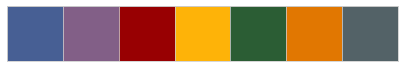

In [4]:
# import custom palette
import my_palette as mp

In [5]:
# read in actor dataset
df = pd.read_json('../data/capstone2_ds.json')

In [6]:
# observe dimensionality of dataset
df.shape

(11693, 28)

In [7]:
# separate data into features and target
X = df.drop('actor_value', axis=1)
y = df['actor_value']

In [8]:
# split dataset
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=27)

First, I will get a base model without tuning any of the default hyperparameters.

In [9]:
def get_xgbr_model(
    features, target, trials=None, iteration=None, params={}, booster='gbtree'):
    """Return XGBoost regressor model with option to modify hyperparameters"""
    # check if params need to be extracted from trials object
    if trials:
        # check if params need to be called by iteration number in trials object
        if iteration:
            params = trials.trials[iteration - 1]['result']['params']
        # extract params from best estimator of trials object
        else:
            params = trials.best_trial['result']['params']
    # instantiate regressor
    model = xgb.XGBRegressor(**params, objective='reg:squarederror', 
                     booster=booster, random_state=27, n_jobs=-1)
        
    model.fit(features, target)
    
    return model

In [10]:
def get_params(features, target, trials=None, iteration=None, params={}, booster='gbtree'):
    """Return only the hyperparameters of interest from an instantiated regressor"""
    model = get_xgbr_model(
        features, target, trials=trials, iteration=iteration, 
        params=params, booster=booster)
    series = pd.Series(
        model.get_params(), name='model_params').drop(
        ['base_score', 'booster', 'gamma', 'importance_type', 'max_delta_step', 
         'missing', 'n_jobs', 'nthread', 'objective', 'random_state', 'reg_alpha', 
         'reg_lambda', 'scale_pos_weight', 'seed', 'silent', 'verbosity'])
    
    return series

In [11]:
# get parameters for base model
get_params(X_train, y_train)

colsample_bylevel      1
colsample_bynode       1
colsample_bytree       1
learning_rate        0.1
max_depth              3
min_child_weight       1
n_estimators         100
subsample              1
Name: model_params, dtype: object

There are a lot of hyperparameters to tune.<br>
I will break them into three groups.<br>
 - Tree Structure Based Complexity Moderation (Bias/Variance Trade-off)
     - learning_rate: Controls amount errors are corrected from previous round 
         - Lower --> Smaller Weights --> Less Complexity
     - max_depth: Controls how deep trees are allowed to grow 
         - Higher --> More Layers in Trees --> More Complexity
     - min_child_weight: Controls weight required to create new node 
         - Higher --> More Samples Needed To Split a Node --> Less Complexity
     - n_estimators: The number of boosting rounds 
         - Higher --> More Trees --> More Complixity
 - Stochastic Based Complexity Moderation (Used to Lower Variance)
     - colsample_bylevel: Fraction of features to use at each level
         - Lower --> Sample is Less Representative of Data --> Less Complexity
     - subsample: Fraction of observations to use at each boosting round
         - Lower --> Sample is Less Representative of Data --> Less Complexity
 - Regularization Based Complexity Moderation (Used to Lower Variance)
     - reg_lambda: Ridge (L2) regularization
         - Higher --> Errors are more heavily penalized --> Less Complexity

I will use the mean absolute error (MAE) as my test statistic, as opposed to the root mean squared error (RMSE).<br>
The RMSE tends to increase more rapidly than the MAE, as the sample size increases.<br>
I will be using cross validation, extensively, throughout this analysis.<br>
Hense, RMSE may be problematic, when comparing errors between training and test performances.

In [12]:
def print_cv_mae(features, target, trials=None, iteration=None, params={}):
    """Print CV average mean absolute error and mean absolute error range"""
    # get fitted model
    model = get_xgbr_model(
        features, target, trials=trials, iteration=iteration, params=params)
    # perform 10 fold cross validation
    cv_results = cross_val_score(model, features, target, 
                                 scoring='neg_mean_absolute_error', cv=10, n_jobs=-1)
    # convert scores to positive values
    results = cv_results * -1
    # get scores range
    results_range = (np.min(results), np.max(results))
    # get average score
    ave_result = np.mean(cv_results) * -1
        
    return f'Average MAE: ${ave_result:,.2f} \
    CV Range: (${results_range[0]:,.2f}, ${results_range[1]:,.2f})'

In [13]:
# get cross-validation results
print_cv_mae(X_train, y_train)

'Average MAE: $57,127,935.33     CV Range: ($50,572,869.94, $63,098,750.89)'

To get some perspective on this loss, I'll show the broad range of average revenues for the actors' movies.

In [14]:
# get average movie revenue and revenue range for all actors in training data
f'Average target: ${np.mean(y_train):,.2f} \
    Target Range: (${np.min(y_train):,.2f}, ${np.max(y_train):,.2f})'

'Average target: $138,069,846.47     Target Range: ($1.24, $7,377,967,622.48)'

With this range so wide, it is important to observe the standard deviation of the data, as well.

In [15]:
# get standard deviation of movie revenue for all actors in training data
f'Standard Deviation of Target: ${np.std(y_train):,.2f}'

'Standard Deviation of Target: $286,149,782.92'

Though the average error is large, it is well within one standard deviation of the target values.

I will create some residual plots, now.

In [16]:
# get base model
xgbr_base = get_xgbr_model(X_train, y_train)
xgbr_base

XGBRegressor(n_jobs=-1, objective='reg:squarederror', random_state=27)

In [17]:
def plot_predictions(features, target, model):
    """Return plot of observed target vs. predictions"""
    X_train, X_test, y_train, y_test = train_test_split(
        features, target, test_size=0.2, random_state=27)

    sns.scatterplot(y_test, model.predict(X_test), color=mp.colors(1))
    sns.regplot(y_test, model.predict(X_test), color=mp.colors(6), scatter=False)
    
    plt.xlabel('Observed')
    plt.ylabel('Predicted')
    
    plt.title("Ground Truth vs Predicted")

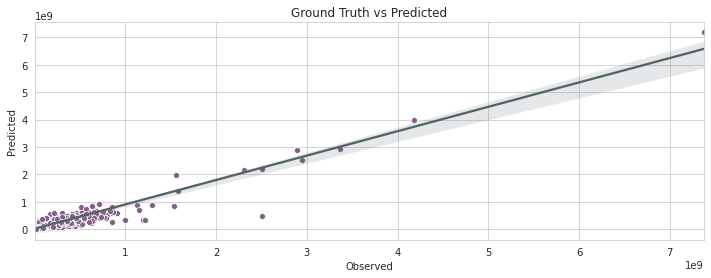

In [18]:
# plot observed target vs. predictions for out of the box xgbr model
plot_predictions(X_train, y_train, xgbr_base)

There's one extreme outlier that is quite obvious.

In [19]:
def plot_residuals(features, target, model):
    """Return plot of predictions vs.residuals"""
    X_train, X_test, y_train, y_test = train_test_split(
        features, target, test_size=0.2, random_state=27)

    sns.residplot(
        model.predict(X_test), y_test, lowess=True, scatter_kws={'s':10}, 
        color=mp.colors(2), line_kws={'linewidth':3})
    
    plt.xlabel('Predicted Actor Value')
    plt.ylabel('Residuals')
    
    plt.title("Predicted vs Residuals")

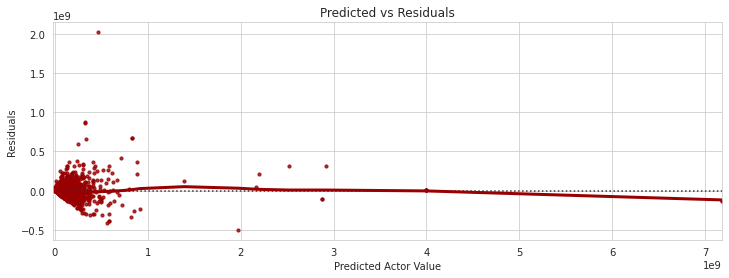

In [20]:
# plot predictions vs. residuals for out of the box xgbr model
plot_residuals(X_train, y_train, xgbr_base)

Aside from the handfull of outliers, the residual appear well distributed about 0.

In [21]:
def plot_residual_distribution(features, target, model):
    """Return plot of distribution of residuals"""
    X_train, X_test, y_train, y_test = train_test_split(
        features, target, test_size=0.2, random_state=27)
        
    sns.distplot(
        (y_test - model.predict(X_test)), bins=300, rug=True, axlabel='Residuals', 
        color=mp.colors(4))

    plt.ylabel('Frequency')

    plt.title('Distribution of Residuals')

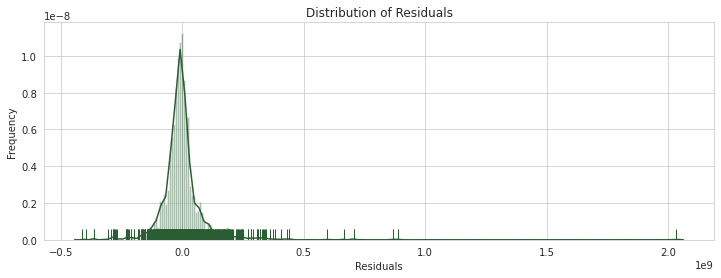

In [22]:
# plot residuals distribution for out of the box xgbr model
plot_residual_distribution(X_train, y_train, xgbr_base)

The distribution of residuals appers fairly normal, aside from the extreme outliers.

I will take a look at the feature importance for the predictions

In [23]:
def plot_feature_importance(model):
    """Plots the predictors by importance to model"""
    ax = xgb.plot_importance(model)
    ax.figure.set_size_inches(12, 8)

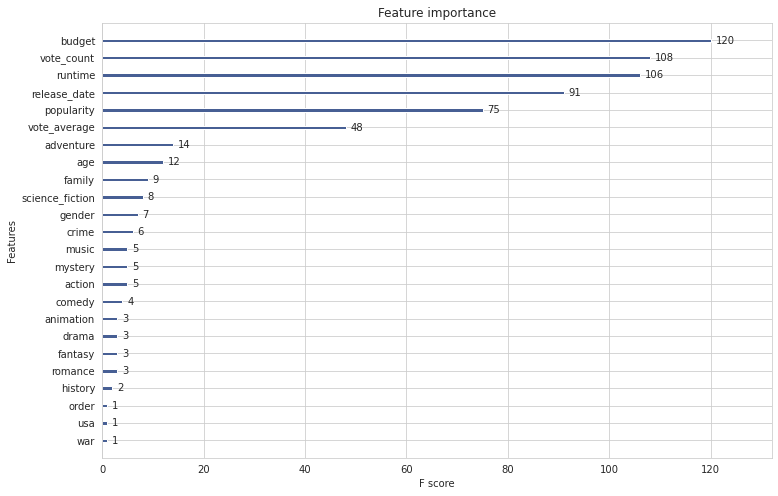

In [24]:
# get feature importance for model predictions
plot_feature_importance(xgbr_base)

It is not surprising that the budget is the most important feature for predicting revenue.<br>
I would not have expected runtime to be such a strong predictor, though.

I will perform an informed (Bayesian) search technique to find the best hyperparameters.<br>
This method has advantages over a brute force grid search, which tries all combinations of hyperparameters.<br>
It is closer to a random grid search, except the choices of parameters are based on the results of previous choices.

 > **BAYESIAN HYPERPARAMETER SEARCH**

My strategy will be to march through the hyperparameters, adding them one by one to the search.<br>
I will be looking for the best range of the current hyperparameter to keep, before progressing to the next one.<br>
This will help to reduce the number of possible local minima that the model may fall into along the search.<br>
It will reduce search time, as well, as some parameters are additive in computation time, as their ranges expand.<br>
Hense, I will be applying appropriate upper limits to those values during the search.

As hyperparameters are added, the optimal ranges for previous ones may change.<br>
I will be monitoring these needs along the way, making appropriate adjustments when necessary.<br>
I will plot cross validated results over a range of values to highlight the trade off between accuracy and overfitting.

The first hyperparameters to lock down are the number of estimators and the learning rate.<br>
Some literature suggests to begin by finding the best product of these two hyperparameters.<br>
In a nod to fluid dynamics, I will call this product the model's tree flow rate.

I'll target different numbers of trees, while searching over a range of tree flows.

I will start with observing the results of using only 10 trees.

In [25]:
# create tree flow search grid for 10 trees
num_trees = 10
tree_flow_range = np.linspace(0.1, 1, 10)
# create parameter search grid
param_grid = {
    'learning_rate': (tree_flow_range / num_trees).tolist(),
    'n_estimators': [num_trees]
}

print('tree_flow', tree_flow_range)
for param, param_lst in param_grid.items():
    print(param, param_lst)

tree_flow [0.1 0.2 0.3 0.4 0.5 0.6 0.7 0.8 0.9 1. ]
learning_rate [0.01, 0.02, 0.030000000000000006, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1]
n_estimators [10]


I have a dual goal of minimizing both the test error and the degree of overfitting.<br>
I will create a custom loss function that will guide the optimization procedure to a model that fulfills both goals.<br>
This will ensure that the final model is both accurate and generalizable.

The hybrid loss will be the sum of the test loss with the difference between the test loss and the training loss.

$Hybrid Loss=Test Error + Overfit Error$<br>
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;$= Test Loss + (Test Loss - Training Loss)$<br>
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;$= 2 * Test Loss - Training Loss$

In [26]:
def plot_hyperparameters(features, target, grid):
    """Plots CV results over range of one hyperparameter"""
    # instantiate model
    model = xgb.XGBRegressor(objective='reg:squarederror', random_state=27)
    # get scores from 10 fold CV over hyperparameter range
    gs_cv = GridSearchCV(model, grid, cv=10, n_jobs=-1, scoring='neg_mean_absolute_error', 
                         return_train_score=True, verbose=2).fit(features, target)
    # extract scores to DataFrame
    gs_df = pd.DataFrame(gs_cv.cv_results_)
    # separate scores and convert them to proper sign
    train_df = gs_df.loc[:, 'split0_train_score':'split9_train_score'].multiply(-1)
    test_df = gs_df.loc[:, 'split0_test_score':'split9_test_score'].multiply(-1)
    
    # get scores stats for plotting
    test_scores_mean = np.mean(test_df, axis=1)
    test_scores_std = np.std(test_df, axis=1)
    train_scores_mean = np.mean(train_df, axis=1)
    train_scores_std = np.std(train_df, axis=1)
    hybrid_scores_mean = 2 * test_scores_mean - train_scores_mean
    hybrid_scores_std = 2 * test_scores_std - train_scores_std
    
    # plot errors over range for variable hyperparameter
    var_param = {k:v for (k, v) in grid.items() if len(v) > 1}
    for param, param_lst in var_param.items():
        # plot hybrid scores
        sns.lineplot(x=param_lst, y=hybrid_scores_mean, label="Hybrid Score", lw=2)
        plt.fill_between(param_lst, hybrid_scores_mean - hybrid_scores_std,
                         hybrid_scores_mean + hybrid_scores_std, alpha=0.2, lw=2)
        # plot test scores
        sns.lineplot(x=param_lst, y=test_scores_mean, label="Test Score", lw=2)
        plt.fill_between(param_lst, test_scores_mean - test_scores_std,
                         test_scores_mean + test_scores_std, alpha=0.2, lw=2)
        # plot training scores
        sns.lineplot(x=param_lst, y=train_scores_mean, label="Training Score", lw=2)
        plt.fill_between(param_lst, train_scores_mean - train_scores_std,
                         train_scores_mean + train_scores_std, alpha=0.2, lw=2)
        
        plt.xlabel(param, fontsize=15)  
        plt.ylabel("MAE", fontsize=15)

        plt.legend(bbox_to_anchor=(1.2, 0.5), loc=5, fontsize='large')
        plt.title('Hyperparameters vs. Losses', fontsize=15)

Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 24 concurrent workers.
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    1.7s finished


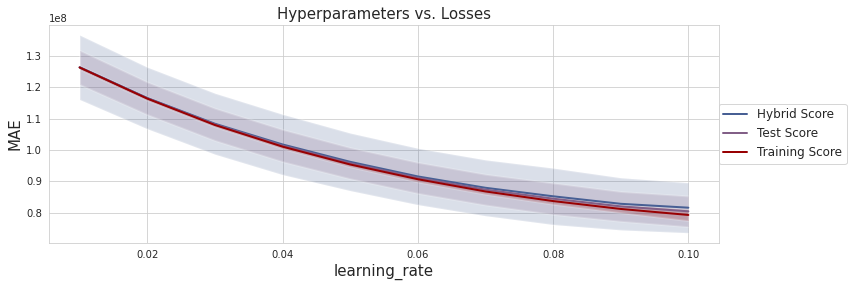

In [27]:
# plot cross validation results for hyperparameter range
plot_hyperparameters(X_train, y_train, param_grid)

Although there is almost no overfitting, the errors are a factor of 10 higher than what was observed with the base model.

I will show the results of using the default value of 100 trees.

In [28]:
# create tree flow search grid for 100 trees
num_trees = 100
tree_flow_range = np.linspace(1, 10, 10)
# create parameter search grid
param_grid = {
    'learning_rate': (tree_flow_range / num_trees).tolist(),
    'n_estimators': [num_trees]
}

print('tree_flow', tree_flow_range)
for param, param_lst in param_grid.items():
    print(param, param_lst)

tree_flow [ 1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]
learning_rate [0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1]
n_estimators [100]


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 24 concurrent workers.
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    4.4s finished


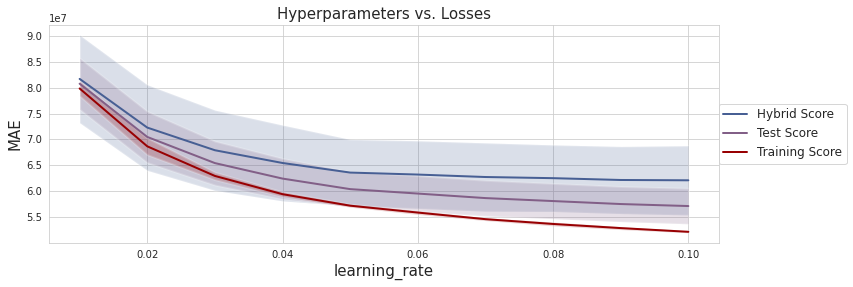

In [29]:
# plot cross validation results for hyperparameter range
plot_hyperparameters(X_train, y_train, param_grid)

The score for the base model can be found at the default value of 0.1 for the learning rate.<br>
For learning rate values less than 0.1, the test errors are higher, and the overfitting is less, as expected.

Now, I will increase the number of trees beyond the default value.

In [30]:
# create tree flow search grid for 500 trees
num_trees = 500
tree_flow_range = np.linspace(5, 50, 10)
# create parameter search grid
param_grid = {
    'learning_rate': (tree_flow_range / num_trees).tolist(),
    'n_estimators': [num_trees]
}

print('tree_flow', tree_flow_range)
for param, param_lst in param_grid.items():
    print(param, param_lst)

tree_flow [ 5. 10. 15. 20. 25. 30. 35. 40. 45. 50.]
learning_rate [0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1]
n_estimators [500]


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 24 concurrent workers.
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   20.9s finished


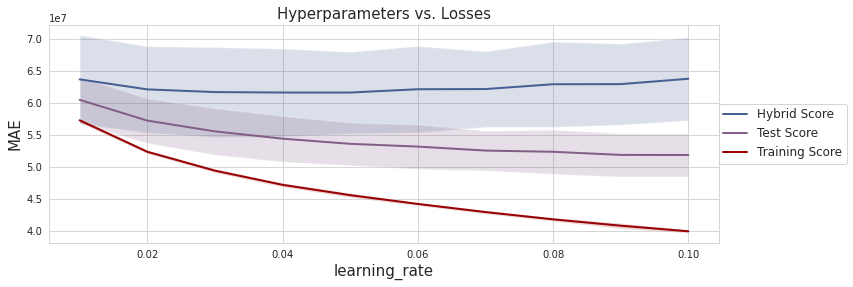

In [31]:
# plot cross validation results for hyperparameter range
plot_hyperparameters(X_train, y_train, param_grid)

The test errors continue to decline, but asymptotically.<br>
While, the overfitting is out of control.<br>
I don't expect to use this many trees, unless the hyperparameters that limit complexity are tuned enough to handle them.<br>
The optimal range for the number of trees seems to be centered about 100.

 > **n_estimators**

I will start with tuning the number of trees.<br>
Recall, the default value is 100.

In [32]:
# create parameter search grid for range of number of trees
param_grid = {
    'n_estimators': [int(x) for x in np.linspace(20, 300, num=57)]
}
# show values
for param, param_lst in param_grid.items():
    print(param, param_lst)

n_estimators [20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80, 85, 90, 95, 100, 105, 110, 115, 120, 125, 130, 135, 140, 145, 150, 155, 160, 165, 170, 175, 180, 185, 190, 195, 200, 205, 210, 215, 220, 225, 230, 235, 240, 245, 250, 255, 260, 265, 270, 275, 280, 285, 290, 295, 300]


Fitting 10 folds for each of 57 candidates, totalling 570 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 24 concurrent workers.
[Parallel(n_jobs=-1)]: Done 114 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 317 tasks      | elapsed:   13.1s
[Parallel(n_jobs=-1)]: Done 570 out of 570 | elapsed:   36.7s finished


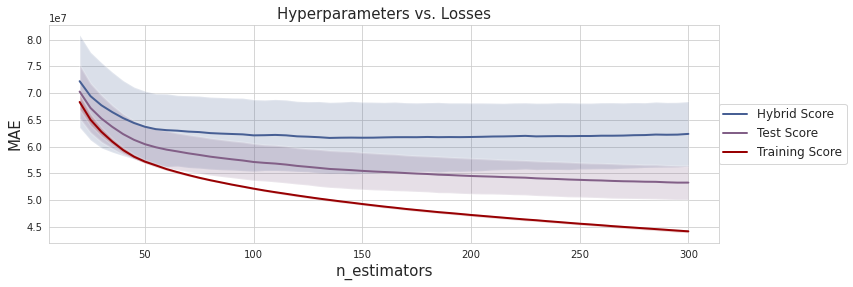

In [33]:
# plot cross validation results for hyperparameter range
plot_hyperparameters(X_train, y_train, param_grid)

The test error continues to decrease as the number of trees increases.<br>
The training score runs away from the test score rather quickly.<br>
At the default 100 trees, the model is already fairly overfit.<br>
The task ahead will be to decrease the test error, while keeping the training error from pulling away.

As I want my test error to be less than that of the base model, I will start with a minimum of 100 trees.<br>
I will put an upper limit of 250 on the number of trees to give some room for the model to explore.<br>
Later, I will be using other hyperparameters to offset this increase in model complexity.

I am using the results from Scikit Learn's Cross Validate module to supply the metrics needed to construct a hybrid loss.<br>
The module returns both the test and training scores from a 10 fold cross-validation on the training data.<br>
I will observe the ratio of average training loss to average test loss over each fold to get a sense of overfitting.<br>
The hybrid loss will be the metric that is being optimized during the search for the best estimators for each batch of trials.

In [34]:
def objective(params, features, target, booster):
    """Returns CV results for XGB regression"""
    # instantiate XGB Regressor
    xgbr = xgb.XGBRegressor(booster=booster, n_jobs=-1, **params)
    # enable iteration marker to be GLOBAL variable
    global global_iterations
    # update marker
    global_iterations += 1
    # get all scores from 10 fold cross-validation
    cv_results = cross_validate(xgbr, features, target, cv=10, n_jobs=-1, 
                                scoring='neg_mean_absolute_error', return_train_score=True)
    # convert scores to positive error
    train_mae = cv_results['train_score'] * -1
    test_mae = cv_results['test_score'] * -1    
    # get average scores from 10 fold cross-validation
    average_train_mae = np.mean(train_mae)
    average_test_mae = np.mean(test_mae)
    # define hybid loss
    hybrid_loss = 2 * average_test_mae - average_train_mae
    # get ratio of training score to test score
    tt_ratio = np.mean(np.divide(train_mae, test_mae))

    return {
        'trial': global_trials, 
        'batch': global_batches, 
        'iteration': global_iterations, 
        'loss': hybrid_loss, 
        'training_scores': average_train_mae, 
        'test_scores': average_test_mae,
        'scores_ratio': tt_ratio, 
        'params': params, 
        'status': STATUS_OK
    }

The optimization search will be callable for a maximum of 10 batches with a default of 100 fits for each batch.<br>
Early stopping will be called if the loss function has not improved over a full batch from the best value of the previous batch.

In [35]:
def run_trial_batches(features, target, hp_space, trials, booster='gbtree', 
                        batch_size=100, max_batches=10):
    """Runs informed search trials in batches with a cap on the number of batches"""
    # enable trial marker to be GLOBAL variable (allows continuation of existing trial)
    global global_trials
    global_trials +=1
    # check for newly initialized trials object
    if not trials.losses():
        # initialize best loss and number of iterations for new trials object
        last_best = 0
        last_iters = 0
    else:
        # initialize best loss and number of iterations from imported trials object
        last_best = trials.best_trial['result']['loss']
        last_iters = len(trials.losses())
    # initialize best loss for batch
    new_best = 0
    # initialize early stop flag
    early_stop = 'GO!'
    # run optimization search over all batches
    for batch in range(max_batches):
        # check for early stop
        if early_stop == 'GO!':
            # enable batch marker to be GLOBAL variable
            global global_batches
            # update trials batch counter
            global_batches += 1
            # set iterations argument for maximum evaluations parameter of fmin function
            n_iters = batch_size * (batch + 1) + last_iters
            # use partial function to enable selection of trials data
            fmin_objective = partial(objective, features=features, target=target, 
                                    booster=booster)
            # run one batch
            fmin(fn=fmin_objective, space=hp_space, max_evals=n_iters, trials=trials, 
                 algo=tpe.suggest, rstate=np.random.RandomState(27))
            # save updated results to M.2 (stores most recent trials object)
            pickle.dump(trials, open('xgbr_trials.pkl', 'wb'))
            # capture current optimal loss
            new_best = trials.best_trial['result']['loss']
            # check that batch optimized
            if last_best == new_best:
                early_stop = 'STOP!'
            last_best = new_best

Befor I start the search, I want to get a trials object for the base model for easy comparison.

 > **xgbr_trials_0**

In [36]:
# instantiate trials object for XGBoost Regressor optimization
xgbr_trials_0 = Trials()
# instantiate iteration marker
global_iterations = 0
# instantiate batch marker
global_batches = 0
# instantiate trial marker
global_trials = 0

In [37]:
# create informed search space  
hp_space = {
    'n_estimators': ho_scope.int(hp.uniform('n_estimators', 100, 100.1))
}
# call optimization function
fmin_objective = partial(objective, features=X_train, target=y_train, booster='gbtree')
fmin(fn=fmin_objective, space=hp_space, max_evals=1, trials=xgbr_trials_0, 
     algo=tpe.suggest, rstate=np.random.RandomState(27))
# save trials object
pickle.dump(xgbr_trials_0, open('./xgbr_trials/xgbr_trials_0.pkl', 'wb'))

100%|██████████| 1/1 [00:00<00:00,  1.36trial/s, best loss: 62104645.64861248]


I will be attempting to minimize the base model hybrid loss of 62,104,645.65.

In [38]:
# get base metrics
base_training_loss = xgbr_trials_0.best_trial['result']['training_scores']
base_test_loss = xgbr_trials_0.best_trial['result']['test_scores']
f'The base test loss is ${base_test_loss:,.2f}. \
The base overfit ratio is {base_training_loss / base_test_loss:,.2f}'

'The base test loss is $57,127,935.33. The base overfit ratio is 0.91'

 > **xgbr_trials_1**

In [39]:
# instantiate trials object for XGBoost Regressor optimization
xgbr_trials_1 = Trials()
# instantiate iteration marker
global_iterations = 0
# instantiate batch marker
global_batches = 0
# instantiate trial marker
global_trials = 0

In [40]:
# create informed search space  
hp_space = {
    'n_estimators': ho_scope.int(hp.uniform('n_estimators', 100, 250))
}
# call optimization function
run_trial_batches(X_train, y_train, hp_space, xgbr_trials_1)
# save trials object
pickle.dump(xgbr_trials_1, open('./xgbr_trials/xgbr_trials_1.pkl', 'wb'))

100%|██████████| 200/200 [01:38<00:00,  2.04trial/s, best loss: 61612067.18963752]


In [41]:
def plot_param_search(trials):
    """Plot iterations of optimization search for hyperparmeters"""
    # establish figure height (each hyperparameter + one optimization plot)
    num_subplots = len(trials.idxs.keys()) + 1
    fig_height = num_subplots * 4
    # establish subplots
    fig, axes = plt.subplots(nrows=num_subplots, figsize=(12, fig_height))
    # plot parameters of optimization run
    count = 1
    for key in trials.idxs:
        plt.subplot(num_subplots, 1, count)
        
        # get number of trials in run
        n_iters = len(trials.losses())
        # get iteration of optimal hybrid loss
        best_iter = trials.best_trial['tid'] + 1        
        # get value for hyperparameter of best model
        best_val = trials.argmin[key]
        # get list of hyperparameter values
        vals_lst = trials.vals[key]
        
        # adjust values for data type
        if key in ['max_depth', 'one_drop', 'n_estimators']:
            best_val = int(best_val)
            vals_lst = list(map(int, vals_lst))
        else:
            best_val = round(best_val, 6)

        # plot hyperparameters for optimization run
        plt.plot(range(1, len(trials.results) + 1), vals_lst, 
                 marker='o', color=mp.colors(4), alpha=0.8)        
        # mark off optimal hyperparameter value
        plt.hlines(best_val, n_iters * -0.05, n_iters * 1.05, linestyles = '--', 
                   label='Optimal \n' + str(key) + ': \n' + '{:,}'.format(best_val), 
                   colors=mp.colors(2))
        # mark iteration of optimal hybrid loss at hyperparameter value
        plt.plot(best_iter, best_val, marker='*', ms=15, color=mp.colors(2))
        count += 1
        
        plt.ylabel(key, fontsize=18)
        
        plt.legend(bbox_to_anchor=(1.31, 0.5), loc=5, fontsize='x-large')

    plt.subplot(num_subplots, 1, count)
    
    # get optimal hybrid loss value
    best_hybrid_loss = trials.best_trial['result']['loss']
    # get optimal test loss value
    best_test_loss = np.min([v['test_scores'] for v in trials.results])
    # get optimal training loss value
    best_training_loss = np.min([v['training_scores'] for v in trials.results])
    # set lower limit of plot
    y_min = np.min([best_hybrid_loss, best_test_loss, best_training_loss])
    
    # get largest hybrid loss value
    worst_hybrid_loss = np.max(trials.losses())
    # get largest test loss value
    worst_test_loss = np.max([v['test_scores'] for v in trials.results])
    # get largest training loss value
    worst_training_loss = np.max([v['training_scores'] for v in trials.results])
    # set upper limit of plot
    y_max = np.max([worst_hybrid_loss, worst_test_loss, worst_training_loss])
    
    # set y limits
    plt.ylim(y_min * 0.9, y_max * 1.1)
    
    # plot losses for optimization run
    sns.lineplot(x=range(1, n_iters + 1), 
                 y=trials.losses(), 
                 marker='o', label='Hybrid Loss')
    sns.lineplot(x=range(1, n_iters + 1), 
                 y=[v['test_scores'] for v in trials.results], 
                 marker='o', label='Test Loss')
    sns.lineplot(x=range(1, n_iters + 1), 
                 y=[v['training_scores'] for v in trials.results], 
                 marker='o', label='Training Loss')
    
    # mark off best hybrid loss
    plt.hlines(best_hybrid_loss, n_iters * -0.05, n_iters * 1.05, linestyles = '--', 
               colors='k')
    # mark iteration of optimal hybrid loss
    plt.plot(best_iter, best_hybrid_loss, marker='*', ms=15, color='k', 
             label='Hybrid Error: \n' + '${:,.2f}'.format(best_hybrid_loss))
    
    # get training and test loss for model with best hybrid loss
    corresponding_test_loss = trials.best_trial['result']['test_scores']
    corresponding_training_loss = trials.best_trial['result']['training_scores']
    # put training and test loss values for model with best hybrid loss in legend
    plt.plot(0, 0, linewidth=0, label='Test Error: \n' + '${:,.2f}'.format(
                   corresponding_test_loss))
    plt.plot(0, 0, linewidth=0, label='Training Error: \n' + '${:,.2f}'.format(
                   corresponding_training_loss))

    plt.xlabel('Iteration (Best Iteration: ' + str(best_iter) + ')', fontsize=15)
    plt.ylabel('MAE', fontsize=18)
    
    plt.legend(bbox_to_anchor=(1.33, 0.5), loc=5, fontsize='x-large', 
               title='Best Iteration', title_fontsize='x-large')
    plt.suptitle('Hyperparameter Optimization Sequence', y=0.93, fontsize=23)

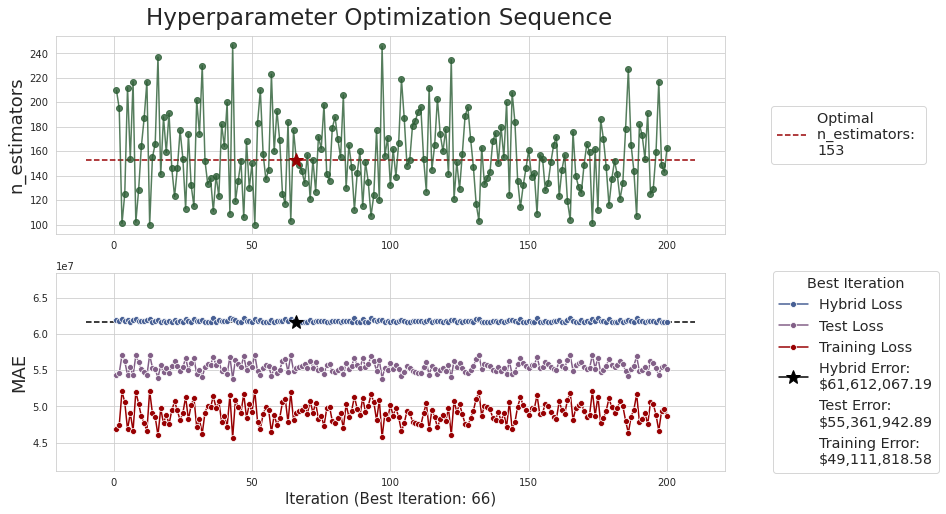

In [42]:
# plot informed search history
plot_param_search(xgbr_trials_1)

The informed search does not appear constrained by the range of allowable values for the number of trees.

The three losses being tracked will always appear in this order.<br>
The goals are to lower the test loss while bringing the training loss nearer to it.<br>
Individual improvements with respect to one of these goals will be seen in a lower hybrid loss.

In [43]:
def make_trials_df(trials):
    """Makes a DataFrame from results dict of objective function sorted by loss"""
    # convert dict to DataFrame
    trials_df = pd.DataFrame(trials.results)
    # extract nested parameter dicts to separate DataFrame
    params_df = pd.DataFrame(trials_df['params'].to_list())
    # combine DataFrames, clean up, and order by best losses
    trials_df = trials_df.drop(
        ['params', 'status'], axis=1).join(
        params_df).sort_values('loss', ascending=True)
    
    return trials_df

In [44]:
# get results DataFrame
trials_1_df = make_trials_df(xgbr_trials_1)
trials_1_df.head(10)

,trial,batch,iteration,loss,training_scores,test_scores,scores_ratio,n_estimators
71,1,1,72,6.161207e+07,4.911182e+07,5.536194e+07,0.890847,153
65,1,1,66,6.161207e+07,4.911182e+07,5.536194e+07,0.890847,153
106,1,2,107,6.161207e+07,4.911182e+07,5.536194e+07,0.890847,153
91,1,1,92,6.162513e+07,5.002799e+07,5.582656e+07,0.899867,135
145,1,2,146,6.164608e+07,4.997630e+07,5.581119e+07,0.899174,136
44,1,1,45,6.164608e+07,4.997630e+07,5.581119e+07,0.899174,136
77,1,1,78,6.164608e+07,4.997630e+07,5.581119e+07,0.899174,136
32,1,1,33,6.164637e+07,4.916270e+07,5.540453e+07,0.891115,152
45,1,1,46,6.164637e+07,4.916270e+07,5.540453e+07,0.891115,152
180,1,2,181,6.164637e+07,4.916270e+07,5.540453e+07,0.891115,152


The top models are all very close in hybrid losses, as well as their training to test scores ratios.

I will look at the distribution of values chosen for the hyperparameter during the search.

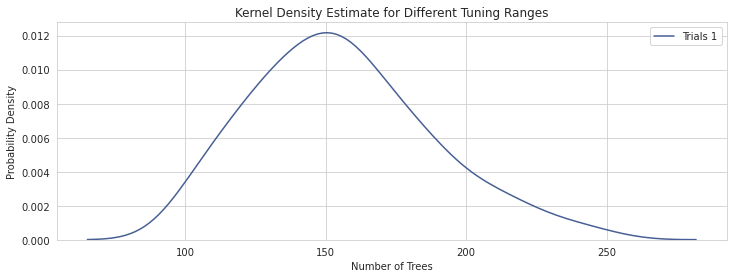

In [45]:
# plot kernel density estimates for number of boosting rounds
sns.kdeplot(trials_1_df['n_estimators'], label='Trials 1')

plt.xlabel('Number of Trees')
plt.ylabel('Probability Density')

plt.title('Kernel Density Estimate for Different Tuning Ranges');

The chosen range is supporting a balanced distribution of hyperparameters.

I will observe the losses over the range of hyperparameters to notice the effects of different choices.

In [46]:
def plot_one_param(trials, param, param_min=None, param_max=None):
    """Plots MAEs vs. one hyperparameter with the option to limit the range"""
    df = make_trials_df(trials)
    # check to see if range needs to be altered
    if (param_min and param_max):
        df = df[(df[param] > param_min) & (df[param] < param_max)]        
    # plot hyperparameters for optimization run
    sns.regplot(x=param, y='loss', data=df, 
        scatter_kws={"s": 10}, label='Hybrid Loss')
    sns.regplot(x=param, y='test_scores', data=df, 
        scatter_kws={"s": 10}, label='Test Loss')
    sns.regplot(x=param, y='training_scores', data=df, 
        scatter_kws={"s": 10}, label='Training Loss')

    plt.xlabel(param, fontsize=14)
    plt.ylabel('MAE', fontsize=14)
    
    plt.legend(bbox_to_anchor=(1.25, 0.5), loc=5, fontsize='x-large')

In [47]:
def plot_maes(trials):
    """Plots mean absolute errors for all hyperparameters"""
    # establish figure height
    num_subplots = len(trials.idxs)
    fig_height = num_subplots * 4
    # establish subplots
    fig, axes = plt.subplots(nrows=num_subplots, figsize=(12, fig_height))
    # plot hyperparameters of optimization run
    count = 1
    # get all hyperparameters in trials object
    for key in trials.idxs:
        plt.subplot(num_subplots, 1, count)
        # call hyperparameter plotting function
        plot_one_param(trials, key)
        
        plt.xlabel(key, fontsize=14)
        plt.ylabel('MAE', fontsize=14)
        
        plt.legend(bbox_to_anchor=(1.25, 0.5), loc=5, fontsize='x-large')
        count += 1
        
    plt.suptitle('Hyperparameter Informed Search Results', y=0.93, fontsize=23);

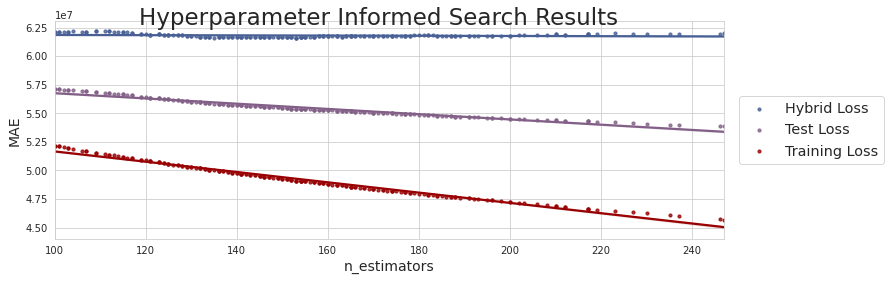

In [48]:
# plot hyperparameters vs. mean absolute errors
plot_maes(xgbr_trials_1)

As the number of trees increases, the test loss decreases, but the overfit is more, as well.<br>
The hybrid loss dips slightly at 120 trees, then holds steady as the trees increase.<br>
This suggests that the trade-off is not worth the computational cost at a certain point.

I will hold this number of trees and move on to the next hyperparameter.

 > **learning_rate**

I will continue the search, focusing on the weights of the corrections to the errors of the previous round.<br>
Recall, the default value is 0.1.

In [49]:
# get best hyperparameters from last trials
best_params = xgbr_trials_1.best_trial['result']['params']
# create parameter search grid
param_grid = {
    'learning_rate': np.linspace(0.01, 0.2, 20),
    'n_estimators': [best_params['n_estimators']]
}
# show values
for param, param_lst in param_grid.items():
    print(param, param_lst)

learning_rate [0.01 0.02 0.03 0.04 0.05 0.06 0.07 0.08 0.09 0.1  0.11 0.12 0.13 0.14
 0.15 0.16 0.17 0.18 0.19 0.2 ]
n_estimators [153]


Fitting 10 folds for each of 20 candidates, totalling 200 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 24 concurrent workers.
[Parallel(n_jobs=-1)]: Done 114 tasks      | elapsed:    7.2s
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:   12.4s finished


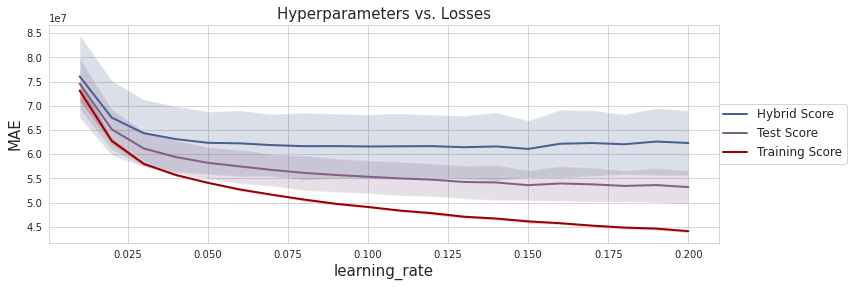

In [50]:
# plot cross validation results for hyperparameter range
plot_hyperparameters(X_train, y_train, param_grid)

The overfitting is very restrained for the small hyperparameter values.<br>
I will set the lower bound with a value of 0.05.

Like the number of trees, the test score continues to drop as these values increase.<br>
The trade-off value starts to diminish around 0.15, where there is negligible gain for the test scores.

 > **xgbr_trials_2**

In [51]:
# instantiate trials object for XGBoost Regressor optimization
xgbr_trials_2 = Trials()
# instantiate iteration marker
global_iterations = 0
# instantiate batch marker
global_batches = 0
# instantiate trial marker
global_trials = 0

In [52]:
# create informed search space  
hp_space = {
    'learning_rate': hp.uniform('learning_rate', 0.05, 0.15),
    'n_estimators': ho_scope.int(hp.uniform('n_estimators', 100, 250))
}
# call optimization function
run_trial_batches(X_train, y_train, hp_space, xgbr_trials_2)
# save trials object
pickle.dump(xgbr_trials_2, open('./xgbr_trials/xgbr_trials_2.pkl', 'wb'))

100%|██████████| 200/200 [01:31<00:00,  2.19trial/s, best loss: 60581515.62780177]


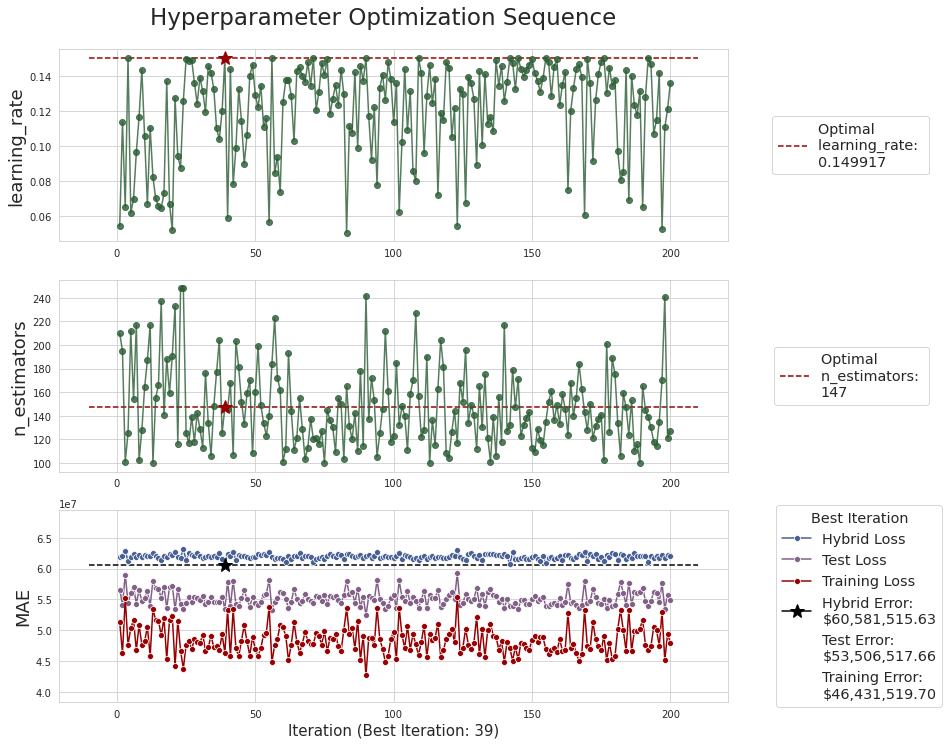

In [53]:
# plot informed search history
plot_param_search(xgbr_trials_2)

The values seem to be wide enough to allow exploration.

In [54]:
# get results DataFrame
trials_2_df = make_trials_df(xgbr_trials_2)
trials_2_df.head(10)

,trial,batch,iteration,loss,training_scores,test_scores,scores_ratio,learning_rate,n_estimators
38,1,1,39,6.058152e+07,4.643152e+07,5.350652e+07,0.871647,0.149917,147
141,1,2,142,6.068621e+07,4.715663e+07,5.392142e+07,0.878406,0.149904,132
154,1,2,155,6.089302e+07,4.698176e+07,5.393739e+07,0.874848,0.149893,135
70,1,1,71,6.097763e+07,4.787812e+07,5.442788e+07,0.883586,0.149892,120
60,1,1,61,6.101633e+07,4.916835e+07,5.509234e+07,0.895963,0.137245,112
191,1,2,192,6.108585e+07,4.684990e+07,5.396787e+07,0.871854,0.149981,139
175,1,2,176,6.117778e+07,4.909151e+07,5.513465e+07,0.894473,0.149901,102
3,1,1,4,6.120276e+07,4.766271e+07,5.443273e+07,0.879628,0.149949,125
169,1,2,170,6.124524e+07,4.748292e+07,5.436408e+07,0.877535,0.149734,128
152,1,2,153,6.125973e+07,4.888618e+07,5.507296e+07,0.891676,0.130733,119


Although the scores ratio is not as good, the overall hybrid loss is decreasing.

In [55]:
def plot_kde(trials_dict):
    """Plot range of hyperparameters for each trial given"""
    # create empty dict to hold DataFrames of trials parameters
    df_dict = {}
    # fill dict with each DataFrame
    for trial, num in trials_dict.items():
        # create default dict to sort values of hyperparameters
        param_dict = defaultdict(list)
        # extract iterations
        for d in trial.miscs:
            # sort values from iteration
            for key, val in d['vals'].items():
                param_dict[key].append(val[0])
            # store sorted hyperparameter values from each trial in DataFrame
            param_df = pd.DataFrame(param_dict)
        # add DataFrame to dict
        df_dict[num] = param_df
    # get maximum number of hyperparameters to establish subplots
    n_rows = max([len(x.columns) for x in df_dict.values()])
    fig_height = n_rows * 4
    fig, axes = plt.subplots(nrows=n_rows, figsize=(12, fig_height))
    # create empty dict to map hyperparameters to axes numbers
    axes_dict = {}
    ax_num = -1
    # expand my color palette by looping it three times
    my_palette = ['xkcd:' + c for c in mp.my_colors] * 3
    # sort hyperparameters out of DataFrames
    for num, df in df_dict.items():
        # get list of hyperparameters from DataFrame
        cols_lst = list(df.columns)
        # go through hyperparameters and plot
        for param in cols_lst:
            # build axes mapper
            if param not in list(axes_dict.keys()):
                ax_num += 1
                axes_dict[param] = ax_num
            # plot kernel density estimate for hyperparameter
            g = sns.kdeplot(df[param], label=num, color=my_palette[num - 1], 
                        ax=axes[axes_dict[param]])
            g.set_xlabel(param, fontsize=15)
            g.set_ylabel('Probability Density', fontsize=15)

    plt.suptitle('Kernel Density Estimates for Different Tuning Ranges', fontsize=15)
    plt.subplots_adjust(top=0.95)

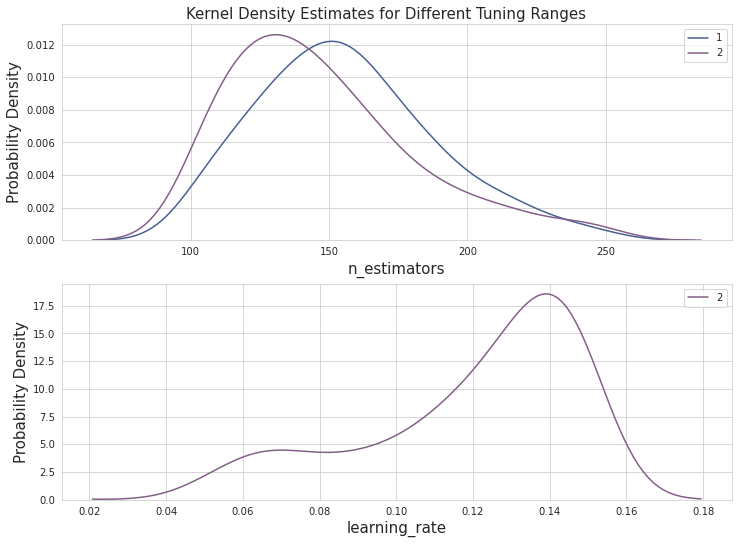

In [56]:
# assemble desired trial runs
_dict = {xgbr_trials_1: 1, 
         xgbr_trials_2: 2
        }
# plot the results, so far
plot_kde(_dict)

This search used less trees on average.

There are two local minima that were heavily searched with respect to the learning rate.

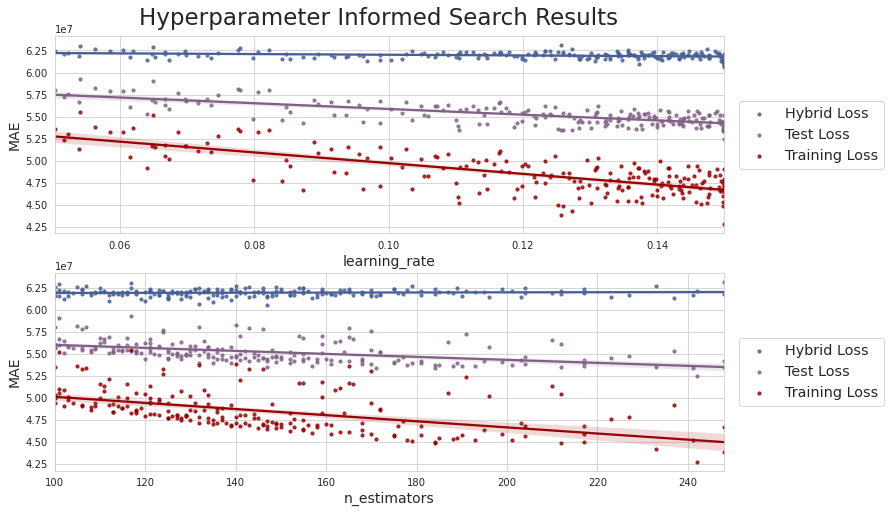

In [57]:
# plot hyperparameters vs. mean absolute errors
plot_maes(xgbr_trials_2)

The hybrid loss lines are fairly horizontal.<br>
Both hyperparameters tend to overfit with higher values.

These values are set for now.

The next hyperparameters to tune will be the max depth and the min child weight.<br>
Again, it is suggested to tune these two hyperparameters at the same time, as they influence each other.<br>
Child creation is performed greedily. The nodes want to be split, giving a tendency toward overfitting.<br>
If trees are not allowed to add more layers, the samples in each node become heavier.<br>
Likewise, if nodes are not allowed to split until they obtain a critical weight, model complexity will be constrained.<br>
Continuing with the physics nomenclature, I will observe a hypothetical parameter and call it the model's tree potential.

I'll target different node weights, while searching over a range of tree potentials.

I will start with observing the results of using a node weight of only 1, the default.

In [58]:
# get best hyperparameters from last trials
best_params = xgbr_trials_2.best_trial['result']['params']
# create tree potential search grid for 10 trees
node_weight = 1
tree_potential_range = np.linspace(1, 10, 10)
# create parameter search grid
param_grid = {
    'learning_rate': [best_params['learning_rate']],
    'max_depth': [int(x) for x in (tree_potential_range / node_weight).tolist()],
    'min_child_weight': [node_weight],
    'n_estimators': [best_params['n_estimators']]
}

print('tree_potential', tree_potential_range)
for param, param_lst in param_grid.items():
    print(param, param_lst)

tree_potential [ 1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]
learning_rate [0.14991652864784943]
max_depth [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
min_child_weight [1]
n_estimators [147]


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 24 concurrent workers.
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   12.3s finished


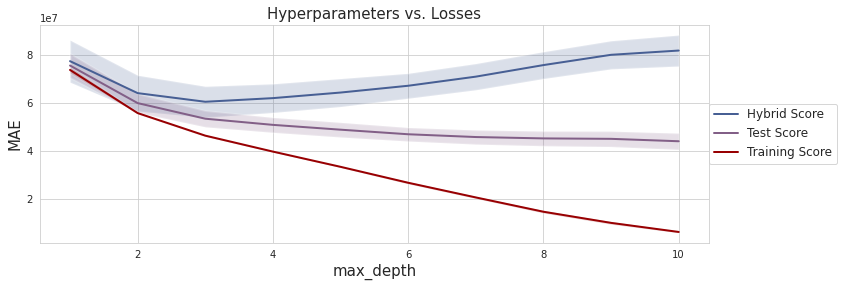

In [59]:
# plot cross validation results for hyperparameter range
plot_hyperparameters(X_train, y_train, param_grid)

As the trees are allowed to grow deeper, the test score decreases, but the model quickly becomes overfit.<br>
A maximum tree depth of 3 is the optimal value for a node weight of 1.

I will look at the results for a node weight of 3.

In [60]:
# get best hyperparameters from last trials
best_params = xgbr_trials_2.best_trial['result']['params']
# create tree potential search grid for 10 trees
node_weight = 3
tree_potential_range = np.linspace(3, 30, 10)
# create parameter search grid
param_grid = {
    'learning_rate': [best_params['learning_rate']],
    'max_depth': [int(x) for x in (tree_potential_range / node_weight).tolist()],
    'min_child_weight': [node_weight],
    'n_estimators': [best_params['n_estimators']]
}

print('tree_potential', tree_potential_range)
for param, param_lst in param_grid.items():
    print(param, param_lst)

tree_potential [ 3.  6.  9. 12. 15. 18. 21. 24. 27. 30.]
learning_rate [0.14991652864784943]
max_depth [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
min_child_weight [3]
n_estimators [147]


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 24 concurrent workers.
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   11.8s finished


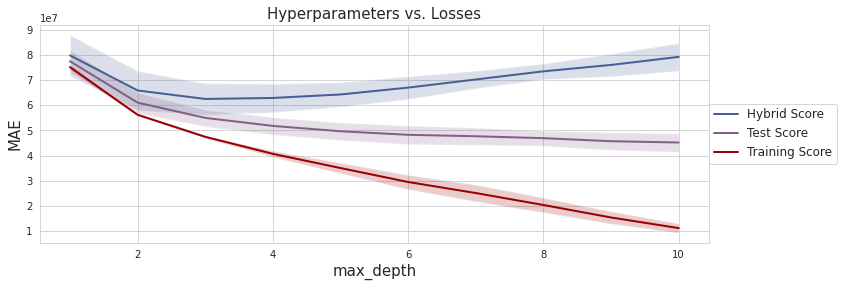

In [61]:
# plot cross validation results for hyperparameter range
plot_hyperparameters(X_train, y_train, param_grid)

Similar results are observed for node weight 3, with strong overfitting occuring for maximum tree depth values above 4.<br>
The hybrid loss is a bit higher, though.

Finally, I'll try a node weight value of 5.

In [62]:
# get best hyperparameters from last trials
best_params = xgbr_trials_2.best_trial['result']['params']
# create tree potential search grid for 10 trees
node_weight = 5
tree_potential_range = np.linspace(5, 50, 10)
# create parameter search grid
param_grid = {
    'learning_rate': [best_params['learning_rate']],
    'max_depth': [int(x) for x in (tree_potential_range / node_weight).tolist()],
    'min_child_weight': [node_weight],
    'n_estimators': [best_params['n_estimators']]
}

print('tree_potential', tree_potential_range)
for param, param_lst in param_grid.items():
    print(param, param_lst)

tree_potential [ 5. 10. 15. 20. 25. 30. 35. 40. 45. 50.]
learning_rate [0.14991652864784943]
max_depth [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
min_child_weight [5]
n_estimators [147]


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 24 concurrent workers.
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   10.8s finished


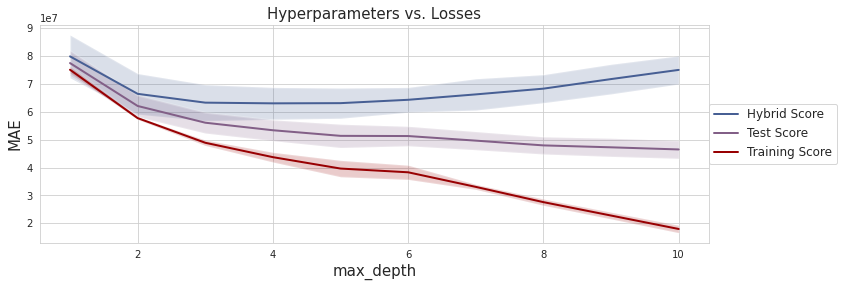

In [63]:
# plot cross validation results for hyperparameter range
plot_hyperparameters(X_train, y_train, param_grid)

Once again, the optimal tree depth is 3, but the models resist heavy overfitting up to a  maximum tree depth of 6.

I will begin to tune these hypermarameters.<br>
Trees deeper than 6 layers tend to be strongly overfit.<br>
I'll begin my search with an upper bound of 8 on these values to allow for exploration, as local minima are discovered.

 > **max_depth**

I'll continue with tuning the hyperparameter that limits the maximum number of levels the trees are allowed to grow.<br>
Recall, the default value is 3.

In [64]:
# get best hyperparameters from last trials
best_params = xgbr_trials_2.best_trial['result']['params']
# create parameter search grid
param_grid = {
    'learning_rate': [best_params['learning_rate']],
    'max_depth': [int(x) for x in np.linspace(1, 8, num=8)],
    'n_estimators': [best_params['n_estimators']]
}
# show values
for param, param_lst in param_grid.items():
    print(param, param_lst)

learning_rate [0.14991652864784943]
max_depth [1, 2, 3, 4, 5, 6, 7, 8]
n_estimators [147]


Fitting 10 folds for each of 8 candidates, totalling 80 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 24 concurrent workers.
[Parallel(n_jobs=-1)]: Done  74 out of  80 | elapsed:    7.2s remaining:    0.6s
[Parallel(n_jobs=-1)]: Done  80 out of  80 | elapsed:    8.0s finished


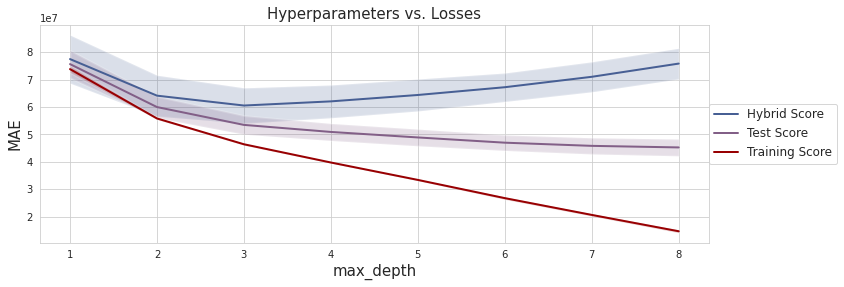

In [65]:
# plot cross validation results for hyperparameter range
plot_hyperparameters(X_train, y_train, param_grid)

Once again, 3 is the optimal depth, but this may change as the other hyperparameters vary.

 > **xgbr_trials_3**

In [66]:
# instantiate trials object for XGBoost Regressor optimization
xgbr_trials_3 = Trials()
# instantiate iteration marker
global_iterations = 0
# instantiate batch marker
global_batches = 0
# instantiate trial marker
global_trials = 0

In [67]:
# create informed search space  
hp_space = {
    'learning_rate': hp.uniform('learning_rate', 0.05, 0.15),
    'max_depth': ho_scope.int(hp.uniform('max_depth', 1, 8)), 
    'n_estimators': ho_scope.int(hp.uniform('n_estimators', 100, 250))
}
# call optimization function
run_trial_batches(X_train, y_train, hp_space, xgbr_trials_3)
# save trials object
pickle.dump(xgbr_trials_3, open('./xgbr_trials/xgbr_trials_3.pkl', 'wb'))

100%|██████████| 400/400 [02:12<00:00,  3.02trial/s, best loss: 59697185.02861355]


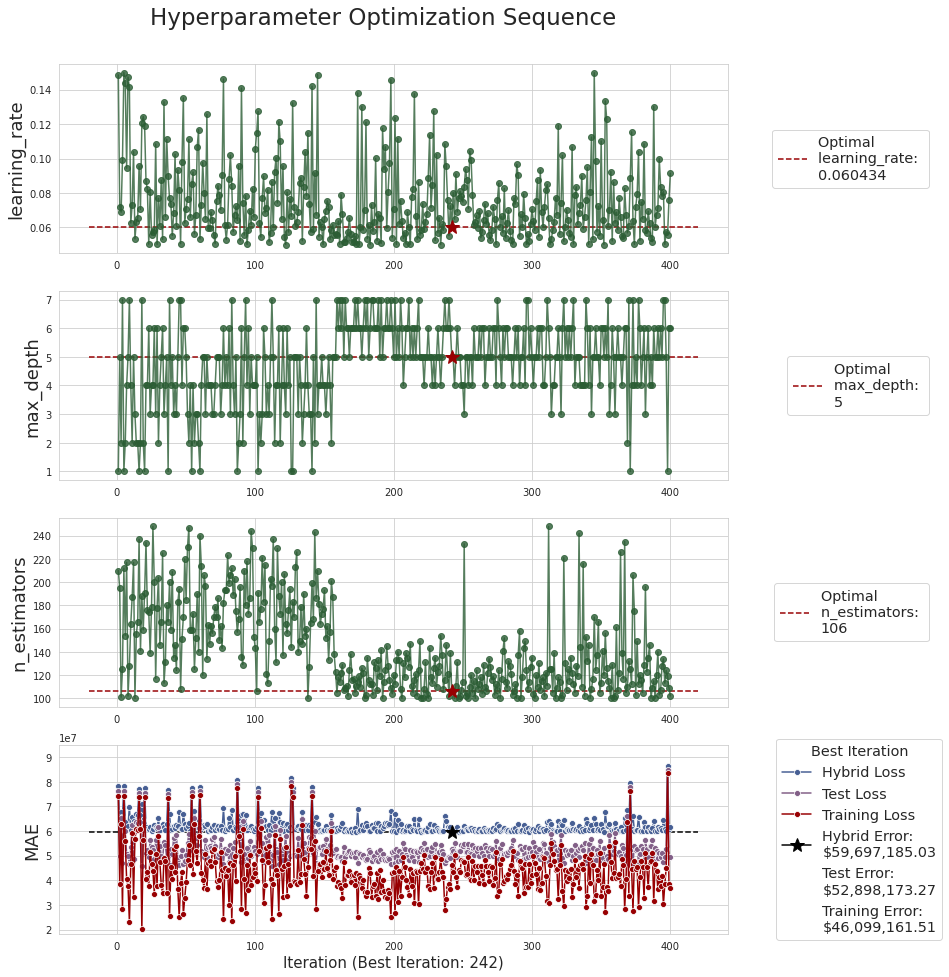

In [68]:
# plot informed search history
plot_param_search(xgbr_trials_3)

The selections of values for learning rate and number of trees are hitting the lower bound.<br>
I will look for benefits in making adjustments to these hyperparameters.

In [69]:
# get results DataFrame
trials_3_df = make_trials_df(xgbr_trials_3)
trials_3_df.head(10)

,trial,batch,iteration,loss,training_scores,test_scores,scores_ratio,learning_rate,max_depth,n_estimators
241,1,3,242,5.969719e+07,4.609916e+07,5.289817e+07,0.874350,0.060434,5,106
312,1,4,313,5.972047e+07,4.624260e+07,5.298154e+07,0.875740,0.050156,5,125
172,1,2,173,5.972249e+07,4.290752e+07,5.131501e+07,0.838632,0.050073,6,111
246,1,3,247,5.973240e+07,4.430304e+07,5.201772e+07,0.854923,0.077058,5,100
219,1,3,220,5.973346e+07,4.685700e+07,5.329523e+07,0.882117,0.058653,5,100
201,1,3,202,5.975717e+07,4.552789e+07,5.264253e+07,0.867749,0.050146,5,133
297,1,3,298,5.976223e+07,4.670170e+07,5.323197e+07,0.880205,0.052057,5,114
169,1,2,170,5.976949e+07,4.209747e+07,5.093348e+07,0.828954,0.051525,6,116
351,1,4,352,5.982760e+07,4.661414e+07,5.322087e+07,0.879028,0.050035,5,120
182,1,2,183,5.983882e+07,4.291429e+07,5.137655e+07,0.837580,0.050032,6,112


The losses have improved, slightly.<br>
The overfitting ratio is getting better, as well.

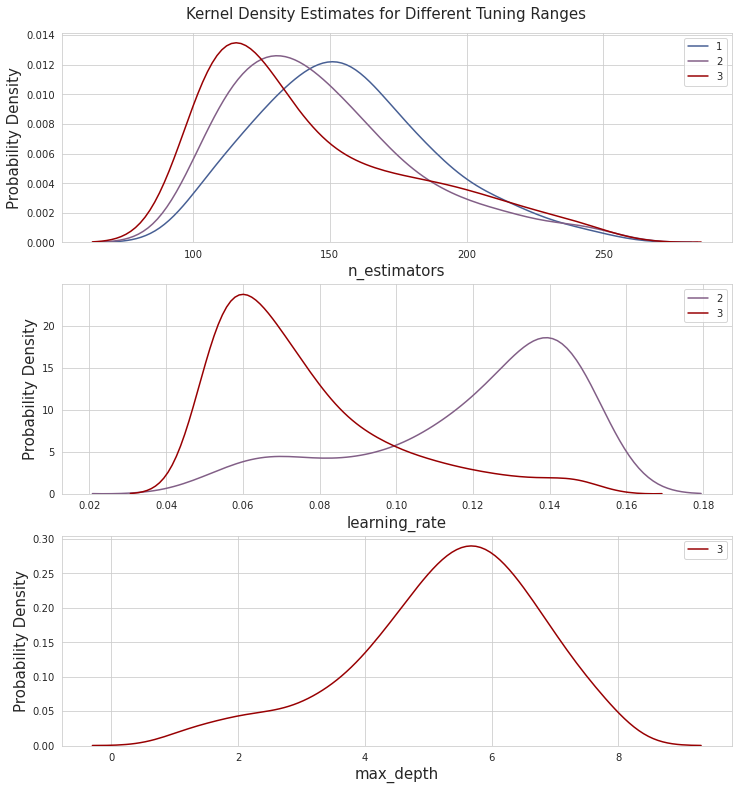

In [70]:
# assemble desired trial runs
_dict = {xgbr_trials_1: 1, 
         xgbr_trials_2: 2, 
         xgbr_trials_3: 3
        }
# plot the results, so far
plot_kde(_dict)

Again, the favoritism for the lower bounds by the learning rate and number of trees hyperparameters is obvious.<br>
I will make adjustments to them, now.

The range of tree depth looks suitable.

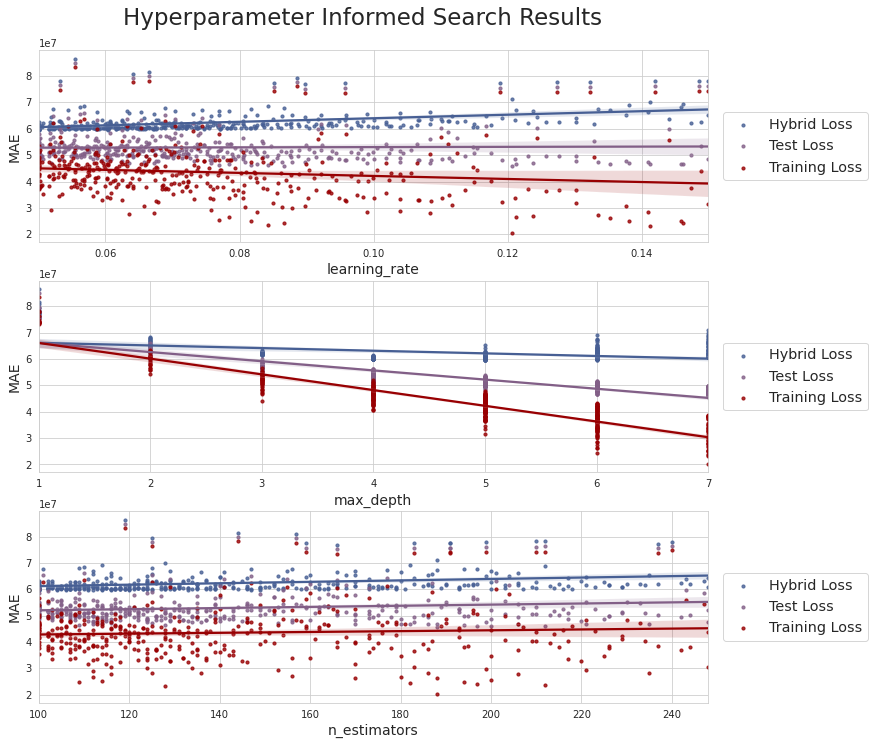

In [71]:
# plot hyperparameters vs. mean absolute errors
plot_maes(xgbr_trials_3)

Looking at the larger values for the number of trees, there are large errors pulling the fitted hybrid line upward.<br>
I will observe what shrinking the upper bound of those values will yield.

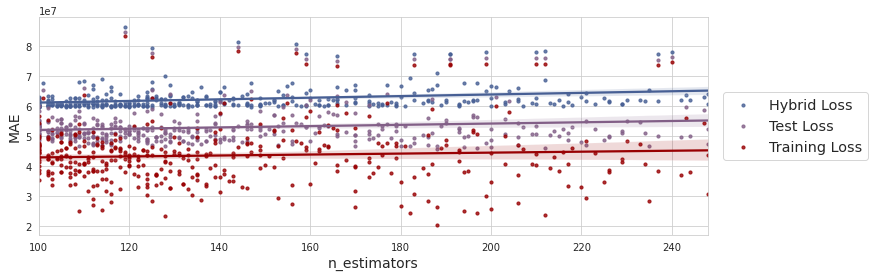

In [72]:
# showing full range for comparison
plot_one_param(xgbr_trials_3, 'n_estimators')

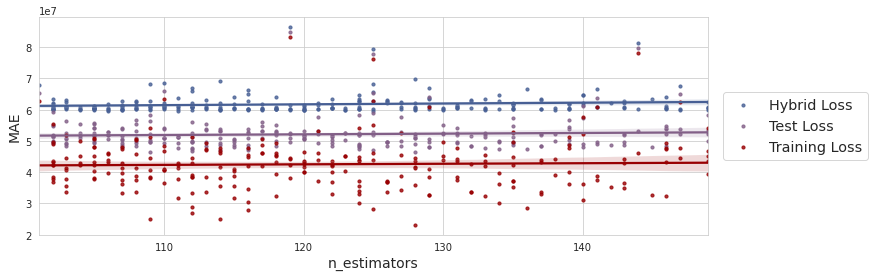

In [73]:
# shift range to smaller values
plot_one_param(xgbr_trials_3, 'n_estimators', 100, 150)

I will shift the range to be between 50 and 150 trees.<br>
I don't have the data for values lower than 100 estimators, but I can show this effect, using a GridSearch.

In [74]:
# get best hyperparameters from last trials
best_params = xgbr_trials_3.best_trial['result']['params']
# create parameter search grid
param_grid = {
    'learning_rate': [best_params['learning_rate']],
    'max_depth': [best_params['max_depth']],
    'n_estimators': [int(x) for x in np.linspace(30, 200, num=18)]
}
# show values
for param, param_lst in param_grid.items():
    print(param, param_lst)

learning_rate [0.06043352482325727]
max_depth [5]
n_estimators [30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 130, 140, 150, 160, 170, 180, 190, 200]


Fitting 10 folds for each of 18 candidates, totalling 180 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 24 concurrent workers.
[Parallel(n_jobs=-1)]: Done 114 tasks      | elapsed:    7.0s
[Parallel(n_jobs=-1)]: Done 180 out of 180 | elapsed:   13.5s finished


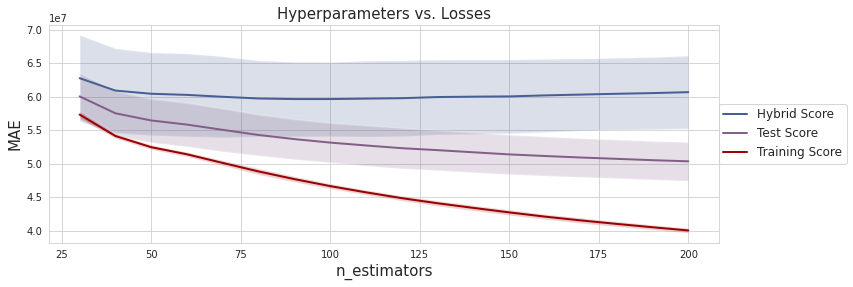

In [75]:
# plot cross validation results for hyperparameter range
plot_hyperparameters(X_train, y_train, param_grid)

The high number of trees impacts the overfit, too much.

 > **xgbr_trials_4**

In [76]:
# instantiate trials object for XGBoost Regressor optimization
xgbr_trials_4 = Trials()
# instantiate iteration marker
global_iterations = 0
# instantiate batch marker
global_batches = 0
# instantiate trial marker
global_trials = 0

In [77]:
# create informed search space  
hp_space = {
    'learning_rate': hp.uniform('learning_rate', 0.05, 0.15),
    'max_depth': ho_scope.int(hp.uniform('max_depth', 1, 8)), 
    'n_estimators': ho_scope.int(hp.uniform('n_estimators', 50, 150))
}
# call optimization function
run_trial_batches(X_train, y_train, hp_space, xgbr_trials_4)
# save trials object
pickle.dump(xgbr_trials_4, open('./xgbr_trials/xgbr_trials_4.pkl', 'wb'))

100%|██████████| 200/200 [01:43<00:00,  1.92trial/s, best loss: 59565451.8544541]


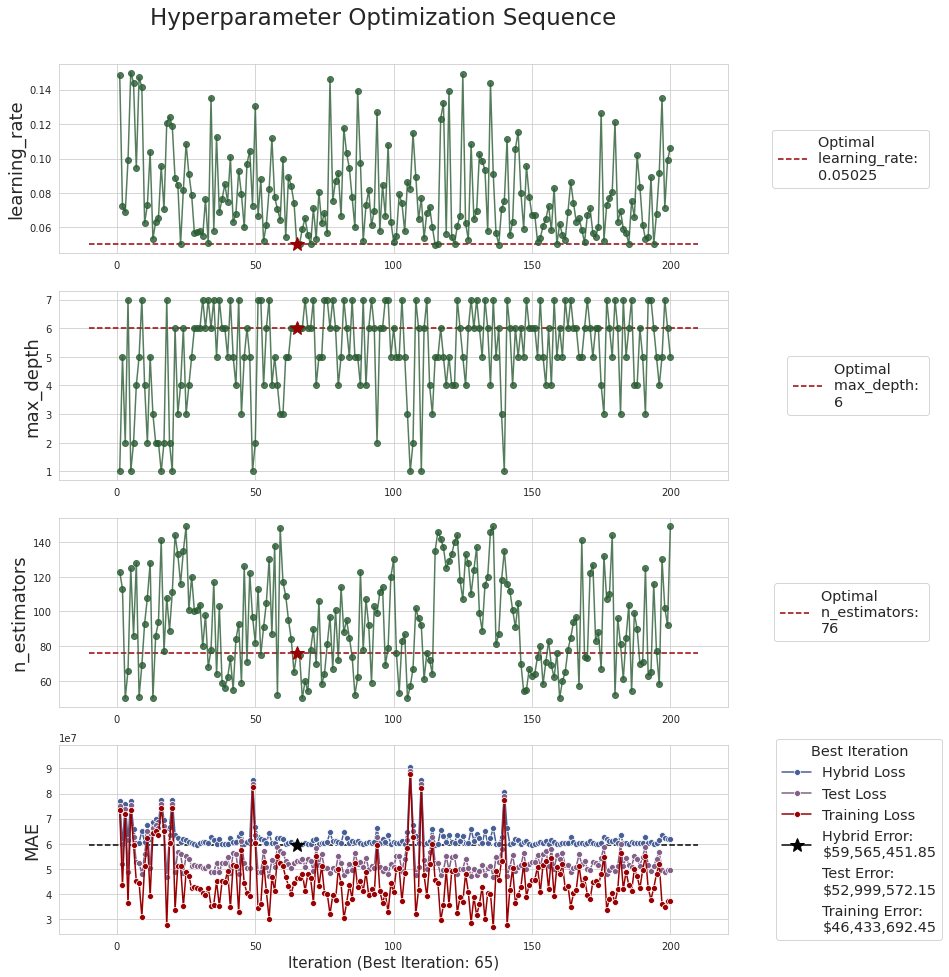

In [78]:
# plot informed search history
plot_param_search(xgbr_trials_4)

With that adjustment, the learning rate is not struggling to find useful values as much.

In [79]:
# get results DataFrame
trials_4_df = make_trials_df(xgbr_trials_4)
trials_4_df.head(10)

,trial,batch,iteration,loss,training_scores,test_scores,scores_ratio,learning_rate,max_depth,n_estimators
64,1,1,65,5.956545e+07,4.643369e+07,5.299957e+07,0.878327,0.050250,6,76
114,1,2,115,5.960972e+07,4.545347e+07,5.253160e+07,0.868327,0.050011,5,135
28,1,1,29,5.966019e+07,4.245494e+07,5.105756e+07,0.834036,0.057321,6,101
149,1,2,150,5.971784e+07,4.576773e+07,5.274279e+07,0.870228,0.067154,6,63
173,1,2,174,5.973982e+07,4.357843e+07,5.165913e+07,0.845957,0.060470,6,88
193,1,2,194,5.975739e+07,4.244487e+07,5.110113e+07,0.833086,0.050340,6,116
37,1,1,38,5.976921e+07,4.519355e+07,5.248138e+07,0.863480,0.076486,6,59
168,1,2,169,5.979464e+07,4.644732e+07,5.312098e+07,0.876608,0.051212,6,74
60,1,1,61,5.980505e+07,4.666526e+07,5.323516e+07,0.879346,0.054276,5,109
184,1,2,185,5.981018e+07,4.362017e+07,5.171518e+07,0.845948,0.050534,6,104


The lower values of the learning rate tend to pay off more, though.

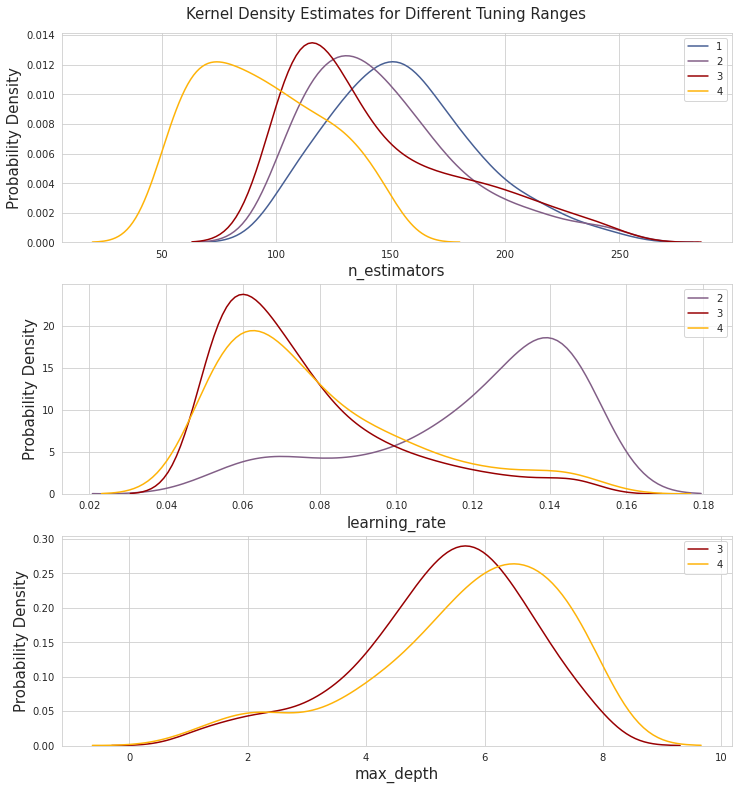

In [80]:
# assemble desired trial runs
_dict = {xgbr_trials_1: 1, 
         xgbr_trials_2: 2, 
         xgbr_trials_3: 3, 
         xgbr_trials_4: 4
        }
# plot the results, so far
plot_kde(_dict)

Although the distribution of the number of trees selected is stacked low, I don't want to have fewer than 50, at this point.

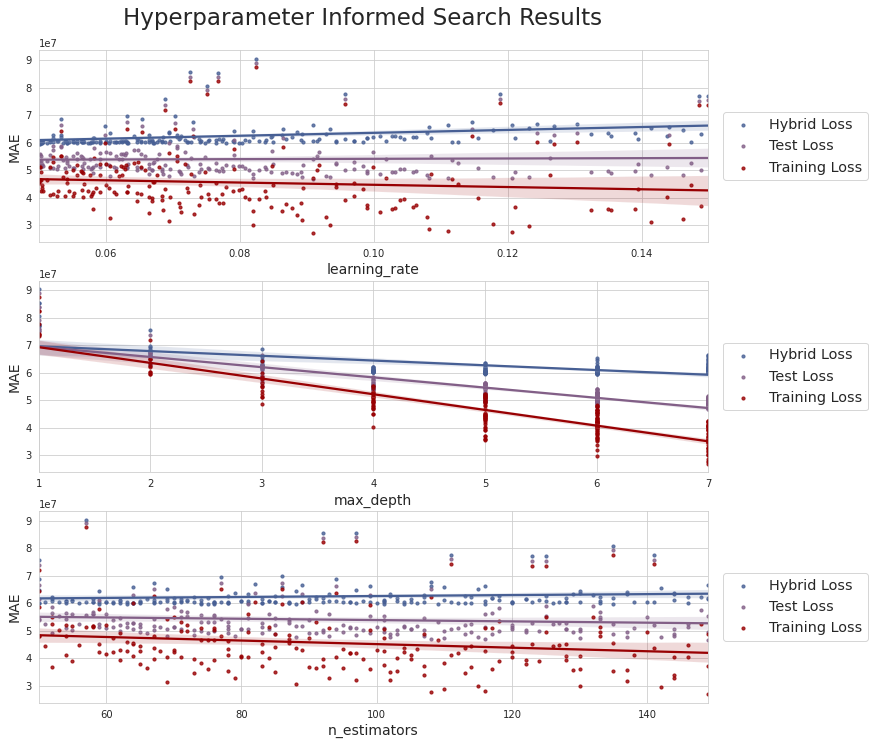

In [81]:
# plot hyperparameters vs. mean absolute errors
plot_maes(xgbr_trials_4)

I'm looking to exclude some of the values of learning rates that are increasing the overfit.<br>
I'll show what that would look like by removing the values above 0.1.

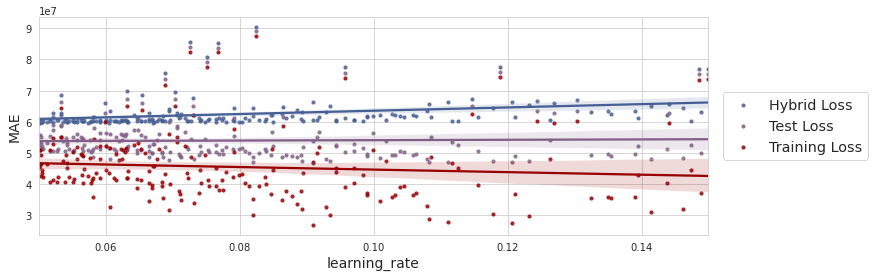

In [82]:
# showing full range for comparison
plot_one_param(xgbr_trials_4, 'learning_rate')

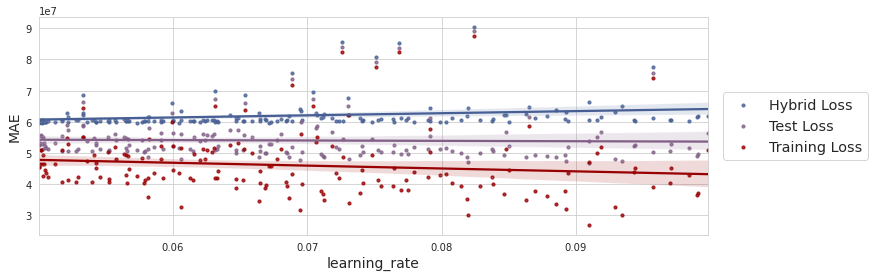

In [83]:
# shorten range of small values
plot_one_param(xgbr_trials_4, 'learning_rate', 0.05, 0.1)

The hybrid loss curve is a bit more flattened, now.

In [84]:
# get best hyperparameters from last trials
best_params = xgbr_trials_4.best_trial['result']['params']
# create parameter search grid
param_grid = {
    'learning_rate': np.linspace(0.02, 0.15, 21),
    'max_depth': [best_params['max_depth']],
    'n_estimators': [best_params['n_estimators']]
}
# show values
for param, param_lst in param_grid.items():
    print(param, param_lst)

learning_rate [0.02   0.0265 0.033  0.0395 0.046  0.0525 0.059  0.0655 0.072  0.0785
 0.085  0.0915 0.098  0.1045 0.111  0.1175 0.124  0.1305 0.137  0.1435
 0.15  ]
max_depth [6]
n_estimators [76]


Fitting 10 folds for each of 21 candidates, totalling 210 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 24 concurrent workers.
[Parallel(n_jobs=-1)]: Done 114 tasks      | elapsed:    7.4s
[Parallel(n_jobs=-1)]: Done 210 out of 210 | elapsed:   13.0s finished


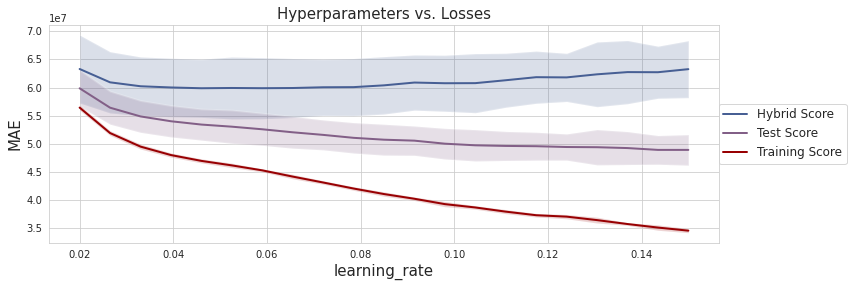

In [85]:
# plot cross validation results for hyperparameter range
plot_hyperparameters(X_train, y_train, param_grid)

I will reduce the upper bound to 0.1 for the learning rate.

 > **xgbr_trials_5**

In [86]:
# instantiate trials object for XGBoost Regressor optimization
xgbr_trials_5 = Trials()
# instantiate iteration marker
global_iterations = 0
# instantiate batch marker
global_batches = 0
# instantiate trial marker
global_trials = 0

In [87]:
# create informed search space  
hp_space = {
    'learning_rate': hp.uniform('learning_rate', 0.05, 0.1),
    'max_depth': ho_scope.int(hp.uniform('max_depth', 1, 8)), 
    'n_estimators': ho_scope.int(hp.uniform('n_estimators', 50, 150))
}
# call optimization function
run_trial_batches(X_train, y_train, hp_space, xgbr_trials_5)
# save trials object
pickle.dump(xgbr_trials_5, open('./xgbr_trials/xgbr_trials_5.pkl', 'wb'))

100%|██████████| 300/300 [01:18<00:00,  3.83trial/s, best loss: 59301113.62719317]


Great. I have more success.

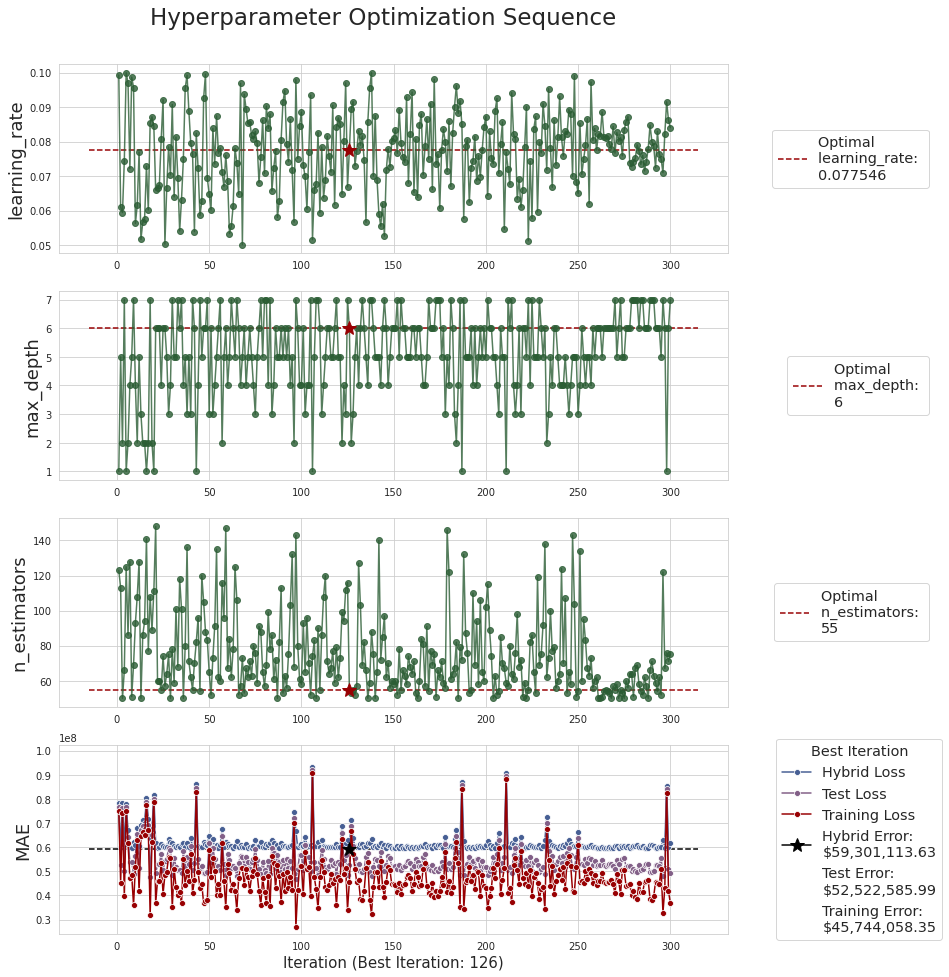

In [88]:
# plot informed search history
plot_param_search(xgbr_trials_5)

The ranges seem appropriate.

In [89]:
# get results DataFrame
trials_5_df = make_trials_df(xgbr_trials_5)
trials_5_df.head(10)

,trial,batch,iteration,loss,training_scores,test_scores,scores_ratio,learning_rate,max_depth,n_estimators
125,1,2,126,5.930111e+07,4.574406e+07,5.252259e+07,0.873430,0.077546,6,55
264,1,3,265,5.947390e+07,4.528682e+07,5.238036e+07,0.866985,0.081058,6,55
296,1,3,297,5.950745e+07,4.300005e+07,5.125375e+07,0.841301,0.082128,6,67
277,1,3,278,5.955661e+07,4.463606e+07,5.209633e+07,0.859007,0.073886,6,64
261,1,3,262,5.958654e+07,4.596209e+07,5.277432e+07,0.873225,0.081559,6,50
263,1,3,264,5.960562e+07,4.547694e+07,5.254128e+07,0.867900,0.081423,6,54
238,1,3,239,5.963650e+07,4.861742e+07,5.412696e+07,0.901230,0.081189,5,60
70,1,1,71,5.964500e+07,4.782264e+07,5.373382e+07,0.893037,0.085252,5,62
260,1,3,261,5.965720e+07,4.596425e+07,5.281072e+07,0.872796,0.082132,6,50
292,1,3,293,5.967118e+07,4.523551e+07,5.245335e+07,0.864605,0.082962,6,54


The number of trees used by the best models shows the benifit of lowering the upper bound.

The losses continue to decline.

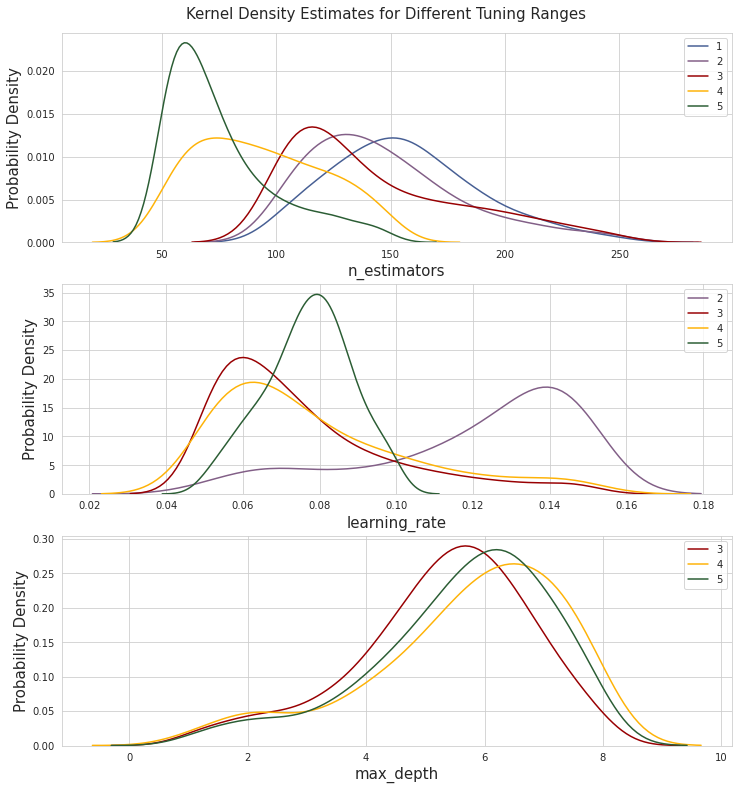

In [90]:
# assemble desired trial runs
_dict = {xgbr_trials_1: 1, 
         xgbr_trials_2: 2, 
         xgbr_trials_3: 3, 
         xgbr_trials_4: 4, 
         xgbr_trials_5: 5
        }
# plot the results, so far
plot_kde(_dict)

With the additional hyperparameter tuning, the number of trees used by improved models is lower.

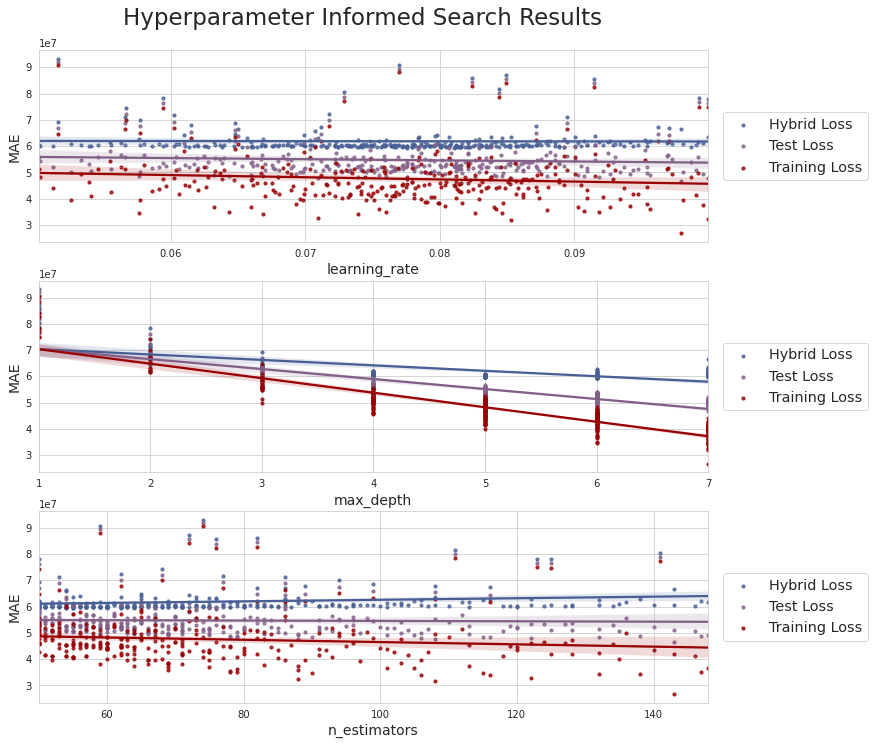

In [91]:
# plot hyperparameters vs. mean absolute errors
plot_maes(xgbr_trials_5)

These results are good enough to move ahead to the next hyperparameter.

 > **min_child_weight**

Now, I will tune the minimum weight needed to split a node.<br>
Recall, the default value is 1.

In [92]:
# get best hyperparameters from last trials
best_params = xgbr_trials_5.best_trial['result']['params']
# create parameter search grid
param_grid = {
    'learning_rate': [best_params['learning_rate']],
    'min_child_weight': [int(x) for x in np.linspace(1, 10, num=10)], 
    'n_estimators': [best_params['n_estimators']]
}
# show values
for param, param_lst in param_grid.items():
    print(param, param_lst)

learning_rate [0.07754621599688898]
min_child_weight [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
n_estimators [55]


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 24 concurrent workers.
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    2.5s finished


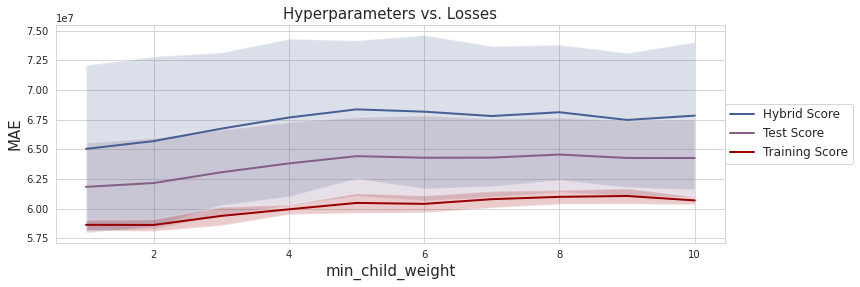

In [93]:
# plot cross validation results for hyperparameter range
plot_hyperparameters(X_train, y_train, param_grid)

There doesn't appear to be any benefit to increasing the node weights.<br>
I will investigate this assumption.

 > **xgbr_trials_6**

In [94]:
# instantiate trials object for XGBoost Regressor optimization
xgbr_trials_6 = Trials()
# instantiate iteration marker
global_iterations = 0
# instantiate batch marker
global_batches = 0
# instantiate trial marker
global_trials = 0

In [95]:
# create informed search space  
hp_space = {
    'learning_rate': hp.uniform('learning_rate', 0.05, 0.1),
    'max_depth': ho_scope.int(hp.uniform('max_depth', 1, 8)), 
    'min_child_weight': ho_scope.int(hp.uniform('min_child_weight', 1, 10)), 
    'n_estimators': ho_scope.int(hp.uniform('n_estimators', 50, 150))
}
# call optimization function
run_trial_batches(X_train, y_train, hp_space, xgbr_trials_6)
# save trials object
pickle.dump(xgbr_trials_6, open('./xgbr_trials/xgbr_trials_6.pkl', 'wb'))

100%|██████████| 600/600 [01:23<00:00,  7.22trial/s, best loss: 59300115.31075585]


By chance, the trials ran to 6 batches.<br>
This gives these trials a better chance of finding an better model than the last trial.

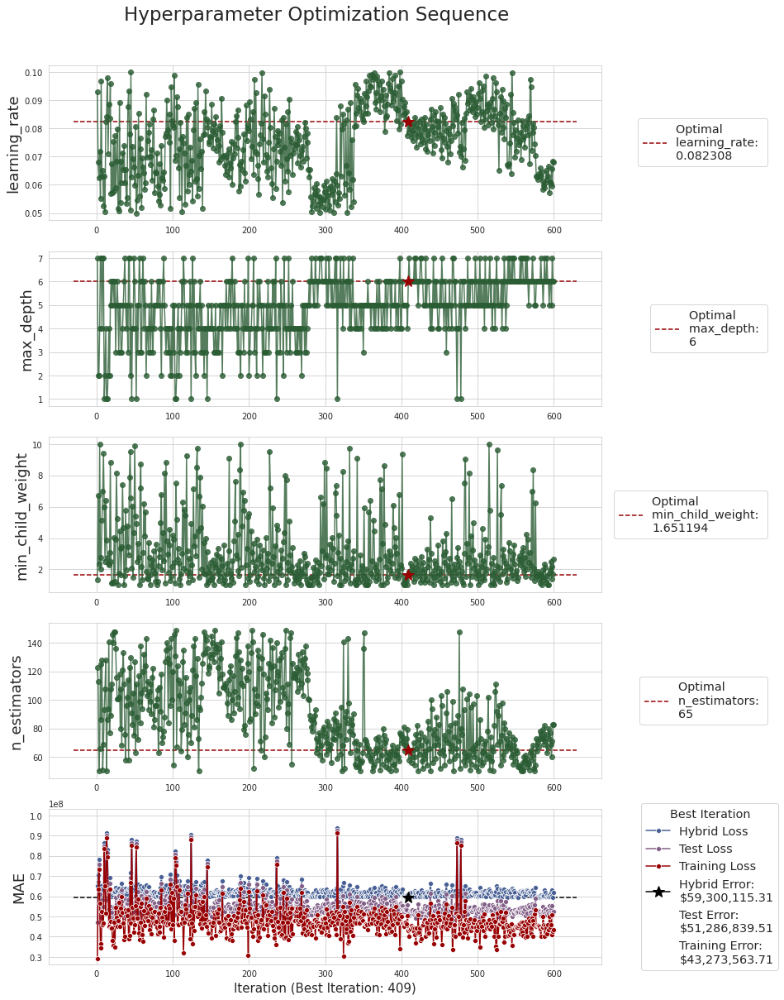

In [96]:
# plot informed search history
plot_param_search(xgbr_trials_6)

A low value for minimum child weight is preferred.

In [97]:
# get results DataFrame
trials_6_df = make_trials_df(xgbr_trials_6)
trials_6_df.head(10)

,trial,batch,iteration,loss,training_scores,test_scores,scores_ratio,learning_rate,max_depth,min_child_weight,n_estimators
408,1,5,409,5.930012e+07,4.327356e+07,5.128684e+07,0.846380,0.082308,6,1,65
484,1,5,485,5.947265e+07,4.825948e+07,5.386606e+07,0.898863,0.085481,5,1,60
357,1,4,358,5.951491e+07,4.616157e+07,5.283824e+07,0.876580,0.098795,5,1,64
580,1,6,581,5.954299e+07,4.507699e+07,5.230999e+07,0.864237,0.062959,6,1,73
552,1,6,553,5.958183e+07,4.547526e+07,5.252854e+07,0.867698,0.083028,6,1,53
598,1,6,599,5.959498e+07,4.265041e+07,5.112269e+07,0.836760,0.068397,6,1,83
538,1,6,539,5.963018e+07,4.522826e+07,5.242922e+07,0.865015,0.067184,6,1,68
576,1,6,577,5.964529e+07,4.498547e+07,5.231538e+07,0.862319,0.063158,6,1,73
410,1,5,411,5.964793e+07,4.341160e+07,5.152977e+07,0.844825,0.081779,6,1,65
340,1,4,341,5.966684e+07,4.661895e+07,5.314290e+07,0.880204,0.085434,5,1,71


The losses have all improved, but the top model's overfit ratio is getting worse.

All of the top 10 models chose a node weight value of 1, as expected.

In [98]:
# observe value used by top 33% of models
trials_6_df['min_child_weight'][:200].value_counts()

1    200
Name: min_child_weight, dtype: int64

There is no advantage to a model chosing value other than 1 for node weight.

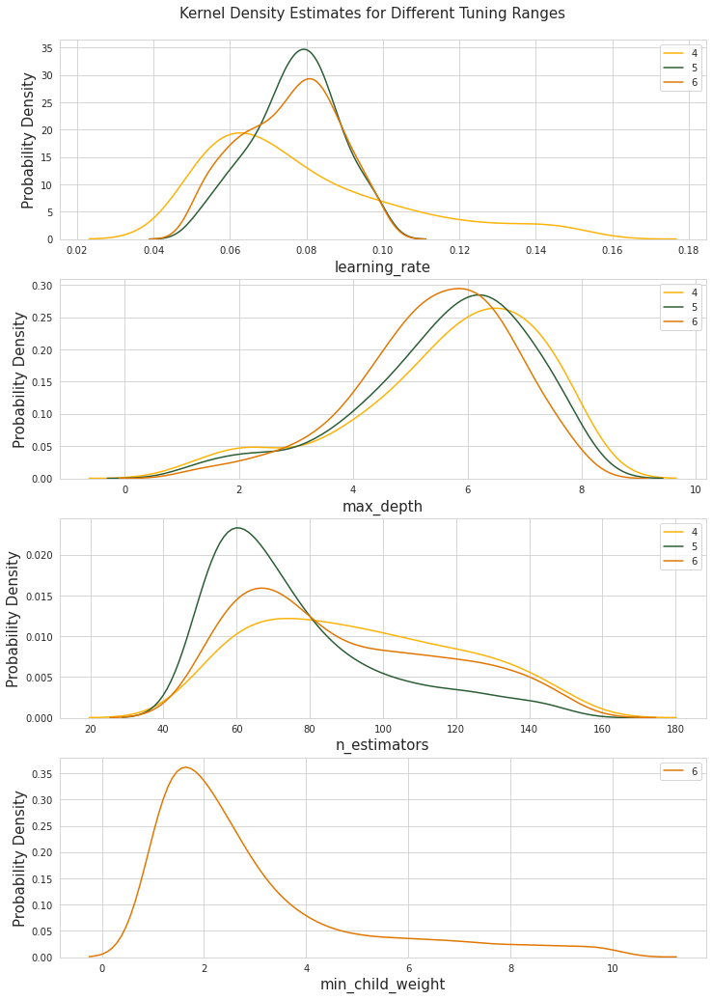

In [99]:
# assemble desired trial runs
_dict = {xgbr_trials_4: 4, 
         xgbr_trials_5: 5, 
         xgbr_trials_6: 6
        }
# plot the results, so far
plot_kde(_dict)

The ranges all look good.

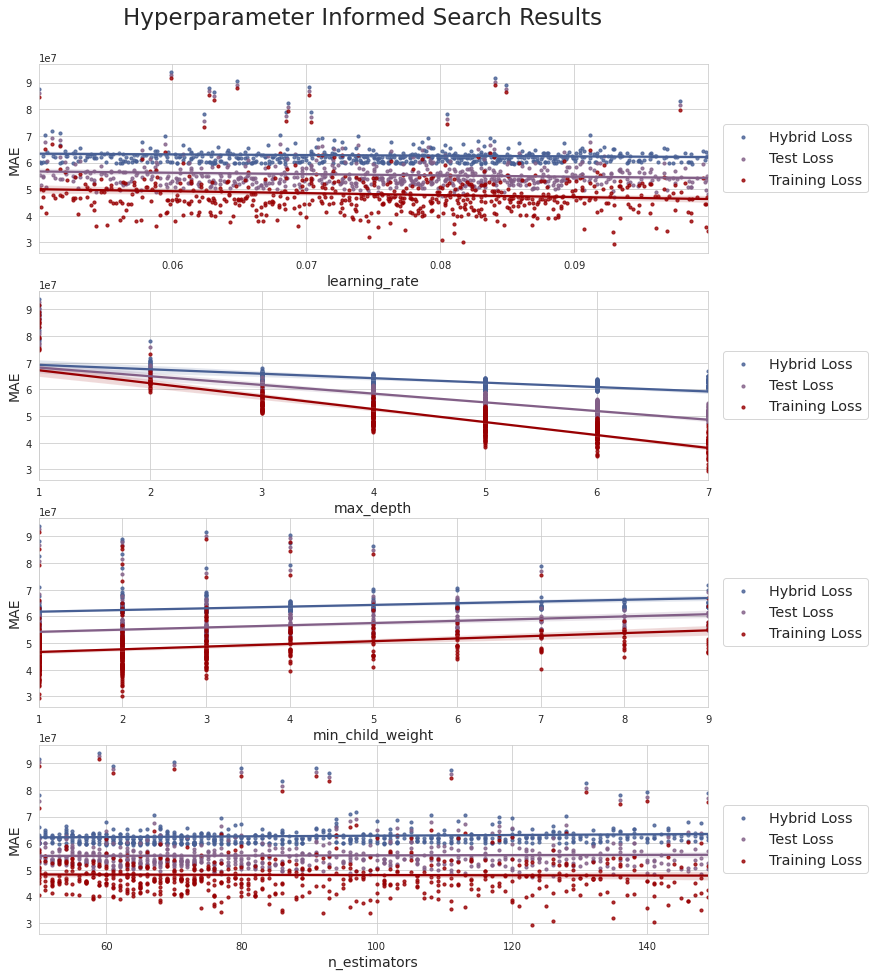

In [100]:
# plot hyperparameters vs. mean absolute errors
plot_maes(xgbr_trials_6)

These losses all look good, as well.

Before I add the additional sampling hyperparameters, I want to observe the progress, so far.

In [101]:
def join_losses(trials_dict):
    """Extracts losses and hyperparameters for best estimator of each trials object"""
    # specify columns to extract
    loss_cols = ['loss', 'training_scores', 'test_scores', 'scores_ratio']
    # instantiate empty DataFrame
    df = pd.DataFrame()
    # iterate through trials objects
    for key, value in trials_dict.items():
        # extract metrics
        loss_df = pd.DataFrame(
            key.best_trial['result'], index=[value], columns=loss_cols)
        # extract parameters for best estimator of each trial session
        params_df = pd.DataFrame(
            key.best_trial['result']['params'], index=[value])
        # put it all together
        trials_df = loss_df.join(params_df)
        df = pd.concat([df, trials_df])
        df.reset_index()
        
    return df

In [102]:
def plot_metrics(trials_dict):
    """Plot loss metrics and ratio of training and test losses for best ensembles"""
    # establish subplots
    fig, axes = plt.subplots(nrows=2, figsize=(12, 9))
    # construct DataFrame
    df = join_losses(trials_dict)
    # plot loss metrics
    plt.subplot(2, 1, 1)
    sns.lineplot(x=df.index, y='loss', data=df, label='Hybrid Loss')
    sns.lineplot(x=df.index, y='test_scores', data=df, label='Test Loss')
    sns.lineplot(x=df.index, y='training_scores', data=df, label='Training Loss')
    
    plt.ylabel('MAE', fontsize=15)

    plt.legend()
    plt.title('Mean Absolute Errors for Best Ensamble of Each Trial')
    # plot training test loss ratio
    plt.subplot(2, 1, 2)
    sns.lineplot(x=df.index, y='scores_ratio', data=df)
    
    plt.xlabel('Trials', fontsize=15)
    plt.ylabel('Training to Test Loss Ratio', fontsize=15)

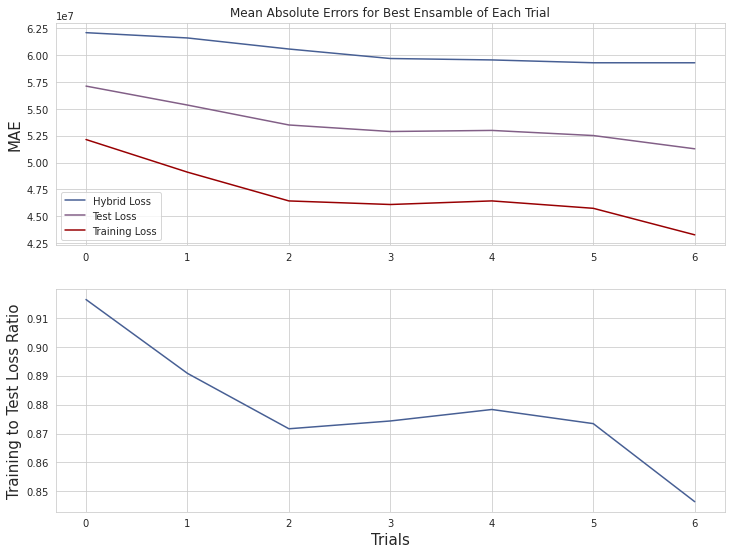

In [103]:
# assemble desired trial runs
_dict = {xgbr_trials_0: 0, 
         xgbr_trials_1: 1, 
         xgbr_trials_2: 2, 
         xgbr_trials_3: 3, 
         xgbr_trials_4: 4, 
         xgbr_trials_5: 5, 
         xgbr_trials_6: 6
        }
# plot the results, so far
plot_metrics(_dict)

The losses ara all going in the right direction, but at the expense of the overfit error.<br>
I assume that the loss gain will bottom out, eventualy.<br>
Hopefully, there will be enough hyperparameters left to tune to decrease model complexity.

I will move on to the stochastic hyperparameters.<br>
They all have default values of 1.

The first sampling method I will adjust is the percent of observations to use at each round.

 > **subsample**

In [104]:
# get best hyperparameters from last trials
best_params = xgbr_trials_6.best_trial['result']['params']

# create parameter search grid
param_grid = {
    'learning_rate': [best_params['learning_rate']],
    'max_depth': [best_params['max_depth']],
    'min_child_weight': [best_params['min_child_weight']],
    'n_estimators': [best_params['n_estimators']], 
    'subsample': np.linspace(0.1, 1, 19)
}

for param, param_lst in param_grid.items():
    print(param, param_lst)

learning_rate [0.08230804137408784]
max_depth [6]
min_child_weight [1]
n_estimators [65]
subsample [0.1  0.15 0.2  0.25 0.3  0.35 0.4  0.45 0.5  0.55 0.6  0.65 0.7  0.75
 0.8  0.85 0.9  0.95 1.  ]


Fitting 10 folds for each of 19 candidates, totalling 190 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 24 concurrent workers.
[Parallel(n_jobs=-1)]: Done 114 tasks      | elapsed:    5.5s
[Parallel(n_jobs=-1)]: Done 190 out of 190 | elapsed:    9.1s finished


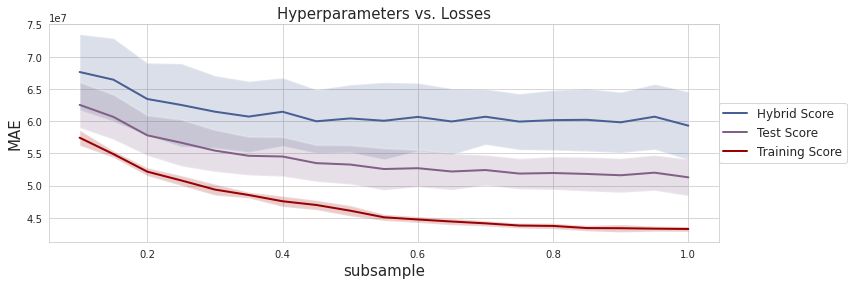

In [105]:
# plot cross validation results for hyperparameter range
plot_hyperparameters(X_train, y_train, param_grid)

Values lower than 0.35 seem to increase the losses.<br>
I will start with 0.3 to be conservative.

 > **xgbr_trials_7**

In [106]:
# instantiate trials object for XGBoost Regressor optimization
xgbr_trials_7 = Trials()
# instantiate iteration marker
global_iterations = 0
# instantiate batch marker
global_batches = 0
# instantiate trial marker
global_trials = 0

In [107]:
# create informed search space  
hp_space = {
    'learning_rate': hp.uniform('learning_rate', 0.05, 0.1),
    'max_depth': ho_scope.int(hp.uniform('max_depth', 1, 8)), 
    'min_child_weight': ho_scope.int(hp.uniform('min_child_weight', 1, 10)), 
    'n_estimators': ho_scope.int(hp.uniform('n_estimators', 50, 150)), 
    'subsample': hp.uniform('subsample', 0.3, 1)
}
# call optimization function
run_trial_batches(X_train, y_train, hp_space, xgbr_trials_7)
# save trials object
pickle.dump(xgbr_trials_7, open('./xgbr_trials/xgbr_trials_7.pkl', 'wb'))

100%|██████████| 200/200 [01:28<00:00,  2.27trial/s, best loss: 59512205.99623152]


The hybrid loss is worse.

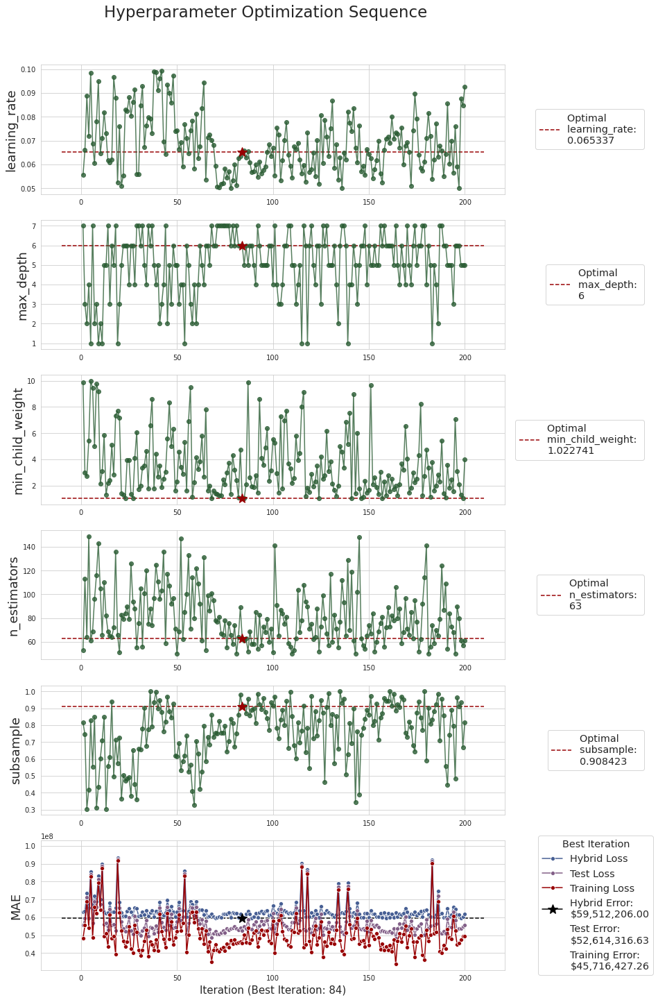

In [108]:
# plot informed search history
plot_param_search(xgbr_trials_7)

The subsampling started low, then settled between 75% and 95%.<br>
This was the range that the grid search suggested.

In [109]:
# get results DataFrame
trials_7_df = make_trials_df(xgbr_trials_7)
trials_7_df.head(10)

,trial,batch,iteration,loss,training_scores,test_scores,scores_ratio,learning_rate,max_depth,min_child_weight,n_estimators,subsample
83,1,1,84,5.951221e+07,4.571643e+07,5.261432e+07,0.871331,0.065337,6,1,63,0.908423
88,1,1,89,5.952949e+07,4.733920e+07,5.343435e+07,0.888212,0.056606,6,1,58,0.888581
197,1,2,198,5.958918e+07,4.767073e+07,5.362995e+07,0.892037,0.087512,5,1,61,0.933232
69,1,1,70,5.966052e+07,4.490805e+07,5.228429e+07,0.861612,0.059316,6,1,78,0.754237
158,1,2,159,5.967866e+07,4.378405e+07,5.173135e+07,0.848346,0.070787,6,1,72,0.941961
81,1,1,82,5.977827e+07,4.579864e+07,5.278846e+07,0.869972,0.062709,6,1,64,0.859574
84,1,1,85,5.987565e+07,5.030379e+07,5.508972e+07,0.916154,0.065892,5,1,61,0.914581
162,1,2,163,5.989153e+07,4.737360e+07,5.363256e+07,0.885995,0.070741,5,1,78,0.984631
146,1,2,147,5.989317e+07,4.723163e+07,5.356240e+07,0.884196,0.059305,6,1,57,0.781125
123,1,2,124,5.991470e+07,4.862924e+07,5.427197e+07,0.898115,0.051695,6,1,52,0.828607


Subsampling has given a better overfit ratio, but the losses have all increased.<br>
I am looking for a hyperparameter that seems bounded.<br>
I notice that the learning rates for the best models are a bit low.

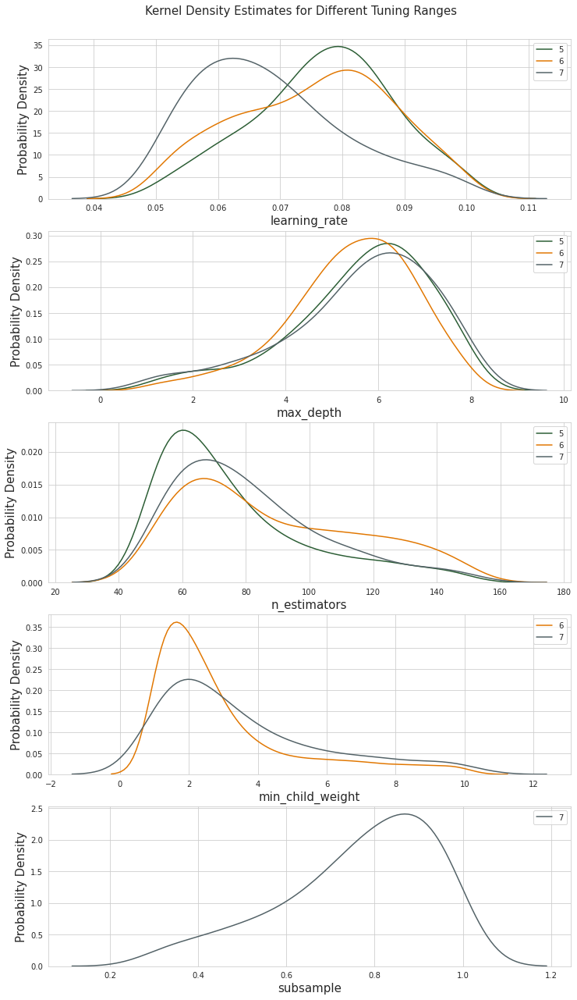

In [110]:
# assemble desired trial runs
_dict = {xgbr_trials_5: 5, 
         xgbr_trials_6: 6, 
         xgbr_trials_7: 7
        }
# plot the results, so far
plot_kde(_dict)

The distribution of the learning rate is starting to lean towards the lower bound.<br>
I will lower the limit to try to reduce model complexity.

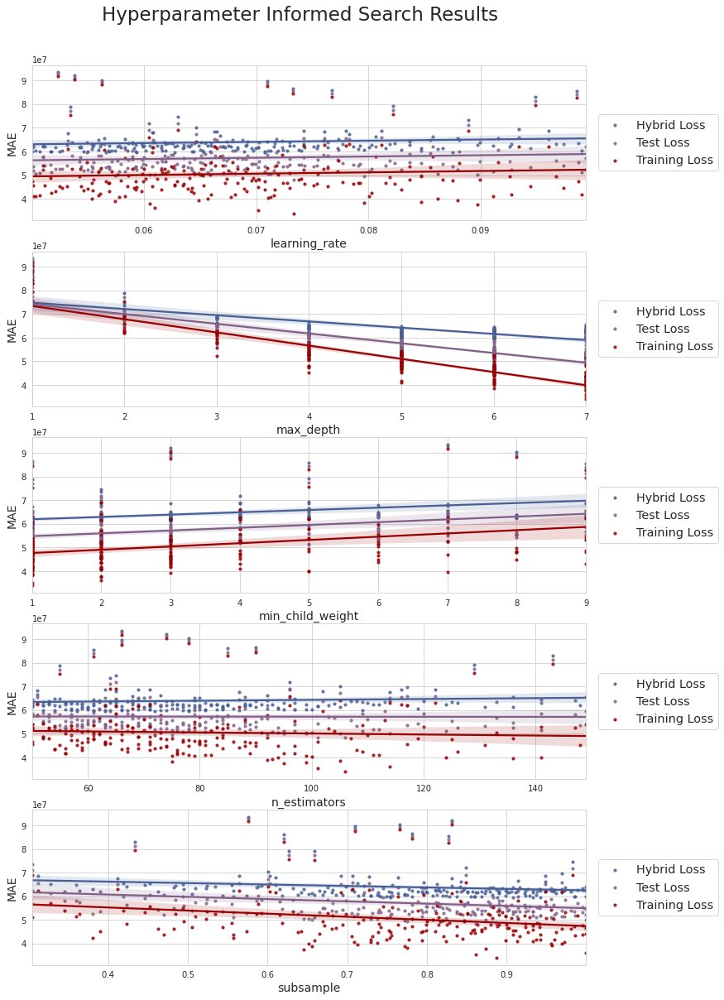

In [111]:
# plot hyperparameters vs. mean absolute errors
plot_maes(xgbr_trials_7)

The losses are tilted upward for higher values of learning rate.<br>
I will lower its bound to 0.01.

 > **xgbr_trials_8**

In [112]:
# instantiate trials object for XGBoost Regressor optimization
xgbr_trials_8 = Trials()
# instantiate iteration marker
global_iterations = 0
# instantiate batch marker
global_batches = 0
# instantiate trial marker
global_trials = 0

In [113]:
# create informed search space  
hp_space = {
    'learning_rate': hp.uniform('learning_rate', 0.01, 0.1),
    'max_depth': ho_scope.int(hp.uniform('max_depth', 1, 8)), 
    'min_child_weight': ho_scope.int(hp.uniform('min_child_weight', 1, 10)), 
    'n_estimators': ho_scope.int(hp.uniform('n_estimators', 50, 150)), 
    'subsample': hp.uniform('subsample', 0.3, 1)
}
# call optimization function
run_trial_batches(X_train, y_train, hp_space, xgbr_trials_8)
# save trials object
pickle.dump(xgbr_trials_8, open('./xgbr_trials/xgbr_trials_8.pkl', 'wb'))

100%|██████████| 400/400 [02:08<00:00,  3.12trial/s, best loss: 59197316.51802502]


Great. I have the lowest hybrid loss, yet.

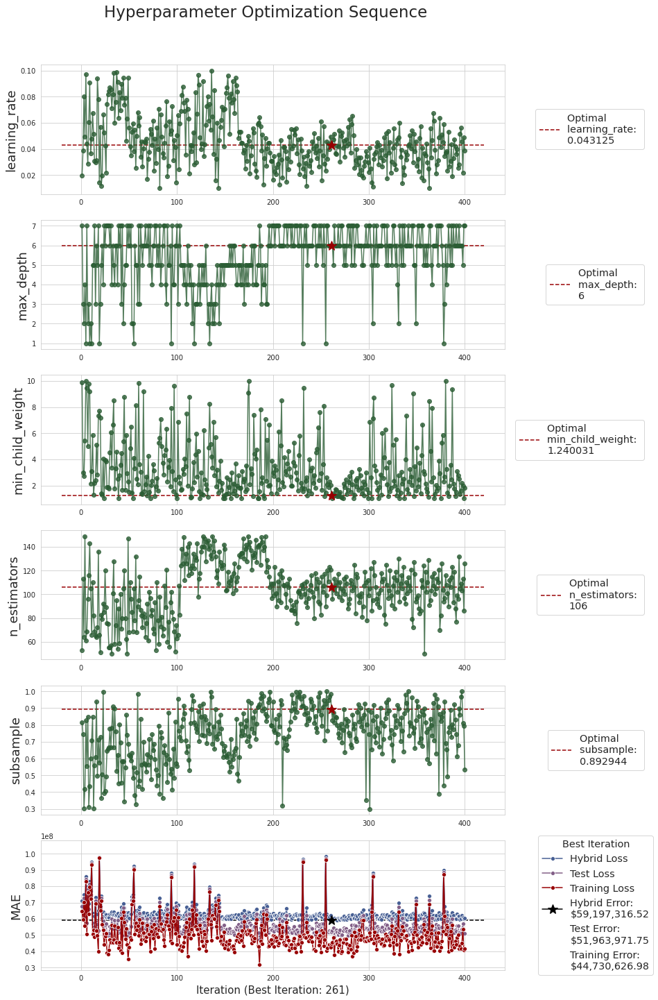

In [114]:
# plot informed search history
plot_param_search(xgbr_trials_8)

The models are using the extra values for the learning rate .

In [115]:
# get results DataFrame
trials_8_df = make_trials_df(xgbr_trials_8)
trials_8_df.head(10)

,trial,batch,iteration,loss,training_scores,test_scores,scores_ratio,learning_rate,max_depth,min_child_weight,n_estimators,subsample
260,1,3,261,5.919732e+07,4.473063e+07,5.196397e+07,0.863297,0.043125,6,1,106,0.892944
266,1,3,267,5.926915e+07,4.482608e+07,5.204762e+07,0.863737,0.042247,6,1,110,0.798969
210,1,3,211,5.938600e+07,4.539963e+07,5.239282e+07,0.868802,0.041245,6,1,108,0.723376
288,1,3,289,5.939413e+07,4.717065e+07,5.328239e+07,0.887454,0.033560,6,1,99,0.921867
197,1,2,198,5.942973e+07,4.712831e+07,5.327902e+07,0.886936,0.030770,6,1,109,0.800008
298,1,3,299,5.944314e+07,4.719068e+07,5.331691e+07,0.887186,0.029560,6,1,112,0.889288
225,1,3,226,5.945584e+07,4.442794e+07,5.194189e+07,0.857997,0.046967,6,1,102,0.969329
264,1,3,265,5.948555e+07,4.592996e+07,5.270776e+07,0.873796,0.036349,6,1,107,0.849936
269,1,3,270,5.948875e+07,4.718344e+07,5.333610e+07,0.886866,0.030122,6,1,110,0.782429
339,1,4,340,5.949668e+07,4.657218e+07,5.303443e+07,0.880416,0.035702,6,1,101,0.887918


The test loss has been sacrificed, slightly, for the improvement in overfitting.

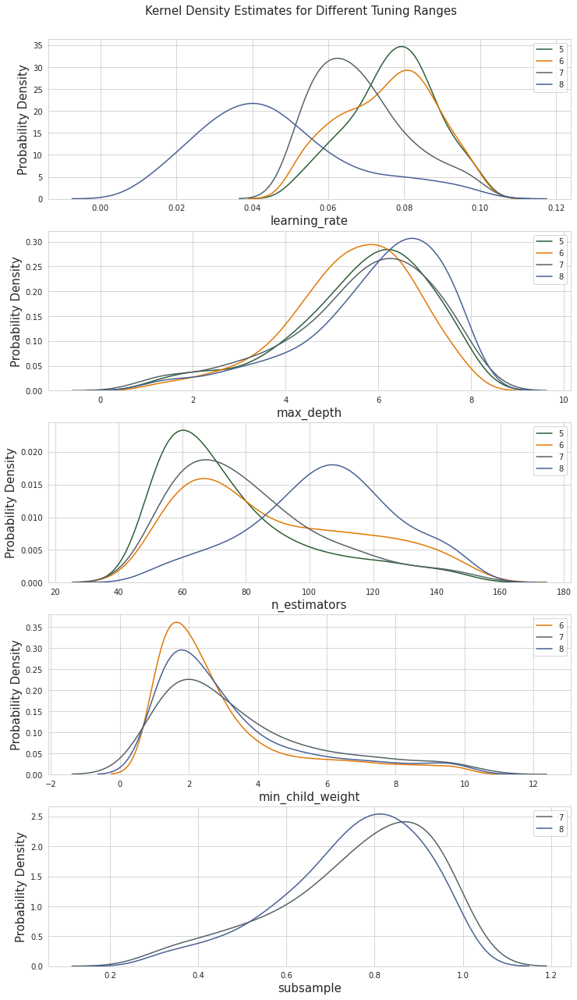

In [116]:
# assemble desired trial runs
_dict = {xgbr_trials_5: 5, 
         xgbr_trials_6: 6, 
         xgbr_trials_7: 7, 
         xgbr_trials_8: 8
        }
# plot the results, so far
plot_kde(_dict)

The new search space for the learning rate values is being used.<br>
This allows more trees to be grown, which the models are exploring.<br>
I will keep an eye on the number of trees, as models may be able to use more with the lower learning rates.

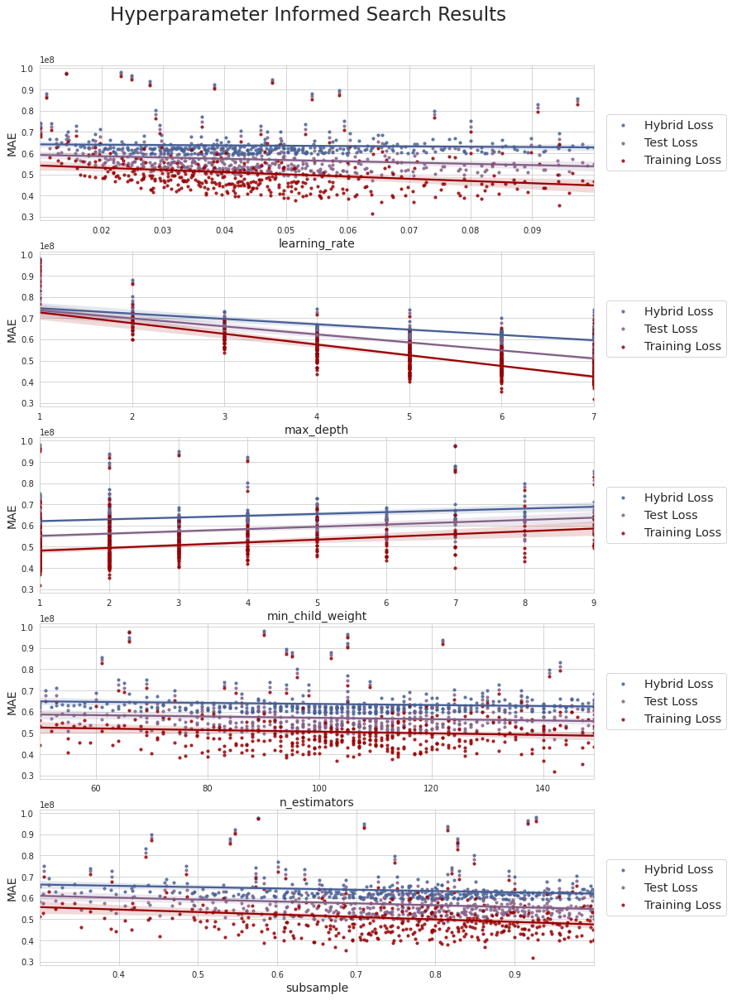

In [117]:
# plot hyperparameters vs. mean absolute errors
plot_maes(xgbr_trials_8)

The losses on the learning rate plot have leveled.

I will move on to sampling by features, as opposed to sampling by observations.<br>
There is really only one way to do these splits, that is, by level (at each depth of the tree).<br>
Splitting by node (at every split) has always produced the same results as splitting by level. So, I don't consider it.<br>
Also, splitting by tree (at the beginning) does not change the search results. So, that one will not be used, either.

 > **colsample_bylevel**

In [118]:
# get best hyperparameters from last trials
best_params = xgbr_trials_8.best_trial['result']['params']

# create parameter search grid
param_grid = {
    'colsample_bylevel': np.linspace(0.1, 1, 19), 
    'learning_rate': [best_params['learning_rate']],
    'max_depth': [best_params['max_depth']],
    'min_child_weight': [best_params['min_child_weight']],
    'n_estimators': [best_params['n_estimators']], 
    'subsample': [best_params['subsample']]
}

for param, param_lst in param_grid.items():
    print(param, param_lst)

colsample_bylevel [0.1  0.15 0.2  0.25 0.3  0.35 0.4  0.45 0.5  0.55 0.6  0.65 0.7  0.75
 0.8  0.85 0.9  0.95 1.  ]
learning_rate [0.04312502518829291]
max_depth [6]
min_child_weight [1]
n_estimators [106]
subsample [0.8929435429851371]


Fitting 10 folds for each of 19 candidates, totalling 190 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 24 concurrent workers.
[Parallel(n_jobs=-1)]: Done 114 tasks      | elapsed:    5.6s
[Parallel(n_jobs=-1)]: Done 190 out of 190 | elapsed:   10.7s finished


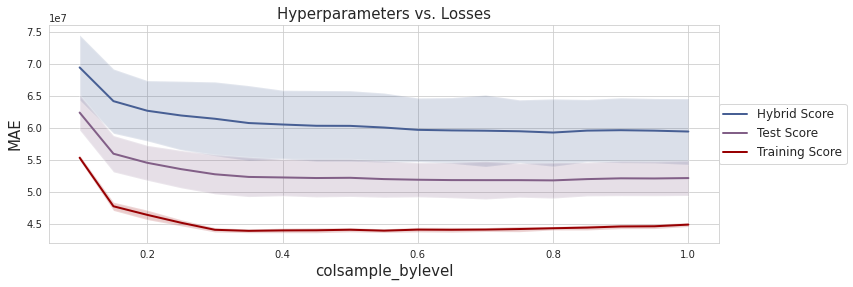

In [119]:
# plot cross validation results for hyperparameter range
plot_hyperparameters(X_train, y_train, param_grid)

It appears that any values above 35% are equally beneficial.<br>
I'll begin with a value of 0.3.

 > **xgbr_trials_9**

In [120]:
# instantiate trials object for XGBoost Regressor optimization
xgbr_trials_9 = Trials()
# instantiate iteration marker
global_iterations = 0
# instantiate batch marker
global_batches = 0
# instantiate trial marker
global_trials = 0

In [121]:
# create informed search space  
hp_space = {
    'colsample_bylevel': hp.uniform('colsample_bylevel', 0.3, 1), 
    'learning_rate': hp.uniform('learning_rate', 0.01, 0.1),
    'max_depth': ho_scope.int(hp.uniform('max_depth', 1, 8)), 
    'min_child_weight': ho_scope.int(hp.uniform('min_child_weight', 1, 10)), 
    'n_estimators': ho_scope.int(hp.uniform('n_estimators', 50, 150)), 
    'subsample': hp.uniform('subsample', 0.3, 1)
}
# call optimization function
run_trial_batches(X_train, y_train, hp_space, xgbr_trials_9)
# save trials object
pickle.dump(xgbr_trials_9, open('./xgbr_trials/xgbr_trials_9.pkl', 'wb'))

100%|██████████| 300/300 [02:15<00:00,  2.21trial/s, best loss: 59228991.73333304]


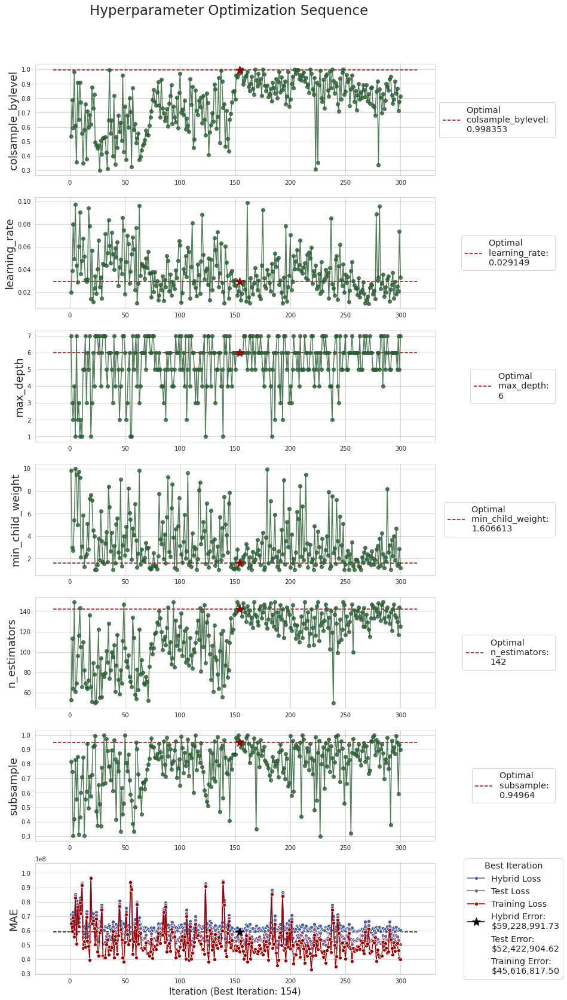

In [122]:
# plot informed search history
plot_param_search(xgbr_trials_9)

The models are not able to fully take advantage of the smaller sample sizes available.

In [123]:
# get results DataFrame
trials_9_df = make_trials_df(xgbr_trials_9)
trials_9_df.head(10)

,trial,batch,iteration,loss,training_scores,test_scores,scores_ratio,colsample_bylevel,learning_rate,max_depth,min_child_weight,n_estimators,subsample
153,1,2,154,5.922899e+07,4.561682e+07,5.242290e+07,0.872358,0.998353,0.029149,6,1,142,0.949640
272,1,3,273,5.929291e+07,4.629819e+07,5.279555e+07,0.878997,0.871902,0.027062,6,1,133,0.957239
258,1,3,259,5.934570e+07,4.706838e+07,5.320704e+07,0.886989,0.853291,0.023392,6,1,136,0.866159
147,1,2,148,5.934616e+07,4.616596e+07,5.275606e+07,0.877340,0.847122,0.029755,6,1,122,0.866712
176,1,2,177,5.938875e+07,4.620331e+07,5.279603e+07,0.877298,0.887810,0.025560,6,1,144,0.824225
265,1,3,266,5.941257e+07,4.642097e+07,5.291677e+07,0.879454,0.892897,0.028680,6,1,125,0.919127
203,1,3,204,5.942002e+07,4.368817e+07,5.155410e+07,0.849837,0.999950,0.040348,6,1,127,0.911424
259,1,3,260,5.942712e+07,4.681862e+07,5.312287e+07,0.883311,0.719751,0.023780,6,1,133,0.901627
286,1,3,287,5.946883e+07,4.807036e+07,5.376960e+07,0.896054,0.901900,0.020144,6,1,141,0.807462
294,1,3,295,5.950057e+07,4.566116e+07,5.258087e+07,0.870714,0.916963,0.029394,6,1,136,0.868877


With the new hyperparameter option, less complex models are able to perform better.<br>
This is resulting in higher loss scores, unfortunately.

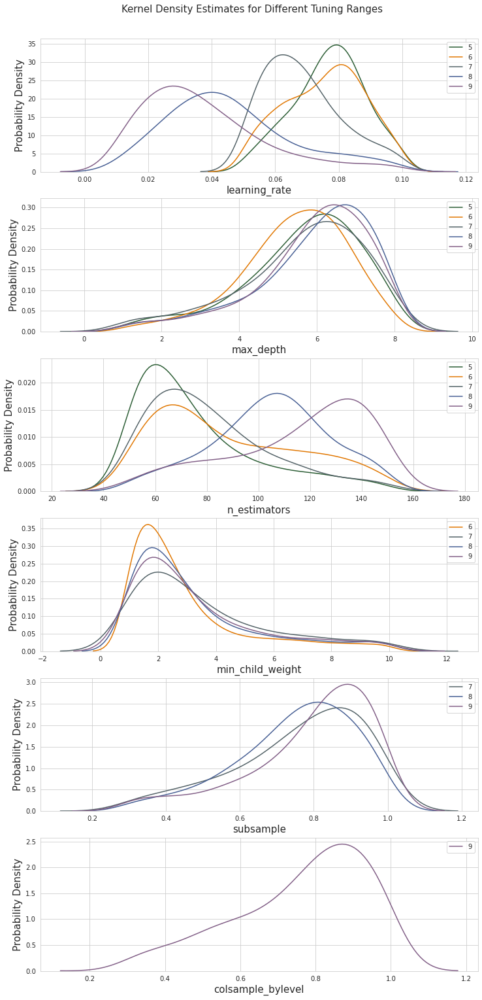

In [124]:
# assemble desired trial runs
_dict = {xgbr_trials_5: 5, 
         xgbr_trials_6: 6, 
         xgbr_trials_7: 7, 
         xgbr_trials_8: 8, 
         xgbr_trials_9: 9
        }
# plot the results, so far
plot_kde(_dict)

With the learning rates so low, the number of trees needs to be expanded to improve the scores.

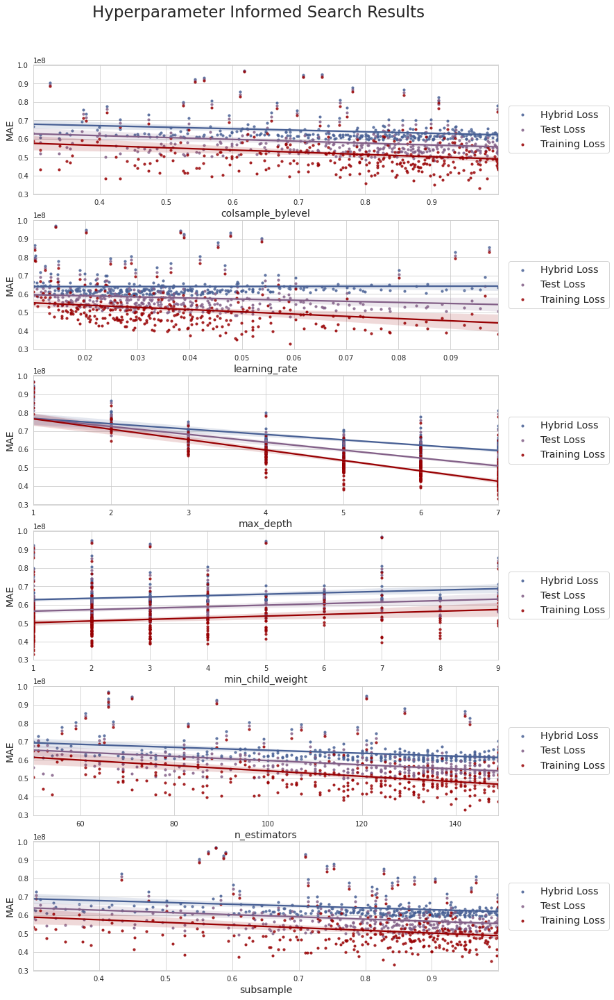

In [125]:
# plot hyperparameters vs. mean absolute errors
plot_maes(xgbr_trials_9)

The loss plots for the number of trees shows that I may find better losses using more than 150 trees.<br>
I will expand the range to 200 trees.

In [126]:
# get best hyperparameters from last trials
best_params = xgbr_trials_9.best_trial['result']['params']

# create parameter search grid
param_grid = {
    'colsample_bylevel': [best_params['colsample_bylevel']],
    'learning_rate': [best_params['learning_rate']],
    'max_depth': [best_params['max_depth']],
    'min_child_weight': [best_params['min_child_weight']],
    'n_estimators': [int(x) for x in np.linspace(50, 200, num=16)], 
    'subsample': [best_params['subsample']]
}

for param, param_lst in param_grid.items():
    print(param, param_lst)

colsample_bylevel [0.9983531773623858]
learning_rate [0.02914897741109303]
max_depth [6]
min_child_weight [1]
n_estimators [50, 60, 70, 80, 90, 100, 110, 120, 130, 140, 150, 160, 170, 180, 190, 200]
subsample [0.9496399484969701]


Fitting 10 folds for each of 16 candidates, totalling 160 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 24 concurrent workers.
[Parallel(n_jobs=-1)]: Done 160 out of 160 | elapsed:   15.4s finished


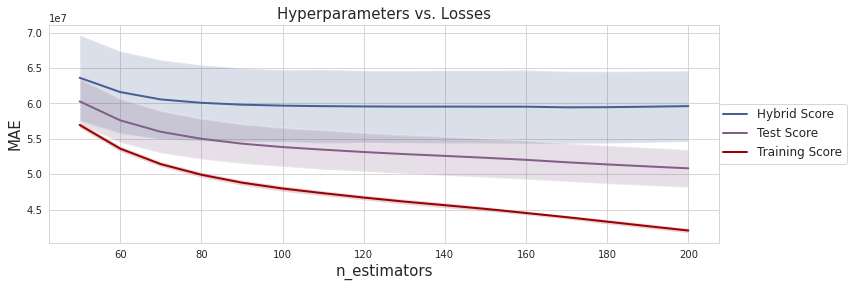

In [127]:
# plot cross validation results for hyperparameter range
plot_hyperparameters(X_train, y_train, param_grid)

The hybrid loss dips a little lower for trees beyond 200.<br>
I will find out if this result can be observed in the informed search.

 > **xgbr_trials_10**

In [128]:
# instantiate trials object for XGBoost Regressor optimization
xgbr_trials_10 = Trials()
# instantiate iteration marker
global_iterations = 0
# instantiate batch marker
global_batches = 0
# instantiate trial marker
global_trials = 0

In [129]:
# create informed search space  
hp_space = {
    'colsample_bylevel': hp.uniform('colsample_bylevel', 0.3, 1), 
    'learning_rate': hp.uniform('learning_rate', 0.01, 0.1),
    'max_depth': ho_scope.int(hp.uniform('max_depth', 1, 8)), 
    'min_child_weight': ho_scope.int(hp.uniform('min_child_weight', 1, 10)), 
    'n_estimators': ho_scope.int(hp.uniform('n_estimators', 50, 200)), 
    'subsample': hp.uniform('subsample', 0.3, 1)
}
# call optimization function
run_trial_batches(X_train, y_train, hp_space, xgbr_trials_10)
# save trials object
pickle.dump(xgbr_trials_10, open('./xgbr_trials/xgbr_trials_10.pkl', 'wb'))

100%|██████████| 400/400 [01:56<00:00,  3.44trial/s, best loss: 59133894.550468296]


I have found a new best model.

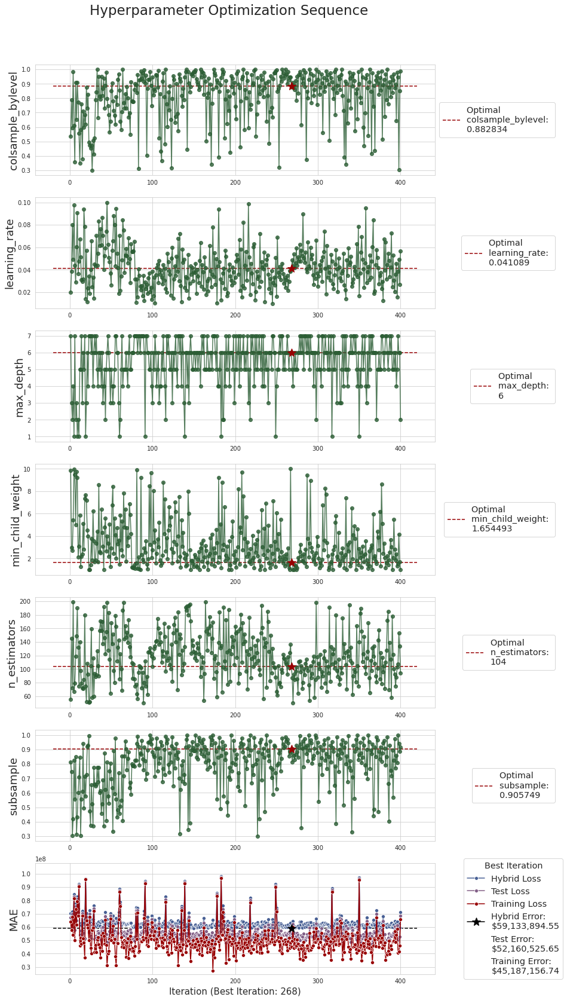

In [130]:
# plot informed search history
plot_param_search(xgbr_trials_10)

Both of the methods of subsampling are being used.

In [131]:
# get results DataFrame
trials_10_df = make_trials_df(xgbr_trials_10)
trials_10_df.head(10)

,trial,batch,iteration,loss,training_scores,test_scores,scores_ratio,colsample_bylevel,learning_rate,max_depth,min_child_weight,n_estimators,subsample
267,1,3,268,5.913389e+07,4.518716e+07,5.216053e+07,0.868570,0.882834,0.041089,6,1,104,0.905749
149,1,2,150,5.915276e+07,4.443901e+07,5.179589e+07,0.860549,0.984850,0.037768,6,1,126,0.893070
246,1,3,247,5.929970e+07,4.682342e+07,5.306156e+07,0.884546,0.976247,0.033157,6,1,103,0.927039
139,1,2,140,5.933393e+07,4.107097e+07,5.020245e+07,0.820118,0.981902,0.033540,6,1,191,0.915597
276,1,3,277,5.934200e+07,4.341969e+07,5.138084e+07,0.847625,0.961343,0.047394,6,1,111,0.912581
325,1,4,326,5.935644e+07,4.717868e+07,5.326756e+07,0.888178,0.934274,0.042213,6,1,77,0.901159
265,1,3,266,5.936820e+07,4.426739e+07,5.181780e+07,0.856779,0.948072,0.038905,6,1,124,0.886275
146,1,2,147,5.937137e+07,4.503319e+07,5.220228e+07,0.865299,0.968398,0.036052,6,1,123,0.896155
94,1,1,95,5.937356e+07,4.552196e+07,5.244776e+07,0.870301,0.931562,0.032939,6,1,125,0.948263
103,1,2,104,5.943843e+07,4.407673e+07,5.175758e+07,0.853880,0.964758,0.035119,6,1,141,0.909496


None of the top models are using the additional trees.<br>
I will assume that the optimization function is using information from their priors, because it found the 2 best models, so far.

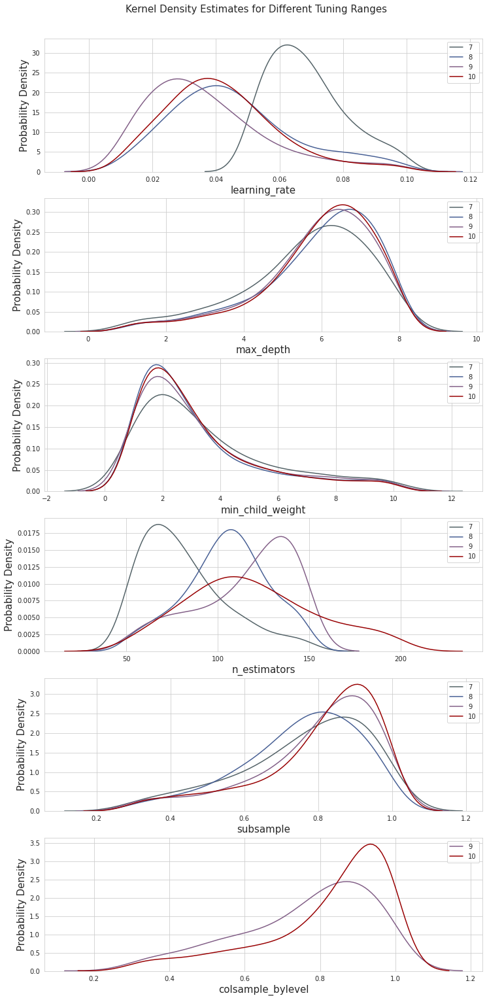

In [132]:
# assemble desired trial runs
_dict = {xgbr_trials_7: 7, 
         xgbr_trials_8: 8, 
         xgbr_trials_9: 9, 
         xgbr_trials_10: 10
        }
# plot the results, so far
plot_kde(_dict)

The distribution for the number of trees is symmetric about the middle value of 125 trees.

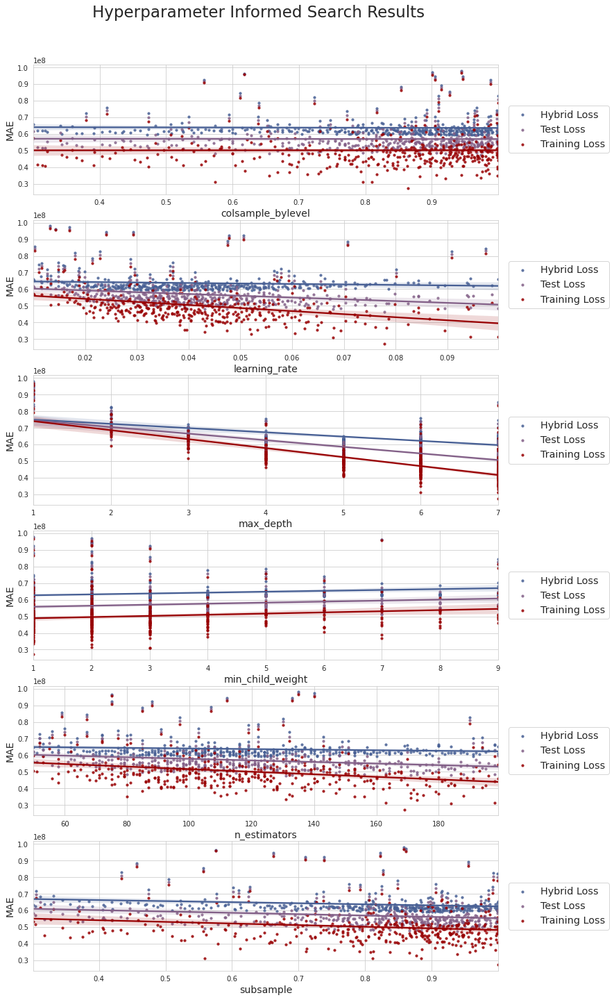

In [133]:
# plot hyperparameters vs. mean absolute errors
plot_maes(xgbr_trials_10)

These losses look good. <br>
I'll try to improve the search by using regularization to further reduce model complexity.

Again, there is really only one choice, lambda, the L2 (Ridge) regularization term.<br>
Neither the L1 (LASSO) term, nor the gamma (Lagrangian multiplier) term, affected the search results.

 > **reg_lambda**

Ridge regularization penalizes the larger errors to prevent overfitting.<br>
Recall, the default value is 0, which means no regularization.

In [134]:
# get best hyperparameters from last trials
best_params = xgbr_trials_10.best_trial['result']['params']

# create parameter search grid
param_grid = {
    'colsample_bylevel': [best_params['colsample_bylevel']], 
    'learning_rate': [best_params['learning_rate']],
    'reg_lambda': np.linspace(0, 5.0, 21),
    'max_depth': [best_params['max_depth']],
    'min_child_weight': [best_params['min_child_weight']],
    'n_estimators': [best_params['n_estimators']], 
    'subsample': [best_params['subsample']]
}

for param, param_lst in param_grid.items():
    print(param, param_lst)

colsample_bylevel [0.8828336253945411]
learning_rate [0.04108910464963291]
reg_lambda [0.   0.25 0.5  0.75 1.   1.25 1.5  1.75 2.   2.25 2.5  2.75 3.   3.25
 3.5  3.75 4.   4.25 4.5  4.75 5.  ]
max_depth [6]
min_child_weight [1]
n_estimators [104]
subsample [0.9057492519592367]


Fitting 10 folds for each of 21 candidates, totalling 210 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 24 concurrent workers.
[Parallel(n_jobs=-1)]: Done 114 tasks      | elapsed:    8.6s
[Parallel(n_jobs=-1)]: Done 210 out of 210 | elapsed:   15.2s finished


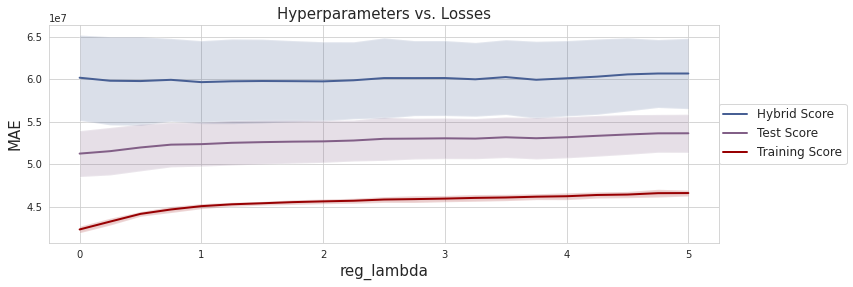

In [135]:
# plot cross validation results for hyperparameter range
plot_hyperparameters(X_train, y_train, param_grid)

The best range is below a lambda value of 4.<br>
I will go with a range from 0 to 5.

 > **xgbr_trials_11**

In [136]:
# instantiate trials object for XGBoost Regressor optimization
xgbr_trials_11 = Trials()
# instantiate iteration marker
global_iterations = 0
# instantiate batch marker
global_batches = 0
# instantiate trial marker
global_trials = 0

In [137]:
# create informed search space  
hp_space = {
    'colsample_bylevel': hp.uniform('colsample_bylevel', 0.3, 1), 
    'learning_rate': hp.uniform('learning_rate', 0.01, 0.1),
    'max_depth': ho_scope.int(hp.uniform('max_depth', 1, 8)), 
    'min_child_weight': ho_scope.int(hp.uniform('min_child_weight', 1, 10)), 
    'n_estimators': ho_scope.int(hp.uniform('n_estimators', 50, 200)), 
    'reg_lambda': hp.uniform('reg_lambda', 0, 5.0),
    'subsample': hp.uniform('subsample', 0.3, 1)
}
# call optimization function
run_trial_batches(X_train, y_train, hp_space, xgbr_trials_11)
# save trials object
pickle.dump(xgbr_trials_11, open('./xgbr_trials/xgbr_trials_11.pkl', 'wb'))

100%|██████████| 300/300 [02:41<00:00,  1.86trial/s, best loss: 59086910.32588309]


Adding the lambda hyperparameter has helped to find a better model.

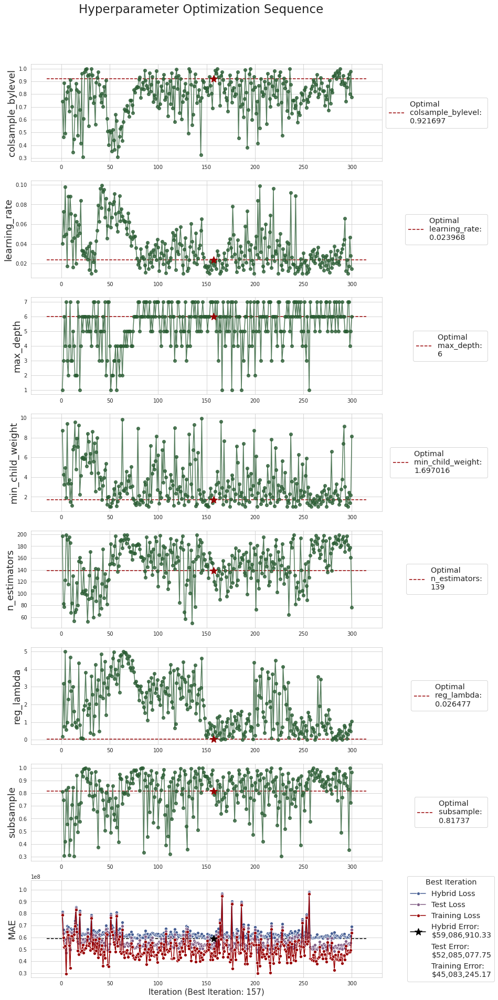

In [138]:
# plot informed search history
plot_param_search(xgbr_trials_11)

The search prefers smaller values of lambda.

In [139]:
# get results DataFrame
trials_11_df = make_trials_df(xgbr_trials_11)
trials_11_df.head(10)

,trial,batch,iteration,loss,training_scores,test_scores,scores_ratio,colsample_bylevel,learning_rate,max_depth,min_child_weight,n_estimators,reg_lambda,subsample
156,1,2,157,5.908691e+07,4.508325e+07,5.208508e+07,0.868133,0.921697,0.023968,6,1,139,0.026477,0.817370
238,1,3,239,5.934753e+07,4.473528e+07,5.204141e+07,0.861962,0.753500,0.019691,6,1,193,0.341539,0.913293
269,1,3,270,5.938457e+07,4.245478e+07,5.091968e+07,0.836234,0.826154,0.028294,6,1,189,0.750807,0.910836
280,1,3,281,5.941161e+07,4.400785e+07,5.170973e+07,0.853412,0.939431,0.020198,6,1,185,0.098128,0.957573
148,1,2,149,5.942139e+07,4.795362e+07,5.368751e+07,0.895729,0.846834,0.017800,6,1,147,0.267675,0.934115
147,1,2,148,5.949721e+07,4.843965e+07,5.396843e+07,0.899575,0.851160,0.017064,6,1,157,1.237721,0.937073
76,1,1,77,5.955820e+07,4.369685e+07,5.162753e+07,0.848598,0.845424,0.035895,6,1,181,3.311633,0.983366
77,1,1,78,5.956201e+07,4.556626e+07,5.256414e+07,0.868630,0.856834,0.025541,6,1,182,3.056975,0.945441
174,1,2,175,5.962557e+07,4.123174e+07,5.042865e+07,0.819468,0.895531,0.035960,7,1,111,1.651649,0.914568
234,1,3,235,5.962851e+07,4.375147e+07,5.168999e+07,0.849503,0.618069,0.040251,7,1,64,0.139397,0.886737


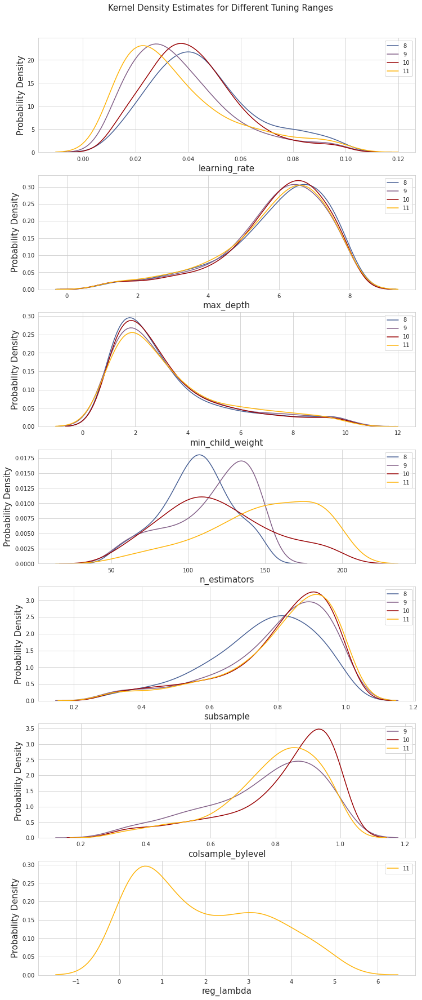

In [140]:
# assemble desired trial runs
_dict = {xgbr_trials_8: 8, 
         xgbr_trials_9: 9, 
         xgbr_trials_10: 10, 
         xgbr_trials_11: 11
        }
# plot the results, so far
plot_kde(_dict)

It looks as though the number of trees needs to be increased.<br>
The learning rate distribution looks like it could be lowered, as well.

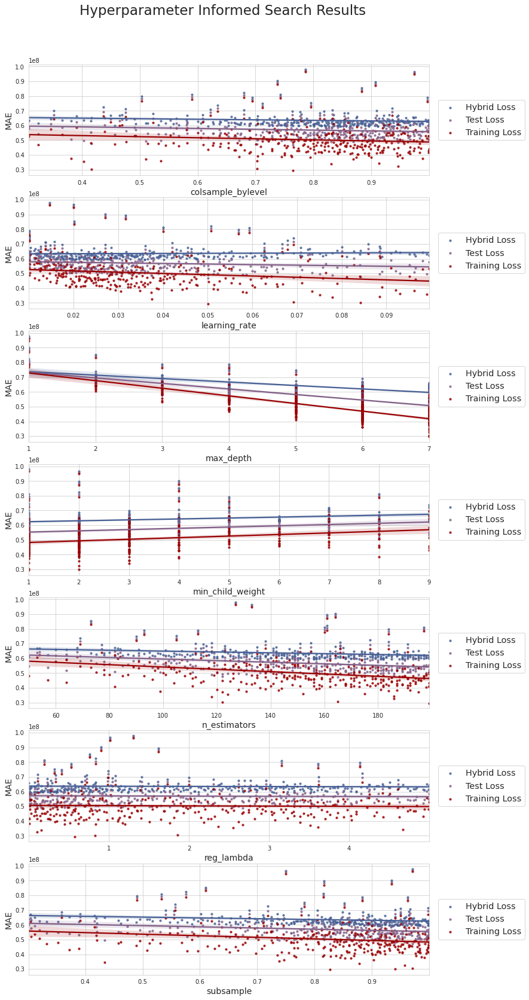

In [141]:
# plot hyperparameters vs. mean absolute errors
plot_maes(xgbr_trials_11)

I'll observe what happen with more trees.

In [142]:
# get best hyperparameters from last trials
best_params = xgbr_trials_11.best_trial['result']['params']

# create parameter search grid
param_grid = {
    'colsample_bylevel': [best_params['colsample_bylevel']], 
    'learning_rate': [best_params['learning_rate']],
    'max_depth': [best_params['max_depth']],
    'min_child_weight': [best_params['min_child_weight']],
    'n_estimators': [int(x) for x in np.linspace(50, 350, num=16)], 
    'reg_lambda': [best_params['reg_lambda']], 
    'subsample': [best_params['subsample']]
}

for param, param_lst in param_grid.items():
    print(param, param_lst)

colsample_bylevel [0.9216971714124369]
learning_rate [0.023968283890929178]
max_depth [6]
min_child_weight [1]
n_estimators [50, 70, 90, 110, 130, 150, 170, 190, 210, 230, 250, 270, 290, 310, 330, 350]
reg_lambda [0.026477203443319164]
subsample [0.8173695741937621]


Fitting 10 folds for each of 16 candidates, totalling 160 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 24 concurrent workers.
[Parallel(n_jobs=-1)]: Done 160 out of 160 | elapsed:   24.5s finished


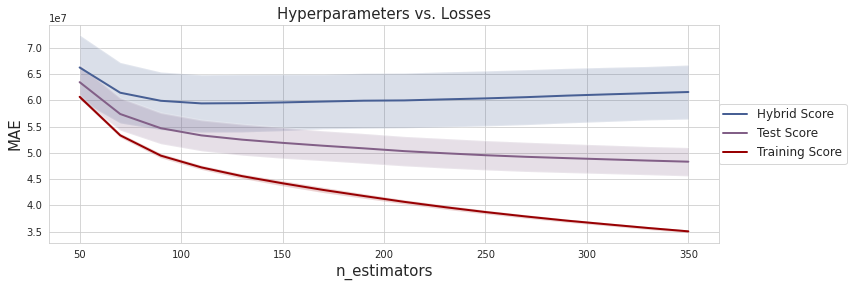

In [143]:
# plot cross validation results for hyperparameter range
plot_hyperparameters(X_train, y_train, param_grid)

It looks like there may be room to add 50 more trees.<br>
I'll check to see if the learning rate needs to be lowered to handle those additional trees.

In [144]:
# get best hyperparameters from last trials
best_params = xgbr_trials_11.best_trial['result']['params']

# create parameter search grid
param_grid = {
    'colsample_bylevel': [best_params['colsample_bylevel']], 
    'learning_rate': np.linspace(0.008, 0.02, 13),
    'max_depth': [best_params['max_depth']],
    'min_child_weight': [best_params['min_child_weight']],
    'n_estimators': [250], 
    'reg_lambda': [best_params['reg_lambda']], 
    'subsample': [best_params['subsample']]
}

for param, param_lst in param_grid.items():
    print(param, param_lst)

colsample_bylevel [0.9216971714124369]
learning_rate [0.008 0.009 0.01  0.011 0.012 0.013 0.014 0.015 0.016 0.017 0.018 0.019
 0.02 ]
max_depth [6]
min_child_weight [1]
n_estimators [250]
reg_lambda [0.026477203443319164]
subsample [0.8173695741937621]


Fitting 10 folds for each of 13 candidates, totalling 130 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 24 concurrent workers.
[Parallel(n_jobs=-1)]: Done 130 out of 130 | elapsed:   23.9s finished


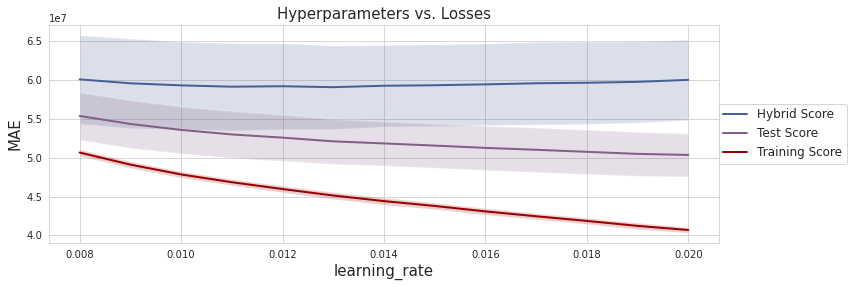

In [145]:
# plot cross validation results for hyperparameter range
plot_hyperparameters(X_train, y_train, param_grid)

In addition to raising the upper limit on the number to trees to 250, I will shift the learning rate to a much lower range.<br>
It will be between 0.008 and 0.02.

 > **xgbr_trials_12**

In [146]:
# instantiate trials object for XGBoost Regressor optimization
xgbr_trials_12 = Trials()
# instantiate iteration marker
global_iterations = 0
# instantiate batch marker
global_batches = 0
# instantiate trial marker
global_trials = 0

In [147]:
# create informed search space  
hp_space = {
    'colsample_bylevel': hp.uniform('colsample_bylevel', 0.3, 1), 
    'learning_rate': hp.uniform('learning_rate', 0.008, 0.02),
    'max_depth': ho_scope.int(hp.uniform('max_depth', 1, 8)), 
    'min_child_weight': ho_scope.int(hp.uniform('min_child_weight', 1, 10)), 
    'n_estimators': ho_scope.int(hp.uniform('n_estimators', 50, 250)), 
    'reg_lambda': hp.uniform('reg_lambda', 0, 5.0),
    'subsample': hp.uniform('subsample', 0.3, 1)
}
# call optimization function
run_trial_batches(X_train, y_train, hp_space, xgbr_trials_12)
# save trials object
pickle.dump(xgbr_trials_12, open('./xgbr_trials/xgbr_trials_12.pkl', 'wb'))

100%|██████████| 800/800 [03:46<00:00,  3.53trial/s, best loss: 59074577.101769075]


After many trials, I've found another new best model.

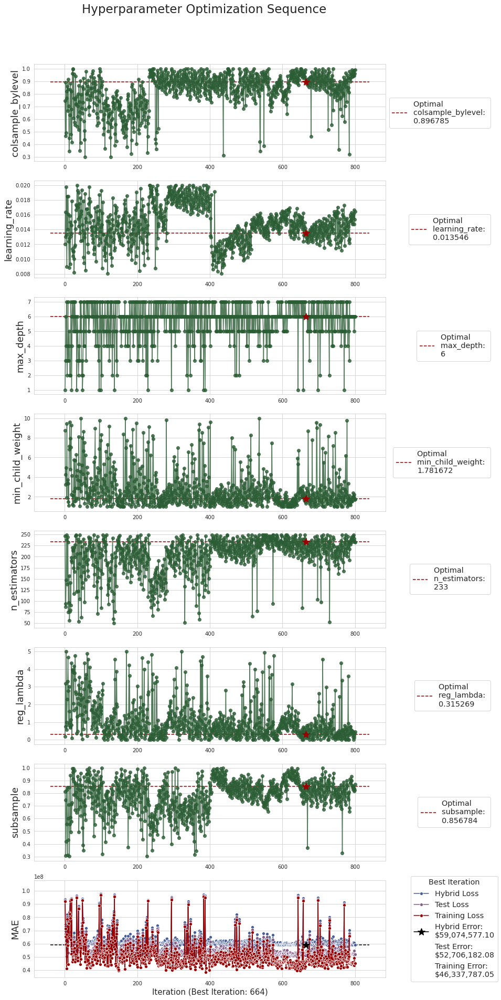

In [148]:
# plot informed search history
plot_param_search(xgbr_trials_12)

The new range of hyperparameters are being put to good use.

In [149]:
# get results DataFrame
trials_12_df = make_trials_df(xgbr_trials_12)
trials_12_df.head(10)

,trial,batch,iteration,loss,training_scores,test_scores,scores_ratio,colsample_bylevel,learning_rate,max_depth,min_child_weight,n_estimators,reg_lambda,subsample
663,1,7,664,5.907458e+07,4.633779e+07,5.270618e+07,0.881588,0.896785,0.013546,6,1,233,0.315269,0.856784
587,1,6,588,5.908573e+07,4.609907e+07,5.259240e+07,0.879036,0.859730,0.014603,6,1,231,0.487569,0.788197
593,1,6,594,5.911164e+07,4.601426e+07,5.256295e+07,0.877674,0.942667,0.015106,6,1,236,0.659532,0.829801
792,1,8,793,5.915615e+07,4.600580e+07,5.258097e+07,0.877410,0.937277,0.014700,6,1,234,0.472172,0.848489
788,1,8,789,5.917135e+07,4.559251e+07,5.238193e+07,0.872852,0.953549,0.015203,6,1,239,0.463057,0.903440
445,1,5,446,5.917529e+07,4.778253e+07,5.347891e+07,0.896069,0.960053,0.012012,6,1,213,0.090530,0.823630
798,1,8,799,5.917836e+07,4.544892e+07,5.231364e+07,0.871124,0.963019,0.015370,6,1,233,0.365158,0.825339
741,1,8,742,5.920745e+07,4.480164e+07,5.200454e+07,0.863942,0.872629,0.016018,6,1,223,0.165042,0.843069
545,1,6,546,5.921568e+07,4.611275e+07,5.266421e+07,0.878145,0.900451,0.013894,6,1,236,0.316974,0.729173
467,1,5,468,5.922112e+07,4.784511e+07,5.353312e+07,0.896174,0.825947,0.013838,6,1,198,0.528847,0.886268


The best models are using more than 200 trees each.

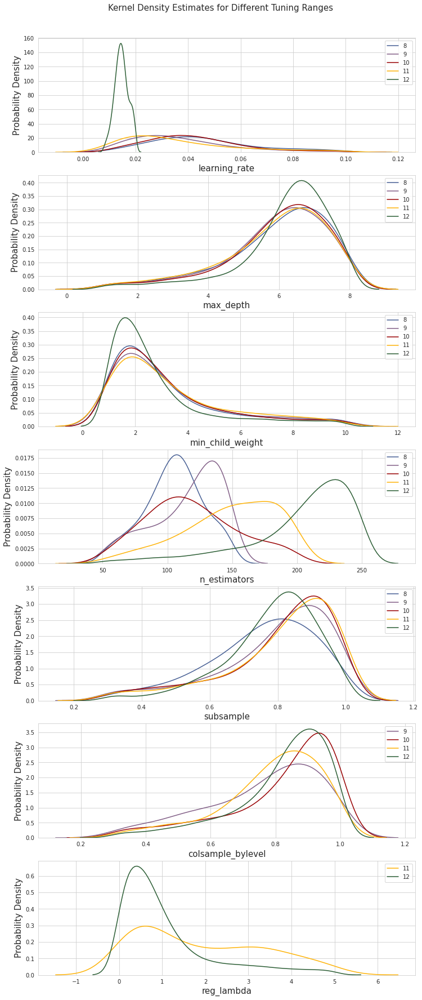

In [150]:
# assemble desired trial runs
_dict = {xgbr_trials_8: 8, 
         xgbr_trials_9: 9, 
         xgbr_trials_10: 10, 
         xgbr_trials_11: 11, 
         xgbr_trials_12: 12
        }
# plot the results, so far
plot_kde(_dict)

The models may need even more trees.

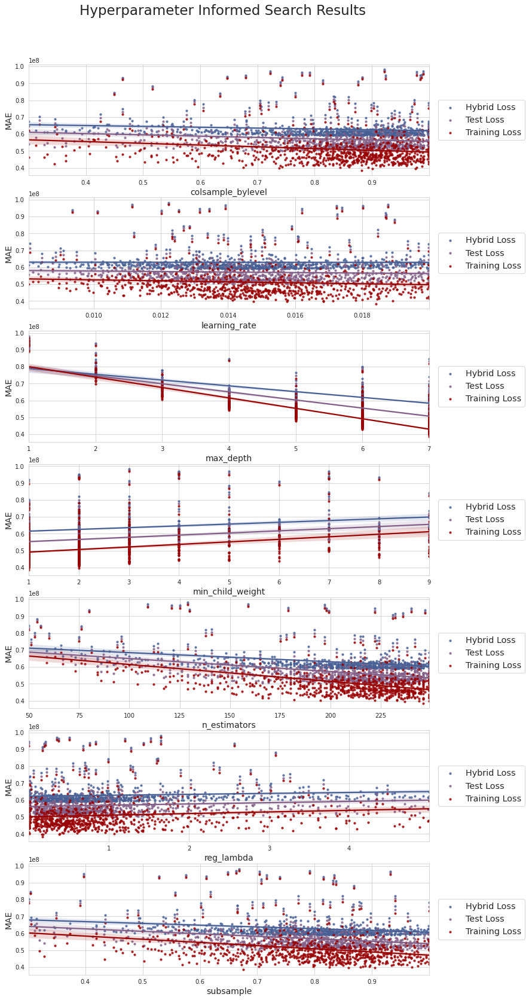

In [151]:
# plot hyperparameters vs. mean absolute errors
plot_maes(xgbr_trials_12)

I will observe the result of adding another 100 trees.

 > **xgbr_trials_13**

In [152]:
# instantiate trials object for XGBoost Regressor optimization
xgbr_trials_13 = Trials()
# instantiate iteration marker
global_iterations = 0
# instantiate batch marker
global_batches = 0
# instantiate trial marker
global_trials = 0

In [153]:
# create informed search space  
hp_space = {
    'colsample_bylevel': hp.uniform('colsample_bylevel', 0.3, 1), 
    'learning_rate': hp.uniform('learning_rate', 0.008, 0.02),
    'max_depth': ho_scope.int(hp.uniform('max_depth', 1, 8)), 
    'min_child_weight': ho_scope.int(hp.uniform('min_child_weight', 1, 10)), 
    'n_estimators': ho_scope.int(hp.uniform('n_estimators', 50, 350)), 
    'reg_lambda': hp.uniform('reg_lambda', 0, 5.0),
    'subsample': hp.uniform('subsample', 0.3, 1)
}
# call optimization function
run_trial_batches(X_train, y_train, hp_space, xgbr_trials_13)
# save trials object
pickle.dump(xgbr_trials_13, open('./xgbr_trials/xgbr_trials_13.pkl', 'wb'))

100%|██████████| 400/400 [04:27<00:00,  1.50trial/s, best loss: 59094760.263271466]


The best hybrid loss has not improved by adding even more trees.

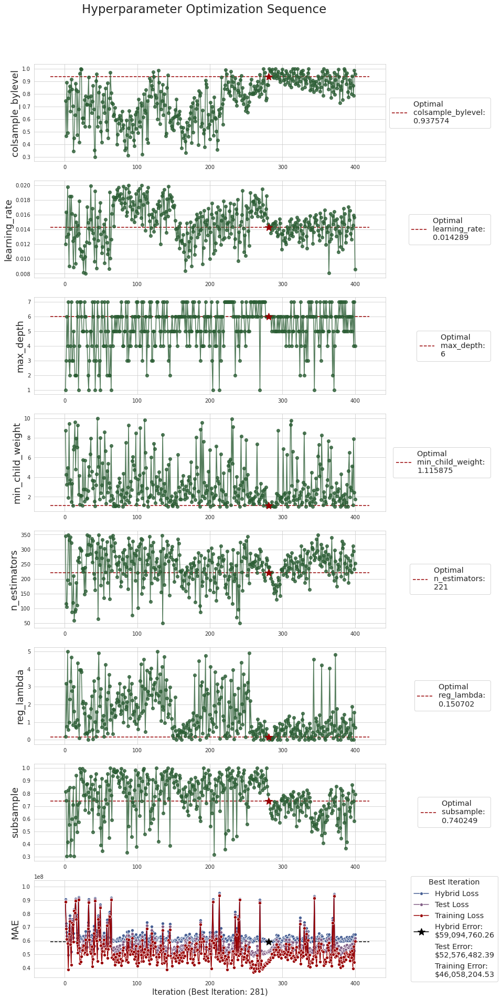

In [154]:
# plot informed search history
plot_param_search(xgbr_trials_13)

Some of the trees were used, but not many.

In [155]:
# get results DataFrame
trials_13_df = make_trials_df(xgbr_trials_13)
trials_13_df.head(10)

,trial,batch,iteration,loss,training_scores,test_scores,scores_ratio,colsample_bylevel,learning_rate,max_depth,min_child_weight,n_estimators,reg_lambda,subsample
280,1,3,281,5.909476e+07,4.605820e+07,5.257648e+07,0.878561,0.937574,0.014289,6,1,221,0.150702,0.740249
279,1,3,280,5.918706e+07,4.486321e+07,5.202514e+07,0.864777,0.870617,0.014697,6,1,240,0.143622,0.795242
278,1,3,279,5.927682e+07,4.328347e+07,5.128014e+07,0.846663,0.872263,0.015549,6,1,263,0.140250,0.857123
281,1,3,282,5.929351e+07,4.457795e+07,5.193573e+07,0.860774,0.999308,0.014452,6,1,241,0.000986,0.737858
338,1,4,339,5.930492e+07,4.506321e+07,5.218406e+07,0.865949,0.898755,0.013904,6,1,272,0.084331,0.608942
297,1,3,298,5.932757e+07,4.709732e+07,5.321244e+07,0.887558,0.959906,0.013455,6,1,232,0.587463,0.746370
286,1,3,287,5.935593e+07,4.765025e+07,5.350309e+07,0.893249,0.936765,0.014756,6,1,182,0.135487,0.685511
282,1,3,283,5.935630e+07,4.602248e+07,5.268939e+07,0.875999,0.983849,0.014381,6,1,221,0.103392,0.679759
258,1,3,259,5.940183e+07,4.266771e+07,5.103477e+07,0.838371,0.805750,0.017753,6,1,257,0.291218,0.908211
257,1,3,258,5.942365e+07,4.490730e+07,5.216547e+07,0.863264,0.798932,0.015744,6,1,241,0.468806,0.919257


Judging by their hybrid losses, the best 2 models of these trials are the only contenders.<br>
Neither of them used more then 250 trees.

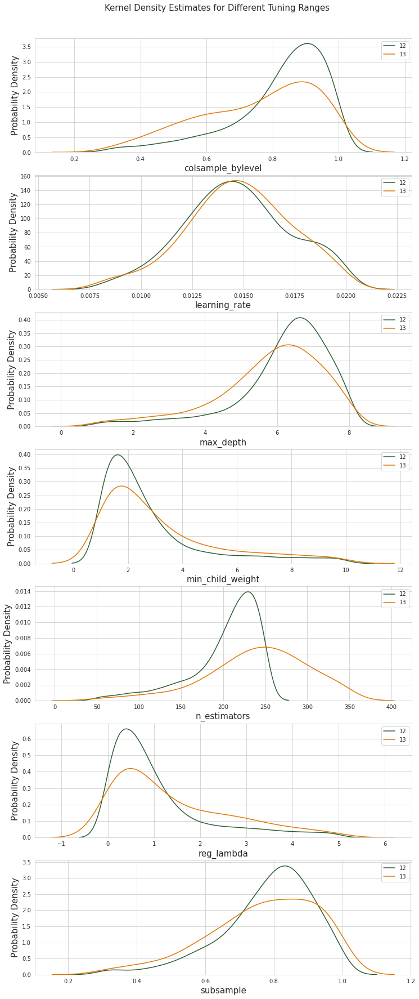

In [156]:
# assemble desired trial runs
_dict = {xgbr_trials_12: 12, 
         xgbr_trials_13: 13
        }
# plot the results, so far
plot_kde(_dict)

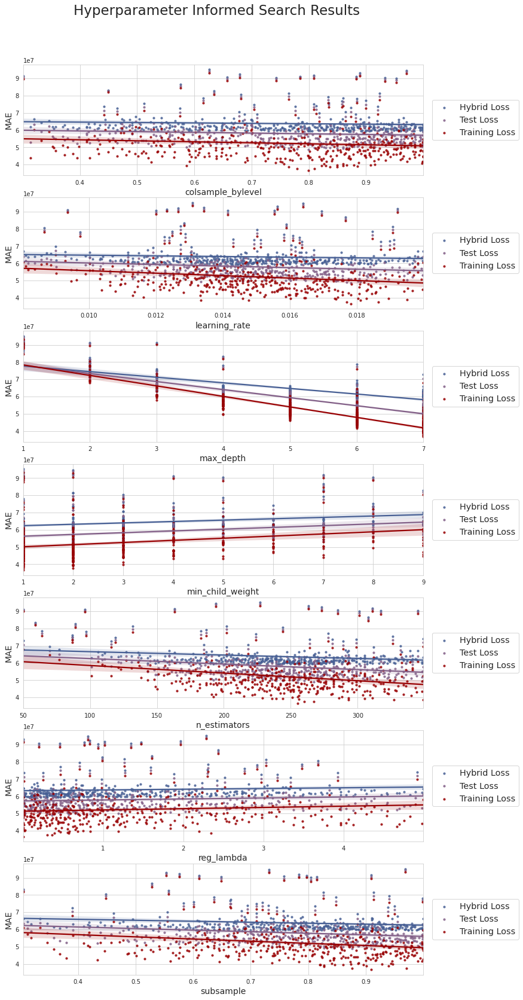

In [157]:
# plot hyperparameters vs. mean absolute errors
plot_maes(xgbr_trials_13)

Adding more trees did not help.<br>
The upward slope of the hybrid loss line is most likely not an indication of needing more trees.<br>
I suspect the large errors associated with low numbers of trees are real cause of the fit line's slope in that direction.

I'll pause to observe the journey, so far.

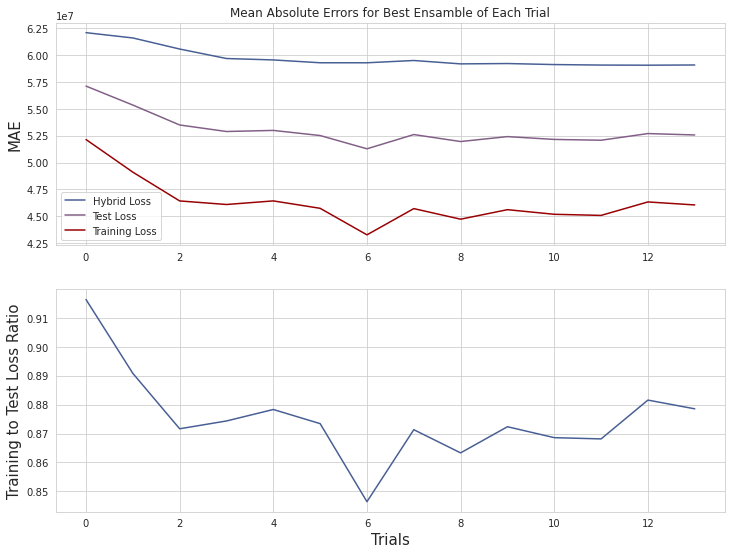

In [158]:
# assemble desired trial runs
_dict = {xgbr_trials_0: 0, 
         xgbr_trials_1: 1, 
         xgbr_trials_2: 2, 
         xgbr_trials_3: 3, 
         xgbr_trials_4: 4, 
         xgbr_trials_5: 5, 
         xgbr_trials_6: 6, 
         xgbr_trials_7: 7, 
         xgbr_trials_8: 8, 
         xgbr_trials_9: 9, 
         xgbr_trials_10: 10, 
         xgbr_trials_11: 11, 
         xgbr_trials_12: 12, 
         xgbr_trials_13: 13
        }
# plot the results, so far
plot_metrics(_dict)

The hybrid error is decreasing slowly.<br>
The real gain has been in restraining the overfitting, as the models have gotten more accurate.<br>
This will pay off with a more robust model.

 > **DART**

The gains from regularization were good to get the losses lower, but I'm still not content with the degree of overfitting I see.<br>
I'll attempt to borrow an idea that is commonly used in deep learning to address model complexity, namely dropout.<br>
With Gradient Boosting Machines (GBM), the first few trees in the ensemble tend to dictate the model performance.<br>
Trees added later will generally decrease losses, but over a smaller subset of the features.<br>
This leads to the overfitting that is typically encountered when using GBM ensembles.<br>
The Dropout Additive Regression Trees (DART) approach randomly drops trees from the boosting sequence.<br>
The main drawback is a major increase in computation cost, as the random dropout removes the use of a prediction buffer.<br>
DART is sort of a nuclear option, but I will give it a go.

 > **xgbr_trials_dart**

In [159]:
# instantiate trials object for XGBoost Regressor optimization
xgbr_trials_dart = Trials()
# instantiate iteration marker
global_iterations = 0
# instantiate batch marker
global_batches = 0
# instantiate trial marker
global_trials = 0

In [160]:
# create informed search space  
hp_space = {
    'colsample_bylevel': hp.uniform('colsample_bylevel', 0.3, 1), 
    'learning_rate': hp.uniform('learning_rate', 0.008, 0.02),
    'max_depth': ho_scope.int(hp.uniform('max_depth', 1, 8)), 
    'min_child_weight': ho_scope.int(hp.uniform('min_child_weight', 1, 10)), 
    'n_estimators': ho_scope.int(hp.uniform('n_estimators', 50, 350)), 
    'one_drop': ho_scope.int(hp.choice('one_drop', [0, 1])),
    'rate_drop': hp.uniform('rate_drop', 0, 1.0),
    'reg_lambda': hp.uniform('reg_lambda', 0, 5.0),
    'skip_drop': hp.uniform('skip_drop', 0, 1.0), 
    'subsample': hp.uniform('subsample', 0.3, 1)
}
# call optimization function
run_trial_batches(X_train, y_train, hp_space, xgbr_trials_dart, booster='dart')
# save trials object
pickle.dump(xgbr_trials_dart, open('./xgbr_trials/xgbr_trials_dart.pkl', 'wb'))

100%|██████████| 300/300 [18:40<00:00,  3.73s/trial, best loss: -20022010.031092867]


The hybrid losses are going negative.<br>
This means that the training loss is at least twice the value of the test loss for these models.

In [161]:
# get results DataFrame
trials_dart_df = make_trials_df(xgbr_trials_dart)
trials_dart_df.head(10)

,trial,batch,iteration,loss,training_scores,test_scores,scores_ratio,colsample_bylevel,learning_rate,max_depth,min_child_weight,n_estimators,one_drop,rate_drop,reg_lambda,skip_drop,subsample
197,1,2,198,-2.002201e+07,1.367610e+08,5.836950e+07,2.348872,0.539244,0.018522,5,3,269,0,0.970518,1.041358,0.469640,0.761456
290,1,3,291,-1.278558e+07,1.195103e+08,5.336238e+07,2.244791,0.698503,0.019983,6,1,316,0,0.840530,1.356733,0.541872,0.828904
69,1,1,70,7.465832e+06,1.118464e+08,5.965611e+07,1.877213,0.723736,0.016283,5,3,293,0,0.776766,2.135205,0.487201,0.653473
263,1,3,264,7.546801e+06,1.137859e+08,6.066635e+07,1.880328,0.478140,0.019498,4,1,294,0,0.791991,4.708875,0.510375,0.887372
158,1,2,159,1.069531e+07,9.722694e+07,5.396112e+07,1.805962,0.807800,0.017077,7,2,260,0,0.612827,1.083837,0.531021,0.650676
288,1,3,289,1.088211e+07,9.734949e+07,5.411580e+07,1.786900,0.670311,0.019999,5,1,316,0,0.926934,1.508231,0.792695,0.821922
204,1,3,205,1.274440e+07,9.933697e+07,5.604068e+07,1.762857,0.466005,0.016686,5,5,303,0,0.945952,0.299970,0.924186,0.943367
240,1,3,241,1.299393e+07,1.071664e+08,6.008018e+07,1.789116,0.369467,0.019102,5,2,251,0,0.778709,4.421464,0.456438,0.762140
200,1,3,201,1.385025e+07,1.001529e+08,5.700157e+07,1.747198,0.443403,0.016245,5,4,294,0,0.978680,0.470628,0.723844,0.900461
73,1,1,74,1.393173e+07,1.026193e+08,5.827553e+07,1.765505,0.812509,0.017963,5,2,240,0,0.697712,2.173949,0.592642,0.753876


Sure enough, there are quite a few models with this behavior.<br>
I believe the random dropping of trees is making some of the models boost based on incomplete data.<br>
This is common in the early epochs when using dropout in deep neural nets.<br>
This behavior usually works itself out as training continues.<br>
In this case, I believe my hybrid loss is not what dropout was meant to optimize.<br>
By randomly losing information, the search algorithm is finding extreme cases.<br>
These models are able to minimize the overfit to the detriment of the test loss in a way the previous search could not.<br>
This was an interesting detour, but I believe it's a method for a different strategy.

In [162]:
# observe models with near perfect training to test loss ratio
trials_dart_df[trials_dart_df['scores_ratio'] < 1].sort_values(
    'scores_ratio', ascending=False).head(7)

,trial,batch,iteration,loss,training_scores,test_scores,scores_ratio,colsample_bylevel,learning_rate,max_depth,min_child_weight,n_estimators,one_drop,rate_drop,reg_lambda,skip_drop,subsample
85,1,1,86,9.722685e+07,9.660974e+07,9.691829e+07,0.999982,0.524161,0.018255,2,2,303,0,0.722385,1.499378,0.492908,0.564619
40,1,1,41,1.115967e+08,1.110289e+08,1.113128e+08,0.999956,0.954224,0.010236,5,6,50,1,0.823138,3.969875,0.476449,0.513717
26,1,1,27,5.292902e+07,5.263865e+07,5.278383e+07,0.999427,0.801411,0.018091,7,3,265,1,0.331203,1.806839,0.722789,0.768260
95,1,1,96,1.380698e+08,1.371559e+08,1.376128e+08,0.998577,0.778466,0.016177,5,3,281,0,0.941642,1.644587,0.001414,0.504789
41,1,1,42,1.163380e+08,1.154309e+08,1.158845e+08,0.998510,0.979426,0.011472,4,6,139,1,0.994454,4.487466,0.415929,0.418976
81,1,1,82,1.353346e+08,1.339168e+08,1.346257e+08,0.997559,0.743690,0.017338,4,1,251,0,0.928213,0.703989,0.117948,0.859213
260,1,3,261,1.370970e+08,1.358795e+08,1.364882e+08,0.997422,0.445450,0.018511,5,2,252,0,0.986852,3.695363,0.412077,0.838812


Iteration 27 has an almost perfect scores ratio and a decent test score.<br>
By random chance and a little hunting and pecking, there may be something useful here.<br>
It would be interesting to dive deeper into this at another time.

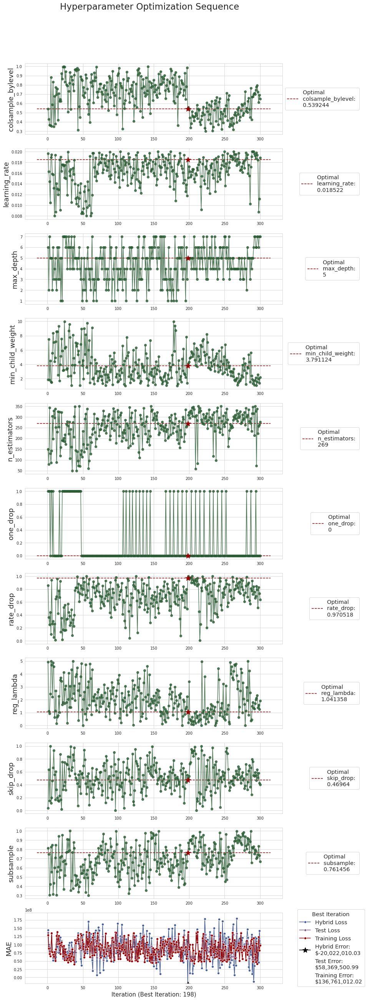

In [163]:
# plot informed search history
plot_param_search(xgbr_trials_dart)

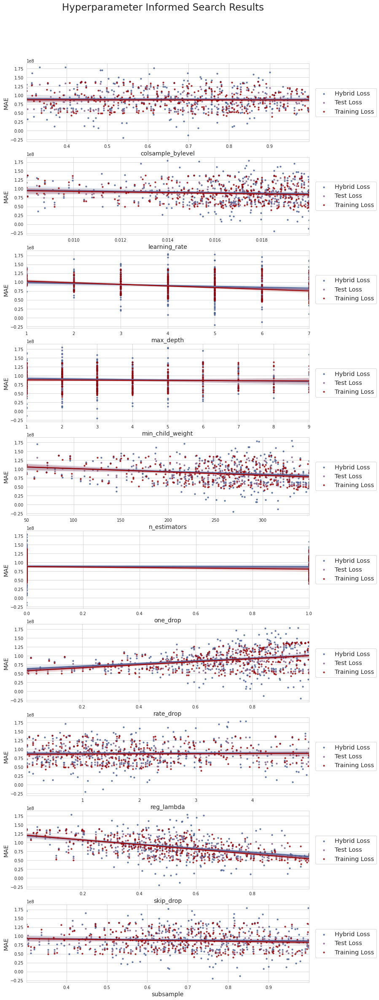

In [164]:
# plot hyperparameters vs. mean absolute errors
plot_maes(xgbr_trials_dart)

Looking at these plots, it is obvious that the minimization of the overfitting is the main goal for this method.<br>
All of the average MAE lines are way higher than the ones produces by the previous trials.

Now, I believe this is as far as I can traditionally tune the hyperparameters, but I have one more card to play.<br>
I'm going to cherry pick the ranges of hyperparameters from trials 12 and 13, the last two before the detour.<br>
This will squeze the search into a tight area I know is fruitful to see if I can hunt for lower ground.<br>
After extensively searching for a good local minimum, I'm settling down into it to see if I've found its true bottom.<br>
As I mentioned before the sidetrack, I will put the number of trees back to 250.

In [165]:
def get_param_range(trials_lst, loss_thresh, ratio_thresh):
    """Returns DataFrame with range of hyperparameters from best models of trials"""
    # create empty objects to hold sorted values
    param_dict = defaultdict(list)
    param_range_dict = defaultdict(list)
    best_models_lst = []
    # roll through trial objects
    for trial in trials_lst:
        # get each model from trial object
        for model in trial:
            # sort models by performance
            if (model['result']['loss'] < loss_thresh
               ) & (model['result']['scores_ratio'] > ratio_thresh):
                # extract desired models
                best_models_lst.append(model)
        # roll through best models
        for best_model in best_models_lst:
            # extract hyperparameter values of desired models
            for param, val in best_model['result']['params'].items():
                param_dict[param].append(val)
    # roll through each hyperparameter
    for hp, val_lst in param_dict.items():
        # extract range of hyperparameter values for all best models in trails objects
        param_range_dict[hp].append((np.min(val_lst), np.max(val_lst)))
        
    return pd.DataFrame(param_range_dict)

In [166]:
# assemble desired trial runs
_lst = [xgbr_trials_12, 
         xgbr_trials_13
       ]
# extract range for hyperparameters of best models
get_param_range(_lst, 5.92e7, 0.86)

,colsample_bylevel,learning_rate,max_depth,min_child_weight,n_estimators,reg_lambda,subsample
0,"(0.8597300464149354, 0.9630187284987796)","(0.01201209559435497, 0.01536996332358471)","(6, 6)","(1, 1)","(213, 240)","(0.09053021101551861, 0.6595317608943911)","(0.7402491559005855, 0.9034396487018275)"


I will use these narrow ranges to search within the local minimum, where the best models were found by the algorithm.

 > **xgbr_trials_14**

In [167]:
# instantiate trials object for XGBoost Regressor optimization
xgbr_trials_14 = Trials()
# instantiate iteration marker
global_iterations = 0
# instantiate batch marker
global_batches = 0
# instantiate trial marker
global_trials = 0

In [168]:
# create informed search space  
hp_space = {
    'colsample_bylevel': hp.uniform('colsample_bylevel', 0.85, 0.97), 
    'learning_rate': hp.uniform('learning_rate', 0.012, 0.016),
    'max_depth': ho_scope.int(hp.uniform('max_depth', 1, 8)), 
    'min_child_weight': ho_scope.int(hp.uniform('min_child_weight', 1, 10)), 
    'n_estimators': ho_scope.int(hp.uniform('n_estimators', 210, 240)), 
    'reg_lambda': hp.uniform('reg_lambda', 0.09, 0.7),
    'subsample': hp.uniform('subsample', 0.74, 0.91)
}
# call optimization function
run_trial_batches(X_train, y_train, hp_space, xgbr_trials_14)
# save trials object
pickle.dump(xgbr_trials_14, open('./xgbr_trials/xgbr_trials_14.pkl', 'wb'))

100%|██████████| 700/700 [04:10<00:00,  2.79trial/s, best loss: 58857748.27339414]


Judging by the length of the run, there are many excellent models in this hyperparameter space.

In [169]:
# get results DataFrame
trials_14_df = make_trials_df(xgbr_trials_14)
trials_14_df.head(10)

,trial,batch,iteration,loss,training_scores,test_scores,scores_ratio,colsample_bylevel,learning_rate,max_depth,min_child_weight,n_estimators,reg_lambda,subsample
593,1,6,594,5.885775e+07,4.578476e+07,5.232125e+07,0.877436,0.956253,0.015488,6,1,226,0.442943,0.829338
581,1,6,582,5.890540e+07,4.582462e+07,5.236501e+07,0.877400,0.946144,0.015270,6,1,227,0.417028,0.828522
656,1,7,657,5.892527e+07,4.572772e+07,5.232649e+07,0.876111,0.947118,0.015367,6,1,228,0.426562,0.825164
483,1,5,484,5.893677e+07,4.590730e+07,5.242204e+07,0.878037,0.942964,0.015367,6,1,229,0.519261,0.825792
373,1,4,374,5.896010e+07,4.533725e+07,5.214868e+07,0.871756,0.938620,0.015564,6,1,233,0.384589,0.830190
578,1,6,579,5.897706e+07,4.558663e+07,5.228184e+07,0.874294,0.952495,0.015416,6,1,229,0.392657,0.830938
269,1,3,270,5.897833e+07,4.607202e+07,5.252518e+07,0.879399,0.951011,0.015185,6,1,229,0.544411,0.819459
606,1,7,607,5.898078e+07,4.586322e+07,5.242200e+07,0.877201,0.945709,0.015462,6,1,225,0.445874,0.830154
500,1,6,501,5.898094e+07,4.588208e+07,5.243151e+07,0.877401,0.929519,0.015394,6,1,228,0.493988,0.830783
507,1,6,508,5.898244e+07,4.533251e+07,5.215748e+07,0.871468,0.930529,0.015657,6,1,236,0.449320,0.827189


Sure enough, all of these models have lower hybrid losses than were found in any of the previous trials.<br>
Although, the complexity has risen, slightly.

It seems as though the depth and node weights are going to be set at 6 and 1, respectively.<br>
I will not have the search algorithm explore different values for those hyperparameters, any longer.<br>
Now, I will observe what happens when I remove those ranges.

 > **xgbr_trials_15**

In [170]:
# instantiate trials object for XGBoost Regressor optimization
xgbr_trials_15 = Trials()
# instantiate iteration marker
global_iterations = 0
# instantiate batch marker
global_batches = 0
# instantiate trial marker
global_trials = 0

In [171]:
# create informed search space  
hp_space = {
    'colsample_bylevel': hp.uniform('colsample_bylevel', 0.85, 0.97), 
    'learning_rate': hp.uniform('learning_rate', 0.012, 0.016),
    'max_depth': ho_scope.int(hp.uniform('max_depth', 6, 6.1)), 
    'n_estimators': ho_scope.int(hp.uniform('n_estimators', 210, 240)), 
    'reg_lambda': hp.uniform('reg_lambda', 0.09, 0.7),
    'subsample': hp.uniform('subsample', 0.74, 0.91)
}
# call optimization function
run_trial_batches(X_train, y_train, hp_space, xgbr_trials_15)
# save trials object
pickle.dump(xgbr_trials_15, open('./xgbr_trials/xgbr_trials_15.pkl', 'wb'))

100%|██████████| 300/300 [04:08<00:00,  1.21trial/s, best loss: 58923077.23167978]


The best hybrid loss is good, although not the best overall.

In [172]:
# get results DataFrame
trials_15_df = make_trials_df(xgbr_trials_15)
trials_15_df.head(10)

,trial,batch,iteration,loss,training_scores,test_scores,scores_ratio,colsample_bylevel,learning_rate,max_depth,n_estimators,reg_lambda,subsample
112,1,2,113,5.892308e+07,4.577194e+07,5.234751e+07,0.876612,0.950991,0.015666,6,232,0.605157,0.829601
295,1,3,296,5.896612e+07,4.602550e+07,5.249581e+07,0.878965,0.958606,0.015477,6,225,0.544047,0.829091
160,1,2,161,5.898740e+07,4.615478e+07,5.257109e+07,0.880248,0.933363,0.015844,6,217,0.563108,0.826999
141,1,2,142,5.899645e+07,4.646756e+07,5.273200e+07,0.883484,0.930678,0.014910,6,221,0.553840,0.826065
176,1,2,177,5.901015e+07,4.616864e+07,5.258940e+07,0.880290,0.951776,0.015217,6,222,0.488136,0.832602
225,1,3,226,5.901367e+07,4.666281e+07,5.283824e+07,0.885391,0.930517,0.014622,6,218,0.517288,0.823145
291,1,3,292,5.901680e+07,4.644057e+07,5.272868e+07,0.883006,0.953978,0.014598,6,228,0.595953,0.815989
252,1,3,253,5.902306e+07,4.571241e+07,5.236773e+07,0.875062,0.940797,0.015722,6,232,0.575239,0.831318
90,1,1,91,5.902424e+07,4.539574e+07,5.220999e+07,0.871954,0.939034,0.015476,6,237,0.465074,0.814011
271,1,3,272,5.903098e+07,4.682376e+07,5.292737e+07,0.886962,0.927163,0.014240,6,221,0.571792,0.815807


The models do seem to curtail overfitting a bit more, though.<br>
I will narrow the hyperparameter space, again, calling for better performances on the models.<br>
I'll expect the hybrid loss to be 100,000 less and the scores ratio to be 2% better.

In [173]:
# assemble desired trial runs
_lst = [xgbr_trials_14, 
        xgbr_trials_15
       ]
# extract range for hyperparameters of best models
get_param_range(_lst, 5.91e7, 0.88)

,colsample_bylevel,learning_rate,max_depth,min_child_weight,n_estimators,reg_lambda,subsample
0,"(0.9271632557615939, 0.9603069996520031)","(0.013566523993235277, 0.015844366758754475)","(6, 6)","(1, 1)","(213, 230)","(0.37346806011877426, 0.5959532645953854)","(0.8141546382844854, 0.8390004705748253)"


 > **xgbr_trials_16**

In [174]:
# instantiate trials object for XGBoost Regressor optimization
xgbr_trials_16 = Trials()
# instantiate iteration marker
global_iterations = 0
# instantiate batch marker
global_batches = 0
# instantiate trial marker
global_trials = 0

In [175]:
# create informed search space  
hp_space = {
    'colsample_bylevel': hp.uniform('colsample_bylevel', 0.92, 0.97), 
    'learning_rate': hp.uniform('learning_rate', 0.013, 0.016),
    'max_depth': ho_scope.int(hp.uniform('max_depth', 6, 6.1)), 
    'n_estimators': ho_scope.int(hp.uniform('n_estimators', 210, 230)), 
    'reg_lambda': hp.uniform('reg_lambda', 0.37, 0.6),
    'subsample': hp.uniform('subsample', 0.81, 0.84)
}
# call optimization function
run_trial_batches(X_train, y_train, hp_space, xgbr_trials_16)
# save trials object
pickle.dump(xgbr_trials_16, open('./xgbr_trials/xgbr_trials_16.pkl', 'wb'))

100%|██████████| 400/400 [04:12<00:00,  1.59trial/s, best loss: 58809425.79929472]


I get, yet another, best hybrid loss.

In [176]:
# get results DataFrame
trials_16_df = make_trials_df(xgbr_trials_16)
trials_16_df.head(10)

,trial,batch,iteration,loss,training_scores,test_scores,scores_ratio,colsample_bylevel,learning_rate,max_depth,n_estimators,reg_lambda,subsample
221,1,3,222,5.880943e+07,4.628735e+07,5.254839e+07,0.883167,0.952545,0.015550,6,217,0.542384,0.828930
245,1,3,246,5.881134e+07,4.630163e+07,5.255649e+07,0.883330,0.929586,0.015305,6,218,0.497473,0.829054
149,1,2,150,5.881294e+07,4.593397e+07,5.237345e+07,0.879343,0.951037,0.015493,6,226,0.522345,0.828975
92,1,1,93,5.884229e+07,4.607145e+07,5.245687e+07,0.880690,0.951819,0.015607,6,220,0.496889,0.829416
325,1,4,326,5.885165e+07,4.619956e+07,5.252560e+07,0.881946,0.961254,0.015307,6,222,0.514279,0.829297
322,1,4,323,5.886486e+07,4.601198e+07,5.243842e+07,0.879790,0.954278,0.015818,6,219,0.512527,0.829277
233,1,3,234,5.886993e+07,4.617028e+07,5.252011e+07,0.881463,0.938642,0.015806,6,215,0.499567,0.831451
269,1,3,270,5.887442e+07,4.648099e+07,5.267770e+07,0.884600,0.952331,0.015237,6,215,0.518458,0.829397
165,1,2,166,5.887851e+07,4.576199e+07,5.232025e+07,0.876867,0.949737,0.015654,6,228,0.499292,0.831616
390,1,4,391,5.888244e+07,4.617637e+07,5.252940e+07,0.881355,0.955442,0.015613,6,217,0.490351,0.829597


The best model has an exceptional overfit ratio, as well.

As this strategy seems to be working, I'll squeeze the space again.<br>
This time I'll raise the bar and expect the hybrid loss to be another 100,000 less.

In [177]:
# assemble desired trial runs
_lst = [xgbr_trials_16
       ]
# extract range for hyperparameters of best models
get_param_range(_lst, 5.9e7, 0.88)

,colsample_bylevel,learning_rate,max_depth,n_estimators,reg_lambda,subsample
0,"(0.927537140560481, 0.9628807332171555)","(0.015116755236514325, 0.0159933389547346)","(6, 6)","(211, 226)","(0.42931283351186, 0.5589041121049153)","(0.8144990115991448, 0.8326256168105027)"


 > **xgbr_trials_17**

In [178]:
# instantiate trials object for XGBoost Regressor optimization
xgbr_trials_17 = Trials()
# instantiate iteration marker
global_iterations = 0
# instantiate batch marker
global_batches = 0
# instantiate trial marker
global_trials = 0

In [179]:
# create informed search space  
hp_space = {
    'colsample_bylevel': hp.uniform('colsample_bylevel', 0.92, 0.97), 
    'learning_rate': hp.uniform('learning_rate', 0.015, 0.016),
    'max_depth': ho_scope.int(hp.uniform('max_depth', 6, 6.1)), 
    'n_estimators': ho_scope.int(hp.uniform('n_estimators', 210, 230)), 
    'reg_lambda': hp.uniform('reg_lambda', 0.42, 0.56),
    'subsample': hp.uniform('subsample', 0.81, 0.84)
}
# call optimization function
run_trial_batches(X_train, y_train, hp_space, xgbr_trials_17)
# save trials object
pickle.dump(xgbr_trials_17, open('./xgbr_trials/xgbr_trials_17.pkl', 'wb'))

100%|██████████| 300/300 [04:12<00:00,  1.19trial/s, best loss: 58786261.00537379]


This narrow hyperparameter space has produced another best model.

In [180]:
# get results DataFrame
trials_17_df = make_trials_df(xgbr_trials_17)
trials_17_df.head(10)

,trial,batch,iteration,loss,training_scores,test_scores,scores_ratio,colsample_bylevel,learning_rate,max_depth,n_estimators,reg_lambda,subsample
130,1,2,131,5.878626e+07,4.588804e+07,5.233715e+07,0.879168,0.930000,0.015582,6,223,0.455666,0.830004
85,1,1,86,5.885414e+07,4.569244e+07,5.227329e+07,0.876433,0.935303,0.015544,6,228,0.449738,0.828964
125,1,2,126,5.886063e+07,4.577471e+07,5.231767e+07,0.877307,0.961700,0.015675,6,224,0.451050,0.830040
277,1,3,278,5.887283e+07,4.576619e+07,5.231951e+07,0.877113,0.947064,0.015721,6,224,0.461465,0.830073
79,1,1,80,5.887632e+07,4.592106e+07,5.239869e+07,0.878735,0.941975,0.015419,6,225,0.475615,0.832233
1,1,1,2,5.887763e+07,4.645102e+07,5.266432e+07,0.884348,0.954866,0.015319,6,214,0.508937,0.829086
153,1,2,154,5.888555e+07,4.586591e+07,5.237573e+07,0.878053,0.941197,0.015363,6,226,0.459201,0.829098
230,1,3,231,5.889461e+07,4.625049e+07,5.257255e+07,0.882009,0.944594,0.015160,6,222,0.501749,0.823394
226,1,3,227,5.889742e+07,4.579405e+07,5.234574e+07,0.877156,0.961992,0.015616,6,226,0.479273,0.829339
283,1,3,284,5.889812e+07,4.587368e+07,5.238590e+07,0.878066,0.938548,0.015681,6,222,0.454723,0.829040


I'm not sure there's much space left to explore.<br>
I'll give it one more go.

In [181]:
# assemble desired trial runs
_lst = [xgbr_trials_17
       ]
# extract range for hyperparameters of best models
get_param_range(_lst, 5.89e7, 0.88)

,colsample_bylevel,learning_rate,max_depth,n_estimators,reg_lambda,subsample
0,"(0.9445943415258881, 0.954865536810115)","(0.015160083243246627, 0.015319392734025555)","(6, 6)","(214, 222)","(0.5017488701417396, 0.5089369120299589)","(0.8233942466488179, 0.8290856693918887)"


 > **xgbr_trials_18**

In [182]:
# instantiate trials object for XGBoost Regressor optimization
xgbr_trials_18 = Trials()
# instantiate iteration marker
global_iterations = 0
# instantiate batch marker
global_batches = 0
# instantiate trial marker
global_trials = 0

In [183]:
# create informed search space  
hp_space = {
    'colsample_bylevel': hp.uniform('colsample_bylevel', 0.94, 0.96), 
    'learning_rate': hp.uniform('learning_rate', 0.015, 0.016),
    'max_depth': ho_scope.int(hp.uniform('max_depth', 6, 6.1)), 
    'n_estimators': ho_scope.int(hp.uniform('n_estimators', 210, 225)), 
    'reg_lambda': hp.uniform('reg_lambda', 0.5, 0.51),
    'subsample': hp.uniform('subsample', 0.82, 0.83)
}
# call optimization function
run_trial_batches(X_train, y_train, hp_space, xgbr_trials_18, booster='dart')
# save trials object
pickle.dump(xgbr_trials_18, open('./xgbr_trials/xgbr_trials_18.pkl', 'wb'))

100%|██████████| 400/400 [16:41<00:00,  2.50s/trial, best loss: 59182925.3618796]


In [184]:
# get results DataFrame
trials_18_df = make_trials_df(xgbr_trials_18)
trials_18_df.head(10)

,trial,batch,iteration,loss,training_scores,test_scores,scores_ratio,colsample_bylevel,learning_rate,max_depth,n_estimators,reg_lambda,subsample
277,1,3,278,5.918293e+07,4.632169e+07,5.275231e+07,0.880470,0.949349,0.015000,6,222,0.507900,0.823379
231,1,3,232,5.921258e+07,4.597353e+07,5.259305e+07,0.876609,0.956209,0.015676,6,222,0.508143,0.822971
100,1,2,101,5.921663e+07,4.637511e+07,5.279587e+07,0.880779,0.947815,0.015648,6,213,0.502314,0.824118
200,1,3,201,5.921761e+07,4.610424e+07,5.266092e+07,0.877863,0.947943,0.015181,6,224,0.505749,0.825554
259,1,3,260,5.921789e+07,4.602311e+07,5.262050e+07,0.877002,0.958002,0.015707,6,221,0.509595,0.824057
181,1,2,182,5.922940e+07,4.629027e+07,5.275983e+07,0.879707,0.950608,0.015033,6,222,0.501341,0.823473
239,1,3,240,5.923035e+07,4.601102e+07,5.262068e+07,0.876854,0.957967,0.015749,6,220,0.509952,0.823603
274,1,3,275,5.923529e+07,4.586574e+07,5.255051e+07,0.875324,0.955283,0.015870,6,223,0.508614,0.823070
389,1,4,390,5.923898e+07,4.617650e+07,5.270774e+07,0.878422,0.949525,0.015210,6,223,0.504482,0.824124
315,1,4,316,5.923964e+07,4.592953e+07,5.258458e+07,0.875769,0.948087,0.015869,6,221,0.509766,0.825016


I believe I've bottomed out in this search space.

Finally, I've reached the end of my informed hyperparameter search.<br>
I'll take a final look back on the progression of the search.

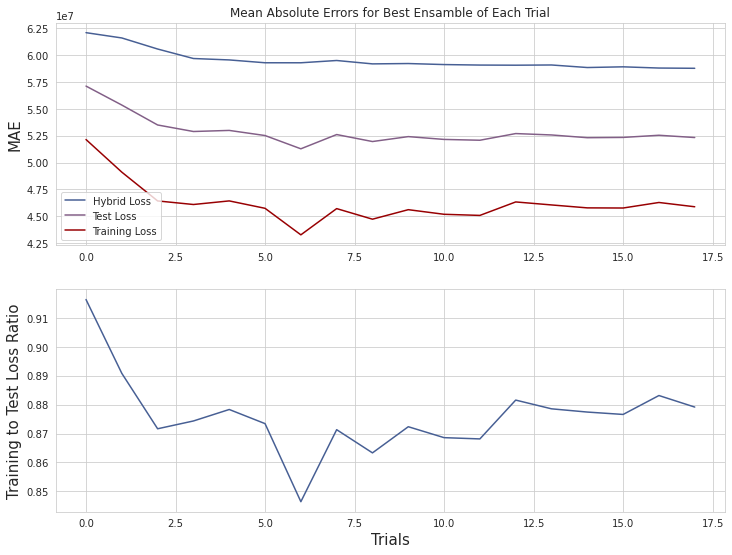

In [185]:
# assemble desired trial runs
_dict = {xgbr_trials_0: 0, 
         xgbr_trials_1: 1, 
         xgbr_trials_2: 2, 
         xgbr_trials_3: 3, 
         xgbr_trials_4: 4, 
         xgbr_trials_5: 5, 
         xgbr_trials_6: 6, 
         xgbr_trials_7: 7, 
         xgbr_trials_8: 8, 
         xgbr_trials_9: 9, 
         xgbr_trials_10: 10, 
         xgbr_trials_11: 11, 
         xgbr_trials_12: 12, 
         xgbr_trials_13: 13, 
         xgbr_trials_14: 14, 
         xgbr_trials_15: 15, 
         xgbr_trials_16: 16, 
         xgbr_trials_17: 17
        }
# plot the results, so far
plot_metrics(_dict)

The base gradient boosted model came with the lowest complexity, but its mean absolute error was very high.<br>
I will score this model on the validation data for comparison.

Tuning of the tree structure hyperparameters ended at trials 6.<br>
The best model at this point was the most overfit, but it did have the lowest test loss, overall.<br>
I will pull this model into the comparision, as well.

The stochastic hyperparameters were done being tuned by trails 10.<br>
During these trials, the main achievement was seen in finding models that were less overfit.

The regularization parameter was tuned during trails 11 and 12.<br>
Similar results to those obtained during the stochastic trails are seen here.<br>
That is, the complexity is reduced with only a slight gain with respect to loss optimization.

Finally, a few more points were shaved from the errors during the final trials.<br>
The best model of trials 16 had the best overfit ratio, for all models.<br>
The model with the optimal hybrid loss was found in trials 17.<br>
I will bring both of these models along for comparision, too.

 > **XGBoost Final Evaluation**

While evaluating the final model on the validation data, I'd, also, like to know how well my unorthodox strategy worked.

First, I'll see what the error of base model would have been, without any hyperparameter tuning.

In [186]:
def get_cv_mae(features, target, trials=None, iteration=None, params={}, booster='gbtree'):
    """Return CV average mean absolute error for given model"""
    # get fitted model
    model = get_xgbr_model(
        features, target, trials=trials, iteration=iteration, 
        params=params, booster=booster)
    # perform 10 fold cross validation
    cv_results = cross_val_score(model, features, target, 
                                 scoring='neg_mean_absolute_error', cv=10, n_jobs=-1)
    # convert scores to positive values
    results = cv_results * -1
    # get scores range
    results_range = (np.min(results), np.max(results))
    # get average score
    ave_result = np.mean(cv_results) * -1
        
    return ave_result

In [187]:
def get_validation_results(X, y, trials=None, iteration=None, params={}, booster='gbtree'):
    """Print final validation error & percent difference between training and validation"""
    # split dataset
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, random_state=27)
    # get errors
    train_mae = get_cv_mae(
        X_train, y_train, trials=trials, iteration=iteration, params=params, booster=booster)
    test_mae = get_cv_mae(
        X_test, y_test, trials=trials, iteration=iteration, params=params, booster=booster)
    # get percent difference between training and test errors
    val_error = np.absolute(train_mae - test_mae) / test_mae
    
    print('Validation Error: ${:,.2f}'.format(
        test_mae) + '   Percent off from Training Error: {:,.2f}%'.format(val_error * 100))

In [188]:
# get validation results without tuning
get_validation_results(X, y)

Validation Error: $66,396,185.60   Percent off from Training Error: 13.96%


The base model's error is nearly 14% worse on the validation set than it was on the training data.

Next, I'll find out how the model with the best test score did on the validation set.<br>
Recall, the test score was the first part of my hybrid loss function.<br>
This is the loss value that's the standard one to optimize.

In [189]:
# get validation results on model with best test scores during training
get_validation_results(X, y, trials=xgbr_trials_6)

Validation Error: $61,587,430.98   Percent off from Training Error: 16.73%


The model is more accurate than the base model, but not by as much as the test scores would have led us to believe.<br>
The increase in complexity has resulted in a more overfit model.

I will move on to the model with the best training to test ratio.<br>
This metric was the second part of my hybrid loss function.

In [190]:
# get validation results on model with best overfit score
get_validation_results(X, y, trials=xgbr_trials_16)

Validation Error: $60,720,274.34   Percent off from Training Error: 13.02%


The model that did the best with the overfitting metric outperformed the model with the best traditional metric.<br>
Having the better training to test ratio, it was more reliable, as well.

Finally, I'll observe the performance of the final model with the best hybrid loss.<br>
Finding this model was the goal of this hyperparameter search using my unique method of optimization.

In [191]:
# get validation results on model with best hybrid score
get_validation_results(X, y, trials=xgbr_trials_17)

Validation Error: $60,697,939.90   Percent off from Training Error: 13.38%


Great! This model performed the best on the validation data.<br>
It is only slightly more overfit than the model that was the least complex.<br>
Both models are very close to each other with respect to both metrics of the hybrid loss.<br>
Which one is better would depend on which metric is more important to the specific domain of the inquiry at hand.

After much effort and persistance, I believe my method shows promise.<br>
It may be possible to expand this idea by introducing a weighting term in the hybrid loss function.<br>
The influence of either part of the function could be further tuned to better suit specific domain needs.<br>
If accuracy was required more than generalization, the function could be tuned to pursue specific metric goals.